In [2]:
#!pip install bertopic datasets accelerate bitsandbytes xformers adjustText

In [25]:
import json
import urllib
import utils
import os

#import httpx
import time
import requests
import textwrap

import pandas as pd
import numpy as np
import sys
from llama_cpp import Llama

from collections import Counter

from api_key import WOS_API_KEY

from requests import Session

from pprint import pprint

import sys 
import re
from tqdm import tqdm
tqdm.pandas(desc="progress-bar")

from sentence_transformers import SentenceTransformer
from gensim.models.ldamodel import LdaModel
from gensim.models.coherencemodel import CoherenceModel
from gensim.models import Word2Vec
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

from bertopic._utils import *

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from bertopic.vectorizers import ClassTfidfTransformer
#from bertopic.vectorizers._ctfidf import ClassTfidfTransformer
from bertopic.dimensionality import BaseDimensionalityReduction
from sklearn.linear_model import LogisticRegression
from bertopic.backend import WordDocEmbedder

import gensim.downloader as api
from gensim.utils import simple_preprocess
from gensim.corpora import Dictionary
from gensim.models import TfidfModel
from gensim.similarities import WordEmbeddingSimilarityIndex
from bertopic import BERTopic
from hdbscan import HDBSCAN

from matplotlib_venn import venn3
from venn import venn


import arxiv
import urllib
import feedparser
#import arxivscraper
import xml.etree.ElementTree as ET
from difflib import SequenceMatcher

from re import sub
from multiprocessing import cpu_count

from gensim.similarities import SparseTermSimilarityMatrix
from gensim.similarities import SoftCosineSimilarity

from xgboost import XGBClassifier
import argparse
from keybert import KeyBERT
from sklearn.metrics.pairwise import cosine_similarity

from autocorrect import Speller
import tldextract

from itertools import combinations
from nltk import skipgrams
import umap
import itertools
import collections
import re
import networkx as nx
from itertools import chain

import matplotlib.pyplot as plt
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
import seaborn as sns
import matplotlib as mpl
from pylab import rcParams
sns.set(font_scale=1.5)
sns.set_style("whitegrid")
sns.set_theme(style='white')
#% matplotlib inline
from datetime import datetime

import plotly.graph_objs as go
import plotly.offline as pyo
import plotly.figure_factory as ff
import plotly.express as px
from plotly import tools
from plotly.subplots import make_subplots
from plotly.offline import iplot

from textblob import TextBlob, Word, Blobber
from textblob.classifiers import NaiveBayesClassifier
from textblob.taggers import NLTKTagger

import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.stem.porter import PorterStemmer 
from nltk.stem import WordNetLemmatizer
nltk.download('omw-1.4')
from nltk.tokenize import word_tokenize
nltk.download('maxent_ne_chunker')
nltk.download('words')

import spacy
nlp = spacy.load('en_core_web_sm')

import PIL
import numpy as np
import requests

import datamapplot
import re

from gensim.models import word2vec
import pickle
import gzip
import argparse
import torch
from transformers import BertTokenizer, BertModel
from bertopic.representation import KeyBERTInspired, LlamaCPP
from langchain.chains import LLMChain
from langchain_community.llms import LlamaCpp
from bertopic.representation import MaximalMarginalRelevance
from bertopic.representation import PartOfSpeech

import gensim.corpora as corpora
from gensim.models.coherencemodel import CoherenceModel

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/aditidutta/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     /Users/aditidutta/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     /Users/aditidutta/nltk_data...
[nltk_data]   Package maxent_ne_chunker is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     /Users/aditidutta/nltk_data...
[nltk_data]   Package words is already up-to-date!


In [2]:
#from huggingface_hub import notebook_login
#notebook_login()

Advanced search is deduced from here: https://images.webofknowledge.com/images/help/WOS/hp_advanced_search.html

The full list of Web of Sciences categories are found in here: https://images.webofknowledge.com/images/help/WOS/hp_subject_category_terms_tasca.html

### Research Areas

Research areas are classified into five broad categories: 

- Arts & Humanities
- Life Sciences & Biomedicine
- Physical Sciences
- Social Sciences
- Technology





In [3]:
####### Social Sciences categories ######
'''
# Sending the initial request
SEARCH_QUERY = 'TS=((misogyn* OR sexis* OR (gender NEAR/10 discrim*) OR (gender NEAR/10 stereoty*) OR (gender NEAR/10 violence) OR (gender NEAR/10 based)) NEAR/200 (detect* OR identif* OR predict* OR classif*)) AND WC=(“Archaeology” OR “Area Studies” OR “Biomedical Social Sciences” OR “Business %26 Economics” OR “Communication” OR “Criminology %26 Penology” OR “Cultural Studies” OR “Demography” OR “Development Studies” OR “Education %26 Educational Research” OR “Ethnic Studies” OR “Family Studies” OR “Geography” OR “Government %26 Law” OR “International Relations” OR “Linguistics” OR “Mathematical Methods In Social Sciences” OR “Psychology” OR “Public Administration” OR “Social Issues” OR “Social Sciences Other Topics” OR "Social Work" OR “Sociology” OR “Urban Studies” OR “Women\'s Studies”) AND PY=2012-2022'
HEADERS = {'X-APIkey': WOS_API_KEY}
DATABASE_ID = 'WOS' 

test_request = requests.get(f'https://api.clarivate.com/api/wos?databaseId={DATABASE_ID}&usrQuery={SEARCH_QUERY}&'
                            f'count=0&firstRecord=1', headers=HEADERS)
data = test_request.json()

total_documents_found = data['QueryResult']['RecordsFound']
requests_required = ((total_documents_found - 1) // 100 ) + 1
for i in range(0, requests_required):
    request = requests.get(f'https://api.clarivate.com/api/wos?databaseId=WOS&usrQuery={SEARCH_QUERY}&'
                                      f'count=100&firstRecord={i}01', headers=HEADERS)
    data = request.json()
    results = data['Data']['Records']['records']['REC']
    with open(f'data/clarivate_cat/social_sciences/searches_{i}.json', "w") as outfile:
        json.dump(results, outfile)

    time.sleep(2)
'''

'\n# Sending the initial request\nSEARCH_QUERY = \'TS=((misogyn* OR sexis* OR (gender NEAR/10 discrim*) OR (gender NEAR/10 stereoty*) OR (gender NEAR/10 violence) OR (gender NEAR/10 based)) NEAR/200 (detect* OR identif* OR predict* OR classif*)) AND WC=(“Archaeology” OR “Area Studies” OR “Biomedical Social Sciences” OR “Business %26 Economics” OR “Communication” OR “Criminology %26 Penology” OR “Cultural Studies” OR “Demography” OR “Development Studies” OR “Education %26 Educational Research” OR “Ethnic Studies” OR “Family Studies” OR “Geography” OR “Government %26 Law” OR “International Relations” OR “Linguistics” OR “Mathematical Methods In Social Sciences” OR “Psychology” OR “Public Administration” OR “Social Issues” OR “Social Sciences Other Topics” OR "Social Work" OR “Sociology” OR “Urban Studies” OR “Women\'s Studies”) AND PY=2012-2022\'\nHEADERS = {\'X-APIkey\': WOS_API_KEY}\nDATABASE_ID = \'WOS\' \n\ntest_request = requests.get(f\'https://api.clarivate.com/api/wos?databaseId={

In [4]:
###### Technology categories ####

'''
# Sending the initial request
SEARCH_QUERY = 'TS=((misogyn* OR sexis* OR (gender NEAR/10 discrim*) OR (gender NEAR/10 stereoty*) OR (gender NEAR/10 violence) OR (gender NEAR/10 based)) NEAR/200 (detect* OR identif* OR predict* OR classif*)) AND WC=(“Acoustics” OR “Automation %26 Control Systems” OR “Computer Science” OR “Construction %26 Building Technology” OR “Energy %26 Fuels” OR “Engineering” OR “Imaging Science %26 Photographic Technology” OR “Information Science %26 Library Science” OR “Instruments %26 Instrumentation” OR “Materials Science” OR “Mechanics” OR “Metallurgy %26 Metallurgical Engineering” OR “Microscopy” OR "Nuclear Science %26 Technology" OR “Operations Research %26 Management Science” OR “Remote Sensing” OR “Robotics” OR “Science %26 Technology Other Topics” OR “Spectroscopy” OR “Telecommunications” OR “Transportation”) AND PY=2012-2022'
HEADERS = {'X-APIkey': WOS_API_KEY}
DATABASE_ID = 'WOS' 

test_request = requests.get(f'https://api.clarivate.com/api/wos?databaseId={DATABASE_ID}&usrQuery={SEARCH_QUERY}&'
                            f'count=0&firstRecord=1', headers=HEADERS)
data = test_request.json()

total_documents_found = data['QueryResult']['RecordsFound']
requests_required = ((total_documents_found - 1) // 100 ) + 1
for i in range(0, requests_required):
    request = requests.get(f'https://api.clarivate.com/api/wos?databaseId={DATABASE_ID}&usrQuery={SEARCH_QUERY}&'
                                      f'count=100&firstRecord={i}01', headers=HEADERS)
    data = request.json()
    results = data['Data']['Records']['records']['REC']
    with open(f'data/clarivate_cat/technology/searches_{i}.json', "w") as outfile:
        json.dump(results, outfile)

    time.sleep(2)
'''

'\n# Sending the initial request\nSEARCH_QUERY = \'TS=((misogyn* OR sexis* OR (gender NEAR/10 discrim*) OR (gender NEAR/10 stereoty*) OR (gender NEAR/10 violence) OR (gender NEAR/10 based)) NEAR/200 (detect* OR identif* OR predict* OR classif*)) AND WC=(“Acoustics” OR “Automation %26 Control Systems” OR “Computer Science” OR “Construction %26 Building Technology” OR “Energy %26 Fuels” OR “Engineering” OR “Imaging Science %26 Photographic Technology” OR “Information Science %26 Library Science” OR “Instruments %26 Instrumentation” OR “Materials Science” OR “Mechanics” OR “Metallurgy %26 Metallurgical Engineering” OR “Microscopy” OR "Nuclear Science %26 Technology" OR “Operations Research %26 Management Science” OR “Remote Sensing” OR “Robotics” OR “Science %26 Technology Other Topics” OR “Spectroscopy” OR “Telecommunications” OR “Transportation”) AND PY=2012-2022\'\nHEADERS = {\'X-APIkey\': WOS_API_KEY}\nDATABASE_ID = \'WOS\' \n\ntest_request = requests.get(f\'https://api.clarivate.com/

In [5]:
#### Computer Science ############

'''
# Sending the initial request
SEARCH_QUERY = 'TS=((misogyn* OR sexis* OR (gender NEAR/10 discrim*) OR (gender NEAR/10 stereoty*) OR (gender NEAR/10 violence) OR (gender NEAR/10 based)) NEAR/200 (detect* OR identif* OR predict* OR classif*)) AND WC=(“Computer Science” OR “Artificial Intelligence” OR “Theory %26 Methods” OR “Engineering” OR “Software Engineering” OR “Scientific Disciplines” OR “Automation %26 Control Systems” OR “Mathematical” OR “Mathematics” OR “Mathematical Methods”) AND PY=2012-2022'
HEADERS = {'X-APIkey': WOS_API_KEY}
DATABASE_ID = 'WOS' 

test_request = requests.get(f'https://api.clarivate.com/api/wos?databaseId={DATABASE_ID}&usrQuery={SEARCH_QUERY}&'
                            f'count=0&firstRecord=1', headers=HEADERS)
data = test_request.json()

total_documents_found = data['QueryResult']['RecordsFound']
requests_required = ((total_documents_found - 1) // 100 ) + 1
for i in range(0, requests_required):
    request = requests.get(f'https://api.clarivate.com/api/wos?databaseId={DATABASE_ID}&usrQuery={SEARCH_QUERY}&'
                                      f'count=100&firstRecord={i}01', headers=HEADERS)
    data = request.json()
    results = data['Data']['Records']['records']['REC']
    with open(f'data/research_cat/comp_sci/searches_{i}.json', "w") as outfile:
        json.dump(results, outfile)

    time.sleep(2)
'''

'\n# Sending the initial request\nSEARCH_QUERY = \'TS=((misogyn* OR sexis* OR (gender NEAR/10 discrim*) OR (gender NEAR/10 stereoty*) OR (gender NEAR/10 violence) OR (gender NEAR/10 based)) NEAR/200 (detect* OR identif* OR predict* OR classif*)) AND WC=(“Computer Science” OR “Artificial Intelligence” OR “Theory %26 Methods” OR “Engineering” OR “Software Engineering” OR “Scientific Disciplines” OR “Automation %26 Control Systems” OR “Mathematical” OR “Mathematics” OR “Mathematical Methods”) AND PY=2012-2022\'\nHEADERS = {\'X-APIkey\': WOS_API_KEY}\nDATABASE_ID = \'WOS\' \n\ntest_request = requests.get(f\'https://api.clarivate.com/api/wos?databaseId={DATABASE_ID}&usrQuery={SEARCH_QUERY}&\'\n                            f\'count=0&firstRecord=1\', headers=HEADERS)\ndata = test_request.json()\n\ntotal_documents_found = data[\'QueryResult\'][\'RecordsFound\']\nrequests_required = ((total_documents_found - 1) // 100 ) + 1\nfor i in range(0, requests_required):\n    request = requests.get(f\'h

In [6]:
#### Computer Science ############
'''
# Sending the initial request
SEARCH_QUERY = 'TS=((misogyn* OR sexis* OR (gender NEAR/10 discrim*) OR (gender NEAR/10 stereoty*) OR (gender NEAR/10 violence) OR (gender NEAR/10 based)) NEAR/200 (detect* OR identif* OR predict* OR classif*)) AND WC=((“Computer Science” OR “Artificial Intelligence” OR “Theory %26 Methods” OR “Engineering” OR “Software Engineering” OR “Scientific Disciplines” OR “Automation %26 Control Systems” OR “Mathematical” OR “Mathematics” OR “Mathematical Methods”) NOT (“History” OR “Political Science” OR “Women\'s Studies” OR “Social Sciences” OR “International Relations” OR “History %26 Philosophy Of Science” OR “Linguistics” OR “Anthropology” OR “Sociology” OR “Social Work” OR “Language %26 Linguistics” OR “Information Science” OR “Psychology” OR “Social” OR “Ethnic Studies” OR “Philosophy” OR “Psychiatry”)) AND PY=2012-2022'
HEADERS = {'X-APIkey': WOS_API_KEY}
DATABASE_ID = 'WOS' 

test_request = requests.get(f'https://api.clarivate.com/api/wos?databaseId={DATABASE_ID}&usrQuery={SEARCH_QUERY}&'
                            f'count=0&firstRecord=1', headers=HEADERS)
data = test_request.json()

total_documents_found = data['QueryResult']['RecordsFound']
requests_required = ((total_documents_found - 1) // 100 ) + 1
for i in range(0, requests_required):
    request = requests.get(f'https://api.clarivate.com/api/wos?databaseId={DATABASE_ID}&usrQuery={SEARCH_QUERY}&'
                                      f'count=100&firstRecord={i}01', headers=HEADERS)
    data = request.json()
    results = data['Data']['Records']['records']['REC']
    with open(f'data/research_cat/comp_sci_2/searches_{i}.json', "w") as outfile:
        json.dump(results, outfile)

    time.sleep(2)
'''

'\n# Sending the initial request\nSEARCH_QUERY = \'TS=((misogyn* OR sexis* OR (gender NEAR/10 discrim*) OR (gender NEAR/10 stereoty*) OR (gender NEAR/10 violence) OR (gender NEAR/10 based)) NEAR/200 (detect* OR identif* OR predict* OR classif*)) AND WC=((“Computer Science” OR “Artificial Intelligence” OR “Theory %26 Methods” OR “Engineering” OR “Software Engineering” OR “Scientific Disciplines” OR “Automation %26 Control Systems” OR “Mathematical” OR “Mathematics” OR “Mathematical Methods”) NOT (“History” OR “Political Science” OR “Women\'s Studies” OR “Social Sciences” OR “International Relations” OR “History %26 Philosophy Of Science” OR “Linguistics” OR “Anthropology” OR “Sociology” OR “Social Work” OR “Language %26 Linguistics” OR “Information Science” OR “Psychology” OR “Social” OR “Ethnic Studies” OR “Philosophy” OR “Psychiatry”)) AND PY=2012-2022\'\nHEADERS = {\'X-APIkey\': WOS_API_KEY}\nDATABASE_ID = \'WOS\' \n\ntest_request = requests.get(f\'https://api.clarivate.com/api/wos?d

In [7]:
#### Social Science ############
'''
# Sending the initial request
SEARCH_QUERY = 'TS=((misogyn* OR sexis* OR (gender NEAR/10 discrim*) OR (gender NEAR/10 stereoty*) OR (gender NEAR/10 violence) OR (gender NEAR/10 based)) NEAR/200 (detect* OR identif* OR predict* OR classif*)) AND WC=(“History” OR “Political Science” OR “Women\'s Studies” OR “Social Sciences” OR “International Relations” OR “History %26 Philosophy Of Science” OR “Linguistics” OR “Anthropology” OR “Sociology” OR “Social Work” OR “Language %26 Linguistics” OR “Information Science” OR “Psychology” OR “Social” OR “Ethnic Studies” OR “Philosophy” OR “Psychiatry”) AND PY=2012-2022'
HEADERS = {'X-APIkey': WOS_API_KEY}
DATABASE_ID = 'WOS' 

test_request = requests.get(f'https://api.clarivate.com/api/wos?databaseId={DATABASE_ID}&usrQuery={SEARCH_QUERY}&'
                            f'count=0&firstRecord=1', headers=HEADERS)
data = test_request.json()

total_documents_found = data['QueryResult']['RecordsFound']
requests_required = ((total_documents_found - 1) // 100 ) + 1
for i in range(0, requests_required):
    request = requests.get(f'https://api.clarivate.com/api/wos?databaseId={DATABASE_ID}&usrQuery={SEARCH_QUERY}&'
                                      f'count=100&firstRecord={i}01', headers=HEADERS)
    data = request.json()
    results = data['Data']['Records']['records']['REC']
    with open(f'data/research_cat/soc_sci/searches_{i}.json', "w") as outfile:
        json.dump(results, outfile)

    time.sleep(2)
'''

'\n# Sending the initial request\nSEARCH_QUERY = \'TS=((misogyn* OR sexis* OR (gender NEAR/10 discrim*) OR (gender NEAR/10 stereoty*) OR (gender NEAR/10 violence) OR (gender NEAR/10 based)) NEAR/200 (detect* OR identif* OR predict* OR classif*)) AND WC=(“History” OR “Political Science” OR “Women\'s Studies” OR “Social Sciences” OR “International Relations” OR “History %26 Philosophy Of Science” OR “Linguistics” OR “Anthropology” OR “Sociology” OR “Social Work” OR “Language %26 Linguistics” OR “Information Science” OR “Psychology” OR “Social” OR “Ethnic Studies” OR “Philosophy” OR “Psychiatry”) AND PY=2012-2022\'\nHEADERS = {\'X-APIkey\': WOS_API_KEY}\nDATABASE_ID = \'WOS\' \n\ntest_request = requests.get(f\'https://api.clarivate.com/api/wos?databaseId={DATABASE_ID}&usrQuery={SEARCH_QUERY}&\'\n                            f\'count=0&firstRecord=1\', headers=HEADERS)\ndata = test_request.json()\n\ntotal_documents_found = data[\'QueryResult\'][\'RecordsFound\']\nrequests_required = ((total

In [8]:
#### Social Science ############
'''
# Sending the initial request
SEARCH_QUERY = 'TS=((misogyn* OR sexis* OR (gender NEAR/10 discrim*) OR (gender NEAR/10 stereoty*) OR (gender NEAR/10 violence) OR (gender NEAR/10 based)) NEAR/200 (detect* OR identif* OR predict* OR classif*)) AND WC=((“History” OR “Political Science” OR “Women\'s Studies” OR “Social Sciences” OR “International Relations” OR “History %26 Philosophy Of Science” OR “Linguistics” OR “Anthropology” OR “Sociology” OR “Social Work” OR “Language %26 Linguistics” OR “Information Science” OR “Psychology” OR “Social” OR “Ethnic Studies” OR “Philosophy” OR “Psychiatry”) NOT (“Computer Science” OR “Artificial Intelligence” OR “Theory %26 Methods” OR “Engineering” OR “Software Engineering” OR “Scientific Disciplines” OR “Automation %26 Control Systems” OR “Mathematical” OR “Mathematics” OR “Mathematical Methods”)) AND PY=2012-2022'
HEADERS = {'X-APIkey': WOS_API_KEY}
DATABASE_ID = 'WOS' 

test_request = requests.get(f'https://api.clarivate.com/api/wos?databaseId={DATABASE_ID}&usrQuery={SEARCH_QUERY}&'
                            f'count=0&firstRecord=1', headers=HEADERS)
data = test_request.json()

total_documents_found = data['QueryResult']['RecordsFound']
requests_required = ((total_documents_found - 1) // 100 ) + 1
for i in range(0, requests_required):
    request = requests.get(f'https://api.clarivate.com/api/wos?databaseId={DATABASE_ID}&usrQuery={SEARCH_QUERY}&'
                                      f'count=100&firstRecord={i}01', headers=HEADERS)
    data = request.json()
    results = data['Data']['Records']['records']['REC']
    with open(f'data/research_cat/soc_sci_2/searches_{i}.json', "w") as outfile:
        json.dump(results, outfile)

    time.sleep(2)
'''

'\n# Sending the initial request\nSEARCH_QUERY = \'TS=((misogyn* OR sexis* OR (gender NEAR/10 discrim*) OR (gender NEAR/10 stereoty*) OR (gender NEAR/10 violence) OR (gender NEAR/10 based)) NEAR/200 (detect* OR identif* OR predict* OR classif*)) AND WC=((“History” OR “Political Science” OR “Women\'s Studies” OR “Social Sciences” OR “International Relations” OR “History %26 Philosophy Of Science” OR “Linguistics” OR “Anthropology” OR “Sociology” OR “Social Work” OR “Language %26 Linguistics” OR “Information Science” OR “Psychology” OR “Social” OR “Ethnic Studies” OR “Philosophy” OR “Psychiatry”) NOT (“Computer Science” OR “Artificial Intelligence” OR “Theory %26 Methods” OR “Engineering” OR “Software Engineering” OR “Scientific Disciplines” OR “Automation %26 Control Systems” OR “Mathematical” OR “Mathematics” OR “Mathematical Methods”)) AND PY=2012-2022\'\nHEADERS = {\'X-APIkey\': WOS_API_KEY}\nDATABASE_ID = \'WOS\' \n\ntest_request = requests.get(f\'https://api.clarivate.com/api/wos?d

In [9]:
#### Multidisciplinary ############

'''
# Sending the initial request
SEARCH_QUERY = 'TS=((misogyn* OR sexis* OR (gender NEAR/10 discrim*) OR (gender NEAR/10 stereoty*) OR (gender NEAR/10 violence) OR (gender NEAR/10 based)) NEAR/200 (detect* OR identif* OR predict* OR classif*)) AND WC=((“History” OR “Political Science” OR “Women\'s Studies” OR “Social Sciences” OR “International Relations” OR “History %26 Philosophy Of Science” OR “Linguistics” OR “Anthropology” OR “Sociology” OR “Social Work” OR “Language %26 Linguistics” OR “Information Science” OR “Psychology” OR “Social” OR “Ethnic Studies” OR “Philosophy” OR “Psychiatry”) AND (“Computer Science” OR “Artificial Intelligence” OR “Theory %26 Methods” OR “Engineering” OR “Software Engineering” OR “Scientific Disciplines” OR “Automation %26 Control Systems” OR “Mathematical” OR “Mathematics” OR “Mathematical Methods”)) AND PY=2012-2022'
HEADERS = {'X-APIkey': WOS_API_KEY}
DATABASE_ID = 'WOS' 

test_request = requests.get(f'https://api.clarivate.com/api/wos?databaseId={DATABASE_ID}&usrQuery={SEARCH_QUERY}&'
                            f'count=0&firstRecord=1', headers=HEADERS)
data = test_request.json()

total_documents_found = data['QueryResult']['RecordsFound']
requests_required = ((total_documents_found - 1) // 100 ) + 1
for i in range(0, requests_required):
    request = requests.get(f'https://api.clarivate.com/api/wos?databaseId={DATABASE_ID}&usrQuery={SEARCH_QUERY}&'
                                      f'count=100&firstRecord={i}01', headers=HEADERS)
    data = request.json()
    results = data['Data']['Records']['records']['REC']
    with open(f'data/research_cat/multi/searches_{i}.json', "w") as outfile:
        json.dump(results, outfile)

    time.sleep(2)
'''

'\n# Sending the initial request\nSEARCH_QUERY = \'TS=((misogyn* OR sexis* OR (gender NEAR/10 discrim*) OR (gender NEAR/10 stereoty*) OR (gender NEAR/10 violence) OR (gender NEAR/10 based)) NEAR/200 (detect* OR identif* OR predict* OR classif*)) AND WC=((“History” OR “Political Science” OR “Women\'s Studies” OR “Social Sciences” OR “International Relations” OR “History %26 Philosophy Of Science” OR “Linguistics” OR “Anthropology” OR “Sociology” OR “Social Work” OR “Language %26 Linguistics” OR “Information Science” OR “Psychology” OR “Social” OR “Ethnic Studies” OR “Philosophy” OR “Psychiatry”) AND (“Computer Science” OR “Artificial Intelligence” OR “Theory %26 Methods” OR “Engineering” OR “Software Engineering” OR “Scientific Disciplines” OR “Automation %26 Control Systems” OR “Mathematical” OR “Mathematics” OR “Mathematical Methods”)) AND PY=2012-2022\'\nHEADERS = {\'X-APIkey\': WOS_API_KEY}\nDATABASE_ID = \'WOS\' \n\ntest_request = requests.get(f\'https://api.clarivate.com/api/wos?d

In [29]:
SEARCH_QUERY = 'TI=(“Deep Learning for Hate Speech Detection in Tweets” OR “Automatic Misogyny Detection in Social Media Platforms using Attention-based Bidirectional-LSTM” OR “Online Hate Speech against Women: Automatic Identification of Misogyny and Sexism on Twitter”)'
HEADERS = {'X-APIkey': WOS_API_KEY}
DATABASE_ID = 'WOS' 

test_request = requests.get(f'https://api.clarivate.com/api/wos?databaseId={DATABASE_ID}&usrQuery={SEARCH_QUERY}&'
                            f'count=0&firstRecord=1', headers=HEADERS)
data = test_request.json()

total_documents_found = data['QueryResult']['RecordsFound']
requests_required = ((total_documents_found - 1) // 100 ) + 1

for i in range(0, requests_required):
    request = requests.get(f'https://api.clarivate.com/api/wos?databaseId={DATABASE_ID}&usrQuery={SEARCH_QUERY}&'
                                      f'count=100&firstRecord={i}01', headers=HEADERS)
    data = request.json()
    results = data['Data']['Records']['records']['REC']
    with open(f'data/research_cat/titles/searches_{i}.json', "w") as outfile:
        json.dump(results, outfile)

files = 'data/research_cat/titles/searches_0.json'


df_titles = pd.DataFrame()

with open(files, 'r') as f:
    data_temp = json.load(f)
data_temp = pd.json_normalize(data_temp)
df_titles = pd.concat([df_titles, data_temp], axis=0)  

df_titles = df_titles.reset_index(drop=True)
df_titles['index'] = df_titles.index

df_titles

ConnectionError: HTTPSConnectionPool(host='api.clarivate.com', port=443): Max retries exceeded with url: /api/wos?databaseId=WOS&usrQuery=TI=(%E2%80%9CDeep%20Learning%20for%20Hate%20Speech%20Detection%20in%20Tweets%E2%80%9D%20OR%20%E2%80%9CAutomatic%20Misogyny%20Detection%20in%20Social%20Media%20Platforms%20using%20Attention-based%20Bidirectional-LSTM%E2%80%9D%20OR%20%E2%80%9COnline%20Hate%20Speech%20against%20Women:%20Automatic%20Identification%20of%20Misogyny%20and%20Sexism%20on%20Twitter%E2%80%9D)&count=0&firstRecord=1 (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x2a2b16f50>: Failed to resolve 'api.clarivate.com' ([Errno 8] nodename nor servname provided, or not known)"))

### Adding the external files through the search query

#### Clarivate - Web of Science

In [288]:
SEARCH_QUERY = """TI=(
“Deep Learning for Hate Speech Detection in Tweets” OR “Automatic Misogyny Detection in Social Media Platforms using Attention-based Bidirectional-LSTM” OR “Online Hate Speech against Women: Automatic Identification of Misogyny and Sexism on Twitter” OR “Deep Learning Representations in Automatic Misogyny Identification: What Do We Gain and What Do We Miss?” OR “Developing a Multilingual Annotated Corpus of Misogyny and Aggression” OR “Using Convolutional Neural Networks to Classify Hate-Speech” OR “re You a Racist or Am I Seeing Things? Annotator Influence on Hate Speech Detection on Twitter” OR “Hateful Symbols or Hateful People? Predictive Features for Hate Speech Detection on Twitter” OR “Counterfactually Augmented Data and Unintended Bias: The Case of Sexism and Hate Speech Detection” OR “Automatic Identification and Classification of Misogynistic Language on Twitter” OR “\“Call me sexist, but.\” : Revisiting Sexism Detection Using Psychological Scales and Adversarial Samples” OR “When does a compliment become sexist? analysis and classification of ambivalent sexism using twitter data” OR “Sexism Identification using BERT and Data Augmentation” OR “Sentiment Polarization in Online Social Networks: The Flow of Hate Speech” OR “Multi-label categorization of accounts of sexism using a neural framework” OR “Fine-Grained Multi-label Sexism Classification Using a Semi-Supervised Multi-level Neural Approach” OR “Topic modelling of every-day sexism project entries” OR “Boosting Text Classification Performance on Sexist Tweets by Text Augmentation and Text Generation Using a Combination of Knowledge Graphs” OR “Unintended bias in misogyny detection” OR “\“Be nice to your wife! The restaurants are closed\”: Can Gender Stereotype Detection Improve Sexism Classification?” OR “Annotating online misogyny” OR “An Annotated Corpus for Sexism Detection in French Tweets” OR “An expert annotated dataset for the detection of online misogyny” OR “Automatic Detection of Sexist Statements Commonly Used at the Workplace” OR “Automatic sexism detection with multilingual transformer models” OR “A Comparison of Machine Learning Approaches for Detecting Misogynistic Speech in Urban Dictionary” OR “Hateminers: Detecting hate speech against women” OR “Automatic Misogyny Identification Using Pretrained Transformers” OR “Sexism Identification in Social Networks using a Multi-Task Learning System” OR “\“Hold on honey, men at work\”: A semi-supervised approach to detecting sexism in sitcoms” OR “Abusive language detection with graph convolutional networks” OR “Misogynistic Tweet Detection: Modelling CNN with Small Datasets” OR “BERT of all trades, master of some” OR “Exploration of Misogyny in Spanish and English Tweets” OR “Misogyny Identification Through SVM at IberEval 2018” OR “Detecting misogyny and xenophobia in Spanish tweets using language technologies” OR “Entropy-based attention regularization frees unintended bias mitigation from lists” OR “Improving Sentence Embedding Similarity with Misogyny Lexicons for Automatic Misogyny Identification in Italian Tweets” OR “Using Sentence embeddings to Identify Hate Speech Against Immigrants and Women in Twitter” OR “Detection of Multilingual Aggressive, Gender Biased, and Communally Charged Tweets using Ensemble and Fine-Tuned IndicBERT” OR “XLM-RoBERTa with ordered neurons LSTM for classification task at EVALITA 2020” OR “Multi-dimensional gender bias classification” OR “Unintended Bias Evaluation: An Analysis of Hate Speech Detection and Gender Bias Mitigation on Social Media Using Ensemble Learning” OR “MT-GAN-BERT: Multi-Task and Generative Adversarial Learning for Sustainable Language Processing” OR “Exploring Misogyny across the Manosphere in Reddit”)
"""
HEADERS = {'X-APIkey': WOS_API_KEY}
DATABASE_ID = 'WOS' 

request_json = {"databaseId": DATABASE_ID,
                "usrQuery": f"{SEARCH_QUERY}",
                "lang": 'en',
                "count": 100, # Number of records to return, must be 0-100
                "firstRecord": 1, # Specific record, if any within the result set to return. Cannot be less than 1. Keeping it as 1 in here.
                }

request = requests.post('https://wos-api.clarivate.com/api/wos',
                        json=request_json,
                        headers=HEADERS)
data = request.json()
print(data)

total_documents_found = data['QueryResult']['RecordsFound']
#requests_required = ((total_documents_found - 1) // 100 ) + 1 #not required as less than 100
print(total_documents_found) #21

number = 0
for item in data['Data']['Records']['records']['REC']:
   with open(f'data/research_cat/titles/searches_{number}.json', "w") as outfile:
        json.dump(item, outfile)
   number+=1
   
string1 = 'data/research_cat/titles/searches_' 
string2 = '.json'

title_file = []
for i in range(0, number):  
    title_file.append(string1 + str(i) + string2)

df_titles = pd.DataFrame()

for lst in title_file:
    with open(lst, 'r') as f:
        data_temp = json.load(f)
    data_temp = pd.json_normalize(data_temp)
    df_titles = pd.concat([df_titles, data_temp], axis=0)  


df_titles = df_titles.reset_index(drop=True)
df_titles['index'] = df_titles.index

df_titles

{'Data': {'Records': {'records': {'REC': [{'UID': 'WOS:000863557001036', 'static_data': {'summary': {'pub_info': {'coverdate': 2021, 'journal_oas_gold': 'N', 'pubyear': 2021, 'sortdate': '2021-01-01', 'has_abstract': 'Y', 'pubtype': 'Book', 'page': {'end': 1350, 'begin': 1336, 'page_count': 15, 'content': '1336-1350'}}, 'names': {'count': 7, 'name': [{'seq_no': 1, 'role': 'author', 'claim_status': False, 'reprint': 'Y', 'last_name': 'Guest', 'display_name': 'Guest, Ella', 'daisng_id': 15628082, 'orcid_id': '0000-0001-8940-2871', 'full_name': 'Guest, Ella', 'addr_no': '1 2', 'data-item-ids': {'data-item-id': {'type': 'person', 'content': 'DWT-7679-2022', 'id-type': 'PreferredRID'}}, 'wos_standard': 'Guest, E', 'r_id': 'DWT-7679-2022', 'first_name': 'Ella', 'preferred_name': {'full_name': 'Guest, Ella', 'last_name': 'Guest', 'first_name': 'Ella'}}, {'seq_no': 2, 'role': 'author', 'claim_status': False, 'last_name': 'Vidgen', 'display_name': 'Vidgen, Bertie', 'daisng_id': 16053524, 'orcid

,UID,r_id_disclaimer,static_data.summary.pub_info.coverdate,static_data.summary.pub_info.journal_oas_gold,static_data.summary.pub_info.pubyear,static_data.summary.pub_info.sortdate,static_data.summary.pub_info.has_abstract,static_data.summary.pub_info.pubtype,static_data.summary.pub_info.page.end,static_data.summary.pub_info.page.begin,...,static_data.fullrecord_metadata.addresses.address_name.address_spec.full_address,static_data.summary.pub_info.has_citation_context,static_data.summary.pub_info.issue,static_data.summary.pub_info.special_issue,static_data.fullrecord_metadata.addresses.address_name.address_spec.street,static_data.fullrecord_metadata.addresses.address_name.address_spec.suborganizations.count,static_data.fullrecord_metadata.addresses.address_name.address_spec.suborganizations.suborganization,static_data.summary.conferences.conference.conf_locations.conf_location.conf_host,static_data.fullrecord_metadata.addresses.address_name.address_spec.state,index
0,WOS:000863557001036,ResearcherID data provided by Clarivate Analytics,2021,N,2021,2021-01-01,Y,Book,1350.0,1336.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
1,WOS:000859869504062,ResearcherID data provided by Clarivate Analytics,2022,N,2022,2022-01-01,Y,Book,4726.0,4716.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
2,WOS:000828767401013,ResearcherID data provided by Clarivate Analytics,2022,N,2022,2022-01-01,Y,Book,1119.0,1105.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
3,WOS:000830106100008,ResearcherID data provided by Clarivate Analytics,SEP 1 2022,N,2022,2022-04-14,Y,Journal,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
4,WOS:000813133100018,ResearcherID data provided by Clarivate Analytics,2021,N,2021,2021-01-01,Y,Book,140.0,133.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
5,WOS:000800532002108,ResearcherID data provided by Clarivate Analytics,2021,N,2021,2021-01-01,Y,Book in series,2711.0,2706.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
6,WOS:000724166100011,ResearcherID data provided by Clarivate Analytics,2020,N,2020,2020-01-01,Y,Book in series,115.0,104.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
7,WOS:000698679200047,ResearcherID data provided by Clarivate Analytics,2021,N,2021,2021-01-01,Y,Book,3197.0,3181.0,...,"IT Univ Copenhagen, Copenhagen, Denmark",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7
8,WOS:000694722600019,ResearcherID data provided by Clarivate Analytics,2021,N,2021,2021-01-01,Y,Book,185.0,180.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8
9,WOS:000685817800001,ResearcherID data provided by Clarivate Analytics,DEC 2021,Y,2021,2021-08-17,Y,Journal,379.0,359.0,...,NaN,Y,4.0,SI,NaN,NaN,NaN,NaN,NaN,9


#### ArXiv API

First search as a search query with the keywords as sexism and misogyny.

In [289]:
# Construct the default API client.
client = arxiv.Client()

# https://info.arxiv.org/help/api/user-manual.html#query_details


# For advanced query syntax documentation, see the arXiv API User Manual:
# https://arxiv.org/help/api/user-manual#query_details
#search = arxiv.Search(query = "ti:machine")

# Base api query url
base_url = 'http://export.arxiv.org/api/query?'

# Search parameters 
start = 0                     # retreive the first 5 results
#max_results = 5

query = 'all:sexism+OR+all:sexist+OR+all:misogyny+OR+all:misogynist+OR+all:%22gender+discrimination%22+OR+all:%22gender+violence%22+OR+all:%22gender+stereotype%22' # search for misogyny and sexism in all fields
max_results = 1000
url = f'{base_url}search_query={query}&max_results={max_results}'
resp = requests.get(url)
ns = { 'r':'http://www.w3.org/2005/Atom'}
root = ET.fromstring(resp.text)
all_papers = list()
entries = root.findall('r:entry',namespaces=ns)
for entry in entries :
    all_papers.append({l.tag[l.tag.index('}')+1:] :l.text for l in entry})


In [290]:
len(all_papers)


238

In [291]:
df_arxiv = pd.DataFrame(all_papers)
df_arxiv

,id,updated,published,title,summary,author,link,primary_category,category,comment,doi,journal_ref
0,http://arxiv.org/abs/2202.09099v2,2022-04-20T11:19:30Z,2022-02-18T09:41:37Z,AMS_ADRN at SemEval-2022 Task 5: A Suitable Im...,"Women are influential online, especially in ...",\n,None,None,None,NaN,NaN,NaN
1,http://arxiv.org/abs/1907.00510v1,2019-07-01T01:48:49Z,2019-07-01T01:48:49Z,Hidden in Plain Sight For Too Long: Using Text...,Objective: The goal of this study is to unde...,\n,None,None,None,NaN,NaN,NaN
2,http://arxiv.org/abs/1603.08832v1,2016-03-29T16:24:46Z,2016-03-29T16:24:46Z,Shirtless and Dangerous: Quantifying Linguisti...,"Imagine a princess asleep in a castle, waiti...",\n,None,None,None,in ICWSM 2016,NaN,NaN
3,http://arxiv.org/abs/2103.10195v1,2021-03-18T12:01:13Z,2021-03-18T12:01:13Z,Let-Mi: An Arabic Levantine Twitter Dataset fo...,Online misogyny has become an increasing wor...,\n,None,None,None,"10 pages, 2 figures, WANLP 2021 co-located wit...",NaN,NaN
4,http://arxiv.org/abs/1902.03089v1,2019-01-28T19:58:14Z,2019-01-28T19:58:14Z,How is Your Mood When Writing Sexist tweets? D...,Online social platforms have been the battle...,\n,None,None,None,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
233,http://arxiv.org/abs/2401.11663v1,2024-01-22T02:42:36Z,2024-01-22T02:42:36Z,"""I Got Flagged for Supposed Bullying, Even Tho...",The Human-Computer Interaction (HCI) communi...,\n,None,None,None,"24 paged, 1 Figure, accepted by CHI'24",10.1145/3613904.3642148,NaN
234,http://arxiv.org/abs/2210.11640v1,2022-10-20T23:55:50Z,2022-10-20T23:55:50Z,"Sinophobia, misogyny, facism, and many more: A...",Anti-Asian hate/toxic/racial speech has rece...,\n,None,None,None,NaN,NaN,NaN
235,http://arxiv.org/abs/2001.11552v1,2019-12-11T07:37:45Z,2019-12-11T07:37:45Z,Unwanted Advances in Higher Education: Uncover...,Sexual harassment in academia is often a hid...,\n,None,None,None,NaN,NaN,NaN
236,http://arxiv.org/abs/1811.09878v1,2018-11-24T19:11:41Z,2018-11-24T19:11:41Z,Hydra: A Peer to Peer Distributed Training & D...,The world needs diverse and unbiased data to...,\n,None,None,None,10 pages. arXiv admin note: text overlap with ...,NaN,NaN


In [292]:
df_arxiv.columns

Index(['id', 'updated', 'published', 'title', 'summary', 'author', 'link',
       'primary_category', 'category', 'comment', 'doi', 'journal_ref'],
      dtype='object')

In [293]:
df_arxiv['category'].value_counts(), df_arxiv['primary_category'].value_counts()

(Series([], Name: count, dtype: int64), Series([], Name: count, dtype: int64))

In [294]:
df_arxiv['summary'].iloc[0]

'  Women are influential online, especially in image-based social media such as\nTwitter and Instagram. However, many in the network environment contain gender\ndiscrimination and aggressive information, which magnify gender stereotypes and\ngender inequality. Therefore, the filtering of illegal content such as gender\ndiscrimination is essential to maintain a healthy social network environment.\nIn this paper, we describe the system developed by our team for SemEval-2022\nTask 5: Multimedia Automatic Misogyny Identification. More specifically, we\nintroduce two novel system to analyze these posts: a multimodal multi-task\nlearning architecture that combines Bertweet for text encoding with ResNet-18\nfor image representation, and a single-flow transformer structure which\ncombines text embeddings from BERT-Embeddings and image embeddings from several\ndifferent modules such as EfficientNet and ResNet. In this manner, we show that\nthe information behind them can be properly revealed. O

In [295]:
def clean_summary_arxv(text):
    text = text.lstrip()
    text = text.split('\n')
    text = " ".join(text)
    text = re.sub(' +', ' ', text) # remove multiple spaces
    text = text.rstrip()
    return text

In [296]:
clean_summary_arxv(df_arxiv['summary'].iloc[2])

"Imagine a princess asleep in a castle, waiting for her prince to slay the dragon and rescue her. Tales like the famous Sleeping Beauty clearly divide up gender roles. But what about more modern stories, borne of a generation increasingly aware of social constructs like sexism and racism? Do these stories tend to reinforce gender stereotypes, or counter them? In this paper, we present a technique that combines natural language processing with a crowdsourced lexicon of stereotypes to capture gender biases in fiction. We apply this technique across 1.8 billion words of fiction from the Wattpad online writing community, investigating gender representation in stories, how male and female characters behave and are described, and how authors' use of gender stereotypes is associated with the community's ratings. We find that male over-representation and traditional gender stereotypes (e.g., dominant men and submissive women) are common throughout nearly every genre in our corpus. However, onl

In [297]:
df_arxiv['summary'] = df_arxiv['summary'].apply(clean_summary_arxv)
df_arxiv['title'] = df_arxiv['title'].apply(clean_summary_arxv)

In [298]:
df_arxiv['published'].iloc[0]

'2022-02-18T09:41:37Z'

In [299]:
datetime_object = datetime.strptime(df_arxiv['published'].iloc[0], '%Y-%m-%dT%H:%M:%SZ')
datetime_object

datetime.datetime(2022, 2, 18, 9, 41, 37)

In [300]:
df_arxiv['published_year'] = df_arxiv['published'].apply(lambda x: datetime.strptime(x, '%Y-%m-%dT%H:%M:%SZ').year)
df_arxiv['updated_year'] = df_arxiv['updated'].apply(lambda x: datetime.strptime(x, '%Y-%m-%dT%H:%M:%SZ').year)
df_arxiv['updated_year']

0      2022
1      2019
2      2016
3      2021
4      2019
       ... 
233    2024
234    2022
235    2019
236    2018
237    2020
Name: updated_year, Length: 238, dtype: int64

In [301]:
pd.crosstab(df_arxiv['published_year'], df_arxiv['updated_year'])

updated_year,2003,2012,2014,2016,2017,2018,2019,2020,2021,2022,2023,2024
published_year,,,,,,,,,,,,
2003,1,0,0,0,0,0,0,0,0,0,0,0
2012,0,1,0,0,0,0,0,0,0,0,0,0
2014,0,0,1,0,0,0,0,0,0,0,0,0
2016,0,0,0,4,1,0,0,0,0,0,0,0
2017,0,0,0,0,8,1,0,0,0,0,0,0
2018,0,0,0,0,0,18,2,0,0,0,0,0
2019,0,0,0,0,0,0,15,2,1,0,1,0
2020,0,0,0,0,0,0,0,23,5,1,0,0
2021,0,0,0,0,0,0,0,0,36,5,3,0


In [302]:
df_arxiv['updated_year'].value_counts(), df_arxiv['published_year'].value_counts()

(updated_year
 2023    63
 2022    51
 2021    42
 2020    25
 2018    19
 2019    17
 2017     9
 2024     5
 2016     4
 2014     1
 2003     1
 2012     1
 Name: count, dtype: int64,
 published_year
 2023    54
 2022    51
 2021    44
 2020    29
 2018    20
 2019    19
 2017     9
 2016     5
 2024     4
 2014     1
 2003     1
 2012     1
 Name: count, dtype: int64)

In [303]:
# Remove the studies which were published in 2023

df_arxiv = df_arxiv[df_arxiv['published_year'] < 2023]
df_arxiv

,id,updated,published,title,summary,author,link,primary_category,category,comment,doi,journal_ref,published_year,updated_year
0,http://arxiv.org/abs/2202.09099v2,2022-04-20T11:19:30Z,2022-02-18T09:41:37Z,AMS_ADRN at SemEval-2022 Task 5: A Suitable Im...,"Women are influential online, especially in im...",\n,None,None,None,NaN,NaN,NaN,2022,2022
1,http://arxiv.org/abs/1907.00510v1,2019-07-01T01:48:49Z,2019-07-01T01:48:49Z,Hidden in Plain Sight For Too Long: Using Text...,Objective: The goal of this study is to unders...,\n,None,None,None,NaN,NaN,NaN,2019,2019
2,http://arxiv.org/abs/1603.08832v1,2016-03-29T16:24:46Z,2016-03-29T16:24:46Z,Shirtless and Dangerous: Quantifying Linguisti...,"Imagine a princess asleep in a castle, waiting...",\n,None,None,None,in ICWSM 2016,NaN,NaN,2016,2016
3,http://arxiv.org/abs/2103.10195v1,2021-03-18T12:01:13Z,2021-03-18T12:01:13Z,Let-Mi: An Arabic Levantine Twitter Dataset fo...,Online misogyny has become an increasing worry...,\n,None,None,None,"10 pages, 2 figures, WANLP 2021 co-located wit...",NaN,NaN,2021,2021
4,http://arxiv.org/abs/1902.03089v1,2019-01-28T19:58:14Z,2019-01-28T19:58:14Z,How is Your Mood When Writing Sexist tweets? D...,Online social platforms have been the battlefi...,\n,None,None,None,NaN,NaN,NaN,2019,2019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
227,http://arxiv.org/abs/2209.06899v1,2022-09-14T19:53:32Z,2022-09-14T19:53:32Z,"Out of One, Many: Using Language Models to Sim...",We propose and explore the possibility that la...,\n,None,None,None,NaN,10.18653/v1/2022.acl-long.60,NaN,2022,2022
234,http://arxiv.org/abs/2210.11640v1,2022-10-20T23:55:50Z,2022-10-20T23:55:50Z,"Sinophobia, misogyny, facism, and many more: A...",Anti-Asian hate/toxic/racial speech has recent...,\n,None,None,None,NaN,NaN,NaN,2022,2022
235,http://arxiv.org/abs/2001.11552v1,2019-12-11T07:37:45Z,2019-12-11T07:37:45Z,Unwanted Advances in Higher Education: Uncover...,Sexual harassment in academia is often a hidde...,\n,None,None,None,NaN,NaN,NaN,2019,2019
236,http://arxiv.org/abs/1811.09878v1,2018-11-24T19:11:41Z,2018-11-24T19:11:41Z,Hydra: A Peer to Peer Distributed Training & D...,The world needs diverse and unbiased data to t...,\n,None,None,None,10 pages. arXiv admin note: text overlap with ...,NaN,NaN,2018,2018


In [304]:
def prepare_title_url(text):
    text = text.strip()
    text = text.split('\n')
    text = " ".join(text)
    text = re.sub(' +', ' ', text) # remove multiple spaces
    text = re.sub(' ', '+', text)
    text = re.sub('"', '%22', text)
    text = text.split('(')
    text = "%28".join(text)
    text = text.split(')')
    text = "%29".join(text)
    return text

In [305]:
titles_url = df_arxiv['title'].apply(lambda x: prepare_title_url(x))
titles_url

0      AMS_ADRN+at+SemEval-2022+Task+5:+A+Suitable+Im...
1      Hidden+in+Plain+Sight+For+Too+Long:+Using+Text...
2      Shirtless+and+Dangerous:+Quantifying+Linguisti...
3      Let-Mi:+An+Arabic+Levantine+Twitter+Dataset+fo...
4      How+is+Your+Mood+When+Writing+Sexist+tweets?+D...
                             ...                        
227    Out+of+One,+Many:+Using+Language+Models+to+Sim...
234    Sinophobia,+misogyny,+facism,+and+many+more:+A...
235    Unwanted+Advances+in+Higher+Education:+Uncover...
236    Hydra:+A+Peer+to+Peer+Distributed+Training+&+D...
237    Discovering+and+Categorising+Language+Biases+i...
Name: title, Length: 180, dtype: object

In [306]:
#prepare_title_url(random_text)

In [307]:


# Construct the default API client.
client = arxiv.Client()

# https://info.arxiv.org/help/api/user-manual.html#query_details


# For advanced query syntax documentation, see the arXiv API User Manual:
# https://arxiv.org/help/api/user-manual#query_details
#search = arxiv.Search(query = "ti:machine")

# Base api query url
base_url = 'http://export.arxiv.org/api/query?'

# Search parameters 
start = 0                     # retreive the first 5 results
max_results = 1 # The most matched study

query = 'ti:Developing+a+Multilingual+Annotated+Corpus+of+Misogyny+and+Aggression'

url = f'{base_url}search_query={query}&start={start}&max_results={max_results}'
resp = requests.get(url)
ns = { 'r':'http://www.w3.org/2005/Atom'}
root = ET.fromstring(resp.text)
check_paper = list()
entries = root.findall('r:entry',namespaces=ns)
for entry in entries :
    check_paper.append({l.tag[l.tag.index('}')+1:] :l.text for l in entry})

check_paper


[{'id': 'http://arxiv.org/abs/2003.07428v1',
  'updated': '2020-03-16T20:19:21Z',
  'published': '2020-03-16T20:19:21Z',
  'title': 'Developing a Multilingual Annotated Corpus of Misogyny and Aggression',
  'summary': '  In this paper, we discuss the development of a multilingual annotated corpus\nof misogyny and aggression in Indian English, Hindi, and Indian Bangla as part\nof a project on studying and automatically identifying misogyny and communalism\non social media (the ComMA Project). The dataset is collected from comments on\nYouTube videos and currently contains a total of over 20,000 comments. The\ncomments are annotated at two levels - aggression (overtly aggressive, covertly\naggressive, and non-aggressive) and misogyny (gendered and non-gendered). We\ndescribe the process of data collection, the tagset used for annotation, and\nissues and challenges faced during the process of annotation. Finally, we\ndiscuss the results of the baseline experiments conducted to develop a\n

In [308]:
pd.DataFrame(check_paper)

,id,updated,published,title,summary,author,comment,link,primary_category,category
0,http://arxiv.org/abs/2003.07428v1,2020-03-16T20:19:21Z,2020-03-16T20:19:21Z,Developing a Multilingual Annotated Corpus of ...,"In this paper, we discuss the development of...",\n,Submitted for review to Second Workshop on Tro...,None,None,None


In [309]:
list_papers = ['Deep Learning Representations in Automatic Misogyny Identification: What Do We Gain and What Do We Miss?', 'Deep Learning for Hate Speech Detection in Tweets', 'Automatic Misogyny Detection in Social Media Platforms using Attention-based Bidirectional-LSTM', 'Online Hate Speech against Women: Automatic Identification of Misogyny and Sexism on Twitter', 'Online Hate Speech against Women: Automatic Identification of Misogyny and Sexism on Twitter', 'Developing a Multilingual Annotated Corpus of Misogyny and Aggression', 'Using Convolutional Neural Networks to Classify Hate-Speech', 'Are You a Racist or Am I Seeing Things? Annotator Influence on Hate Speech Detection on Twitter', 'Hateful Symbols or Hateful People? Predictive Features for Hate Speech Detection on Twitter', 'Counterfactually Augmented Data and Unintended Bias: The Case of Sexism and Hate Speech Detection', 'Automatic Identification and Classification of Misogynistic Language on Twitter', '“Call me sexist, but.” : Revisiting Sexism Detection Using Psychological Scales and Adversarial Samples', 'When does a compliment become sexist? analysis and classification of ambivalent sexism using twitter data', 'Sexism Identification using BERT and Data Augmentation-EXIST2021', 'Sentiment Polarization in Online Social Networks: The Flow of Hate Speech', 'Multi-label categorization of accounts of sexism using a neural framework', 'Fine-Grained Multi-label Sexism Classification Using a Semi-Supervised Multi-level Neural Approach', 'Topic modelling of every-day sexism project entries', 'Boosting Text Classification Performance on Sexist Tweets by Text Augmentation and Text Generation Using a Combination of Knowledge Graphs', 'Unintended bias in misogyny detection', '“Be nice to your wife! The restaurants are closed”: Can Gender Stereotype Detection Improve Sexism Classification?', 'Annotating online misogyny', 'An Annotated Corpus for Sexism Detection in French Tweets', 'An expert annotated dataset for the detection of online misogyny', 'Automatic Detection of Sexist Statements Commonly Used at the Workplace', 'Automatic sexism detection with multilingual transformer models', 'A Comparison of Machine Learning Approaches for Detecting Misogynistic Speech in Urban Dictionary', 'Hateminers: Detecting hate speech against women', 'Automatic Misogyny Identification Using Pretrained Transformers', 'Sexism Identification in Social Networks using a Multi-Task Learning System', 'Hold on honey, men at work”: A semi-supervised approach to detecting sexism in sitcoms', 'Abusive language detection with graph convolutional networks', 'Misogynistic Tweet Detection: Modelling CNN with Small Datasets', 'BERT of all trades, master of some', 'Exploration of Misogyny in Spanish and English Tweets', 'Misogyny Identification Through SVM at IberEval 2018', 'Detecting misogyny and xenophobia in Spanish tweets using language technologies', 'Entropy-based attention regularization frees unintended bias mitigation from lists', 'Improving Sentence Embedding Similarity with Misogyny Lexicons for Automatic Misogyny Identification in Italian Tweets', 'Using Sentence embeddings to Identify Hate Speech Against Immigrants and Women in Twitter', 'Detection of Multilingual Aggressive, Gender Biased, and Communally Charged Tweets using Ensemble and Fine-Tuned IndicBERT', 'XLM-RoBERTa with ordered neurons LSTM for classification task at EVALITA 2020', 'Multi-dimensional gender bias classification', 'Unintended Bias Evaluation: An Analysis of Hate Speech Detection and Gender Bias Mitigation on Social Media Using Ensemble Learning', 'MT-GAN-BERT: Multi-Task and Generative Adversarial Learning for Sustainable Language Processing', 'Exploring Misogyny across the Manosphere in Reddit']
list_paper_urls = []
for i in list_papers:
    i = prepare_title_url(i)
    print(i)
    list_paper_urls.append(i)

Deep+Learning+Representations+in+Automatic+Misogyny+Identification:+What+Do+We+Gain+and+What+Do+We+Miss?
Deep+Learning+for+Hate+Speech+Detection+in+Tweets
Automatic+Misogyny+Detection+in+Social+Media+Platforms+using+Attention-based+Bidirectional-LSTM
Online+Hate+Speech+against+Women:+Automatic+Identification+of+Misogyny+and+Sexism+on+Twitter
Online+Hate+Speech+against+Women:+Automatic+Identification+of+Misogyny+and+Sexism+on+Twitter
Developing+a+Multilingual+Annotated+Corpus+of+Misogyny+and+Aggression
Using+Convolutional+Neural+Networks+to+Classify+Hate-Speech
Are+You+a+Racist+or+Am+I+Seeing+Things?+Annotator+Influence+on+Hate+Speech+Detection+on+Twitter
Hateful+Symbols+or+Hateful+People?+Predictive+Features+for+Hate+Speech+Detection+on+Twitter
Counterfactually+Augmented+Data+and+Unintended+Bias:+The+Case+of+Sexism+and+Hate+Speech+Detection
Automatic+Identification+and+Classification+of+Misogynistic+Language+on+Twitter
“Call+me+sexist,+but.”+:+Revisiting+Sexism+Detection+Using+Psycholo

In [310]:
client = arxiv.Client()

# Base api query url
base_url = 'http://export.arxiv.org/api/query?'

check_paper = list()

for item in list_papers:

    url = prepare_title_url(item)
    query = f'ti:{url}'

    # Search parameters 
    start = 0                     # retreive the first result only
    max_results = 1 # The most matched study

    url = f'{base_url}search_query={query}&start={start}&max_results={max_results}'

    resp = requests.get(url)
    ns = { 'r':'http://www.w3.org/2005/Atom'}
    root = ET.fromstring(resp.text)

    entries = root.findall('r:entry',namespaces=ns)

    for entry in entries: # in case we keep max_results > 1
        #print('This is entry value', entry)
        output_dict = {l.tag[l.tag.index('}')+1:] :l.text for l in entry}
        if SequenceMatcher(a=item,b=output_dict['title']).ratio() > 0.90: #output_dict == item:
            check_paper.append(output_dict)
            time.sleep(3)
        else:
            time.sleep(3)
            pass


In [29]:
len(check_paper)

9

In [311]:
df_arxiv_2 = pd.DataFrame(check_paper)
df_arxiv_2

,id,updated,published,title,summary,author,comment,link,primary_category,category,journal_ref,doi
0,http://arxiv.org/abs/2003.07428v1,2020-03-16T20:19:21Z,2020-03-16T20:19:21Z,Developing a Multilingual Annotated Corpus of ...,"In this paper, we discuss the development of...",\n,Submitted for review to Second Workshop on Tro...,None,None,None,NaN,NaN
1,http://arxiv.org/abs/2205.04238v1,2022-05-09T12:39:26Z,2022-05-09T12:39:26Z,Counterfactually Augmented Data and Unintended...,Counterfactually Augmented Data (CAD) aims t...,\n,Accepted to NAACL'22 as a short paper,None,None,None,NaN,NaN
2,http://arxiv.org/abs/2004.12764v2,2021-06-02T10:39:03Z,2020-04-27T13:07:46Z,"""Call me sexist, but..."": Revisiting Sexism De...",Research has focused on automated methods to...,\n,Indira Sen and Julian Kohne contributed equall...,None,None,None,Proceedings of the 15th International AAAI Con...,NaN
3,http://arxiv.org/abs/1910.04602v4,2019-11-18T12:24:13Z,2019-10-10T14:28:57Z,Multi-label Categorization of Accounts of Sexi...,"Sexism, an injustice that subjects women and...",\n,Accepted at 2019 Conference on Empirical Metho...,None,None,None,NaN,NaN
4,http://arxiv.org/abs/2007.04181v1,2020-07-08T15:14:29Z,2020-07-08T15:14:29Z,Automatic Detection of Sexist Statements Commo...,Detecting hate speech in the workplace is a ...,\n,Published at the PAKDD 2020 Workshop on Learni...,None,None,None,NaN,NaN
5,http://arxiv.org/abs/2106.04908v2,2022-02-08T12:01:38Z,2021-06-09T08:45:51Z,Automatic Sexism Detection with Multilingual T...,Sexism has become an increasingly major prob...,\n,Technical Report to the AIT_FHSTP EXIST 2021 C...,None,None,None,NaN,NaN
6,http://arxiv.org/abs/1904.04073v1,2019-04-05T03:49:22Z,2019-04-05T03:49:22Z,Abusive Language Detection with Graph Convolut...,Abuse on the Internet represents a significa...,\n,Proceedings of the 2019 Annual Conference of t...,None,None,None,NaN,NaN
7,http://arxiv.org/abs/2008.12452v1,2020-08-28T02:59:22Z,2020-08-28T02:59:22Z,Misogynistic Tweet Detection: Modelling CNN wi...,Online abuse directed towards women on the s...,\n,NaN,None,None,None,Australasian Conference on Data Mining. Spring...,10.1007/978-981-13-6661-1_1
8,http://arxiv.org/abs/2203.09192v1,2022-03-17T09:29:50Z,2022-03-17T09:29:50Z,Entropy-based Attention Regularization Frees U...,Natural Language Processing (NLP) models ris...,\n,Accepted to Findings of ACL 2022,None,None,None,NaN,NaN


In [312]:
df_arxiv_2['summary'] = df_arxiv_2['summary'].apply(clean_summary_arxv)
df_arxiv_2['title'] = df_arxiv_2['title'].apply(clean_summary_arxv)

df_arxiv_2['published_year'] = df_arxiv_2['published'].apply(lambda x: datetime.strptime(x, '%Y-%m-%dT%H:%M:%SZ').year)
df_arxiv_2['updated_year'] = df_arxiv_2['updated'].apply(lambda x: datetime.strptime(x, '%Y-%m-%dT%H:%M:%SZ').year)

In [313]:
df_titles['title'] = df_titles['static_data.summary.titles.title'].apply(lambda x: [d['content'] for d in x if d.get('type') == 'item'][0])
#[i['title'] for i in df_titles['static_data.summary.titles.title'] if 'title' in i]
df_titles['title'] = df_titles['title'].apply(clean_summary_arxv)
df_titles['title']

0     An Expert Annotated Dataset for the Detection ...
1     Counterfactually Augmented Data and Unintended...
2     Entropy-based Attention Regularization Frees U...
3     Unintended bias evaluation: An analysis of hat...
4     Sentiment Polarization in Online Social Networ...
5     Automatic Misogyny Detection in Social Media P...
6     Automatic Detection of Sexist Statements Commo...
7                            Annotating Online Misogyny
8     "Hold on honey, men at work": A semi-supervise...
9     Fine-Grained Multi-label Sexism Classification...
10    Detecting Misogyny and Xenophobia in Spanish T...
11                Unintended Bias in Misogyny Detection
12         Multi-Dimensional Gender Bias Classification
13    An Annotated Corpus for Sexism Detection in Fr...
14    Online Hate Speech against Women: Automatic Id...
15    A Comparison of Machine Learning Approaches fo...
16    Multi-label Categorization of Accounts of Sexi...
17    Abusive Language Detection with Graph Conv

In [314]:
#res = len([df_titles['title'].to_list().index(i) for i in df_arxiv_2['title'].to_list()])
#res

In [27]:
arxiv_titles = df_arxiv['title'].to_list()
joined_arxiv_string = "\' OR \'".join(map(str, arxiv_titles))

joined_arxiv_string

'AMS_ADRN at SemEval-2022 Task 5: A Suitable Image-text Multimodal Joint Modeling Method for Multi-task Misogyny Identification\' OR \'Hidden in Plain Sight For Too Long: Using Text Mining Techniques to Shine a Light on Workplace Sexism and Sexual Harassment\' OR \'Shirtless and Dangerous: Quantifying Linguistic Signals of Gender Bias in an Online Fiction Writing Community\' OR \'Let-Mi: An Arabic Levantine Twitter Dataset for Misogynistic Language\' OR \'How is Your Mood When Writing Sexist tweets? Detecting the Emotion Type and Intensity of Emotion Using Natural Language Processing Techniques\' OR \'When a Tweet is Actually Sexist. A more Comprehensive Classification of Different Online Harassment Categories and The Challenges in NLP\' OR \'Benchmark dataset of memes with text transcriptions for automatic detection of multi-modal misogynistic content\' OR \'Identifying Different Layers of Online Misogyny\' OR \'Automatic Detection of Sexist Statements Commonly Used at the Workplace\'

In [28]:
len(arxiv_titles)

179

In [29]:
#joined_arxiv_string1 = ''
#for each in df_arxiv['title'].to_list()[:20]:
#    joined_arxiv_string1 += f"'{each}' OR "

# There are 179 search results in the given time period. But because of the limit in query length, we do it in bits 
# 9 times
joined_arxiv_string1 = " OR ".join(map(str, arxiv_titles[:20]))
joined_arxiv_string2 = " OR ".join(map(str, arxiv_titles[20:40]))
joined_arxiv_string3 = " OR ".join(map(str, arxiv_titles[40:45]))
joined_arxiv_string4 = " OR ".join(map(str, arxiv_titles[45:50]))
joined_arxiv_string5 = " OR ".join(map(str, arxiv_titles[50:70]))
joined_arxiv_string6 = " OR ".join(map(str, arxiv_titles[70:90]))
joined_arxiv_string7 = " OR ".join(map(str, arxiv_titles[90:110]))
joined_arxiv_string8 = " OR ".join(map(str, arxiv_titles[110:130]))
joined_arxiv_string9 = " OR ".join(map(str, arxiv_titles[130:150]))
joined_arxiv_string10 = " OR ".join(map(str, arxiv_titles[150:160]))
joined_arxiv_string11 = " OR ".join(map(str, arxiv_titles[160:165]))
joined_arxiv_string12 = " OR ".join(map(str, arxiv_titles[165:170]))
joined_arxiv_string13 = " OR ".join(map(str, arxiv_titles[170:]))

In [30]:
list_joined_string = [joined_arxiv_string1, joined_arxiv_string2, joined_arxiv_string3, joined_arxiv_string4, joined_arxiv_string5,
                      joined_arxiv_string6, joined_arxiv_string7, joined_arxiv_string8, joined_arxiv_string9, joined_arxiv_string10,
                      joined_arxiv_string11, joined_arxiv_string12, joined_arxiv_string13]
list_joined_string

['AMS_ADRN at SemEval-2022 Task 5: A Suitable Image-text Multimodal Joint Modeling Method for Multi-task Misogyny Identification OR Hidden in Plain Sight For Too Long: Using Text Mining Techniques to Shine a Light on Workplace Sexism and Sexual Harassment OR Shirtless and Dangerous: Quantifying Linguistic Signals of Gender Bias in an Online Fiction Writing Community OR Let-Mi: An Arabic Levantine Twitter Dataset for Misogynistic Language OR How is Your Mood When Writing Sexist tweets? Detecting the Emotion Type and Intensity of Emotion Using Natural Language Processing Techniques OR When a Tweet is Actually Sexist. A more Comprehensive Classification of Different Online Harassment Categories and The Challenges in NLP OR Benchmark dataset of memes with text transcriptions for automatic detection of multi-modal misogynistic content OR Identifying Different Layers of Online Misogyny OR Automatic Detection of Sexist Statements Commonly Used at the Workplace OR "Call me sexist, but...": Rev

In [31]:
'''
number = 0
for listing in arxiv_titles:
    SEARCH_QUERY = f"""TI=('{listing}')"""
    HEADERS = {'X-APIkey': WOS_API_KEY}
    DATABASE_ID = 'WOS' 

    request_json = {"databaseId": DATABASE_ID,
                    "usrQuery": f"{SEARCH_QUERY}",
                    "lang": 'en',
                    "count": 100, # Number of records to return, must be 0-100
                    "firstRecord": 1, # Specific record, if any within the result set to return. Cannot be less than 1. Keeping it as 1 in here.
                    }

    request = requests.post('https://wos-api.clarivate.com/api/wos',
                            json=request_json,
                            headers=HEADERS)
    data = request.json()
    print(data)

    try:
        total_documents_found = data['QueryResult']['RecordsFound']
        #requests_required = ((total_documents_found - 1) // 100 ) + 1 #not required as less than 100
        print(total_documents_found)  

        if total_documents_found != 0:
            for item in data['Data']['Records']['records']['REC']:
                with open(f'data/research_cat/arxiv/searches_{number}.json', "w") as outfile:
                    json.dump(item, outfile)

            number+=1
            time.sleep(10)
        
        else:
            time.sleep(5)
            pass
        
    except Exception as ex:
        print(type(ex))    # the exception type
        print(ex.args)     # arguments stored in .args
        print(ex)          # __str__ allows args to be printed directly, but may be overridden in exception subclasses
        pass
   

'''

'\nnumber = 0\nfor listing in arxiv_titles:\n    SEARCH_QUERY = f"""TI=(\'{listing}\')"""\n    HEADERS = {\'X-APIkey\': WOS_API_KEY}\n    DATABASE_ID = \'WOS\' \n\n    request_json = {"databaseId": DATABASE_ID,\n                    "usrQuery": f"{SEARCH_QUERY}",\n                    "lang": \'en\',\n                    "count": 100, # Number of records to return, must be 0-100\n                    "firstRecord": 1, # Specific record, if any within the result set to return. Cannot be less than 1. Keeping it as 1 in here.\n                    }\n\n    request = requests.post(\'https://wos-api.clarivate.com/api/wos\',\n                            json=request_json,\n                            headers=HEADERS)\n    data = request.json()\n    print(data)\n\n    try:\n        total_documents_found = data[\'QueryResult\'][\'RecordsFound\']\n        #requests_required = ((total_documents_found - 1) // 100 ) + 1 #not required as less than 100\n        print(total_documents_found)  \n\n        

In [315]:

string1 = 'data/research_cat/arxiv/searches_' 
string2 = '.json'

arxiv_file = []
for i in range(0, number):  
    arxiv_file.append(string1 + str(i) + string2)


df_arxiv_3 = pd.DataFrame()

for lst in arxiv_file:
    with open(lst, 'r') as f:
        data_temp = json.load(f)
    data_temp = pd.json_normalize(data_temp)
    df_arxiv_3 = pd.concat([df_arxiv_3, data_temp], axis=0)  

df_arxiv_3 = df_arxiv_3.reset_index(drop=True)
df_arxiv_3['index'] = df_arxiv_3.index

df_arxiv_3


,UID,r_id_disclaimer,static_data.summary.pub_info.early_access_month,static_data.summary.pub_info.coverdate,static_data.summary.pub_info.vol,static_data.summary.pub_info.journal_oas_gold,static_data.summary.pub_info.pubyear,static_data.summary.pub_info.early_access_date,static_data.summary.pub_info.sortdate,static_data.summary.pub_info.has_abstract,...,static_data.fullrecord_metadata.reprint_addresses.address_name.address_spec.state,static_data.fullrecord_metadata.reprint_addresses.address_name.address_spec.zip.location,static_data.fullrecord_metadata.reprint_addresses.address_name.address_spec.zip.content,static_data.fullrecord_metadata.reprint_addresses.address_name.address_spec.street,static_data.contributors.contributor.name.r_id,dynamic_data.citation_related.SDG.sdg_category,static_data.fullrecord_metadata.addresses.address_name.address_spec.zip.location,static_data.fullrecord_metadata.addresses.address_name.address_spec.zip.content,static_data.fullrecord_metadata.addresses.address_name.address_spec.state,index
0,WOS:000859960800005,ResearcherID data provided by Clarivate Analytics,09,OCT 2022,44.0,N,2022,SEP 2022,2022-09-08,Y,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
1,WOS:000724166100011,ResearcherID data provided by Clarivate Analytics,NaN,2020,12237.0,N,2020,NaN,2020-01-01,Y,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
2,WOS:000975270100001,ResearcherID data provided by Clarivate Analytics,NaN,APR 20 2023,12.0,Y,2023,NaN,2023-04-20,Y,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
3,WOS:000859869504062,ResearcherID data provided by Clarivate Analytics,NaN,2022,NaN,N,2022,NaN,2022-01-01,Y,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
4,WOS:000924686200013,ResearcherID data provided by Clarivate Analytics,NaN,OCT 26 2022,17.0,Y,2022,NaN,2022-10-26,Y,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
5,WOS:000493046103015,ResearcherID data provided by Clarivate Analytics,NaN,2019,NaN,N,2019,NaN,2019-01-01,Y,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
6,WOS:000582206800091,ResearcherID data provided by Clarivate Analytics,NaN,NOV 2020,57.0,N,2020,NaN,2020-11-01,Y,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
7,WOS:000890212504056,ResearcherID data provided by Clarivate Analytics,NaN,2022,NaN,N,2022,NaN,2022-01-01,Y,...,CA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7
8,WOS:001011225200001,ResearcherID data provided by Clarivate Analytics,NaN,JUN 23 2023,10.0,Y,2023,NaN,2023-06-23,Y,...,MI,AP,49006.0,NaN,NaN,NaN,NaN,NaN,NaN,8
9,WOS:000907728200005,ResearcherID data provided by Clarivate Analytics,11,JAN 25 2023,260.0,N,2023,NOV 2022,2022-11-28,Y,...,NaN,AC,28040.0,Plaza Ciencias 3,ABD-2755-2021,"[{'content': '05 Gender Equality', 'status': '...",NaN,NaN,NaN,9


In [38]:
lst_studies = ['Deep Learning for Hate Speech Detection in Tweets', 'Automatic Misogyny Detection in Social Media Platforms using Attention-based Bidirectional-LSTM',  'Online Hate Speech against Women: Automatic Identification of Misogyny and Sexism on Twitter', 'Deep Learning Representations in Automatic Misogyny Identification: What Do We Gain and What Do We Miss?', 'Developing a Multilingual Annotated Corpus of Misogyny and Aggression', 'Using Convolutional Neural Networks to Classify Hate-Speech', 'Are You a Racist or Am I Seeing Things? Annotator Influence on Hate Speech Detection on Twitter', 'Hateful Symbols or Hateful People? Predictive Features for Hate Speech Detection on Twitter',  'Counterfactually Augmented Data and Unintended Bias: The Case of Sexism and Hate Speech Detection', 'Automatic Identification and Classification of Misogynistic Language on Twitter', '”Call me sexist, but.” : Revisiting Sexism Detection Using Psychological Scales and Adversarial Samples', 'When does a compliment become sexist? analysis and classification of ambivalent sexism using twitter data', 'Sexism Identification using BERT and Data Augmentation', 'Sentiment Polarization in Online Social Networks: The Flow of Hate Speech', 'Multi-label categorization of accounts of sexism using a neural framework', 'Fine-Grained Multi-label Sexism Classification Using a Semi-Supervised Multi-level Neural Approach', 'Topic modelling of every-day sexism project entries',  'Boosting Text Classification Performance on Sexist Tweets by Text Augmentation and Text Generation Using a Combination of Knowledge Graphs', 'Unintended bias in misogyny detection', '”Be nice to your wife! The restaurants are closed”: Can Gender Stereotype Detection Improve Sexism Classification?', 'Annotating online misogyny',  'An Annotated Corpus for Sexism Detection in French Tweets', 'An expert annotated dataset for the detection of online misogyny', 'Automatic Detection of Sexist Statements Commonly Used at the Workplace', 'Automatic sexism detection with multilingual transformer models', 'A Comparison of Machine Learning Approaches for Detecting Misogynistic Speech in Urban Dictionary', 'Hateminers: Detecting hate speech against women',  'Automatic Misogyny Identification Using Pretrained Transformers', 'Sexism Identification in Social Networks using a Multi-Task Learning System', '“Hold on honey, men at work”: A semi-supervised approach to detecting sexism in sitcoms', 'Abusive language detection with graph convolutional networks', 'Misogynistic Tweet Detection: Modelling CNN with Small Datasets', 'BERT of all trades, master of some', 'Exploration of Misogyny in Spanish and English Tweets', 'Misogyny Identification Through SVM at IberEval 2018',  'Detecting misogyny and xenophobia in Spanish tweets using language technologies', 'Entropy-based attention regularization frees unintended bias mitigation from lists', 'Improving Sentence Embedding Similarity with Misogyny Lexicons for Automatic Misogyny Identification in Italian Tweets', 'Using Sentence embeddings to Identify Hate Speech Against Immigrants and Women in Twitter', 'Detection of Multilingual Aggressive, Gender Biased, and Communally Charged Tweets using Ensemble and Fine-Tuned IndicBERT', 'XLM-RoBERTa with ordered neurons LSTM for classification task at EVALITA 2020', 'Multi-dimensional gender bias classification', 'Unintended Bias Evaluation: An Analysis of Hate Speech Detection and Gender Bias Mitigation on Social Media Using Ensemble Learning', 'MT-GAN-BERT: Multi-Task and Generative Adversarial Learning for Sustainable Language Processing', 'Exploring Misogyny across the Manosphere in Reddit']

In [27]:
'''
number = 0
for listing in lst_studies:
    SEARCH_QUERY = f"""TI=('{listing}')"""
    HEADERS = {'X-APIkey': WOS_API_KEY}
    DATABASE_ID = 'WOS' 

    request_json = {"databaseId": DATABASE_ID,
                    "usrQuery": f"{SEARCH_QUERY}",
                    "lang": 'en',
                    "count": 100, # Number of records to return, must be 0-100
                    "firstRecord": 1, # Specific record, if any within the result set to return. Cannot be less than 1. Keeping it as 1 in here.
                    }

    request = requests.post('https://wos-api.clarivate.com/api/wos',
                            json=request_json,
                            headers=HEADERS)
    data = request.json()
    print(data)

    try:
        total_documents_found = data['QueryResult']['RecordsFound']
        #requests_required = ((total_documents_found - 1) // 100 ) + 1 #not required as less than 100
        print(total_documents_found)  

        if total_documents_found != 0:
            for item in data['Data']['Records']['records']['REC']:
                with open(f'data/research_cat/titles_2/searches_{number}.json', "w") as outfile:
                    json.dump(item, outfile)

            number+=1
            time.sleep(10)
        
        else:
            time.sleep(5)
            pass
        
    except Exception as ex:
        print(type(ex))    # the exception type
        print(ex.args)     # arguments stored in .args
        print(ex)          # __str__ allows args to be printed directly, but may be overridden in exception subclasses
        pass
   
'''


'\nnumber = 0\nfor listing in lst_studies:\n    SEARCH_QUERY = f"""TI=(\'{listing}\')"""\n    HEADERS = {\'X-APIkey\': WOS_API_KEY}\n    DATABASE_ID = \'WOS\' \n\n    request_json = {"databaseId": DATABASE_ID,\n                    "usrQuery": f"{SEARCH_QUERY}",\n                    "lang": \'en\',\n                    "count": 100, # Number of records to return, must be 0-100\n                    "firstRecord": 1, # Specific record, if any within the result set to return. Cannot be less than 1. Keeping it as 1 in here.\n                    }\n\n    request = requests.post(\'https://wos-api.clarivate.com/api/wos\',\n                            json=request_json,\n                            headers=HEADERS)\n    data = request.json()\n    print(data)\n\n    try:\n        total_documents_found = data[\'QueryResult\'][\'RecordsFound\']\n        #requests_required = ((total_documents_found - 1) // 100 ) + 1 #not required as less than 100\n        print(total_documents_found)  \n\n        i

In [316]:

string1 = 'data/research_cat/titles_2/searches_' 
string2 = '.json'

titles_file = []
for i in range(0, number):  
    titles_file.append(string1 + str(i) + string2)


df_titles_2 = pd.DataFrame()

for lst in titles_file:
    with open(lst, 'r') as f:
        data_temp = json.load(f)
    data_temp = pd.json_normalize(data_temp)
    df_titles_2 = pd.concat([df_titles_2, data_temp], axis=0)  

df_titles_2 = df_titles_2.reset_index(drop=True)
df_titles_2['index'] = df_titles_2.index

df_titles_2


,UID,r_id_disclaimer,static_data.summary.pub_info.coverdate,static_data.summary.pub_info.journal_oas_gold,static_data.summary.pub_info.pubyear,static_data.summary.pub_info.sortdate,static_data.summary.pub_info.has_abstract,static_data.summary.pub_info.pubtype,static_data.summary.pub_info.page.end,static_data.summary.pub_info.page.begin,...,static_data.summary.pub_info.early_access_date,static_data.summary.pub_info.early_access_year,static_data.fullrecord_metadata.addresses.address_name.names.name,static_data.summary.conferences.conference.conf_locations.conf_location.conf_host,static_data.fullrecord_metadata.addresses.address_name.address_spec.street,static_data.fullrecord_metadata.addresses.address_name.address_spec.suborganizations.count,static_data.fullrecord_metadata.addresses.address_name.address_spec.suborganizations.suborganization,static_data.fullrecord_metadata.reprint_addresses.address_name.address_spec.street,static_data.fullrecord_metadata.fund_ack.grants.grant.grant_agency_names,index
0,WOS:000712212600093,ResearcherID data provided by Clarivate Analytics,2017,N,2017,2017-01-01,Y,Book,760.0,759.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
1,WOS:000800532002108,ResearcherID data provided by Clarivate Analytics,2021,N,2021,2021-01-01,Y,Book in series,2711.0,2706.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
2,WOS:000467907000069,ResearcherID data provided by Clarivate Analytics,2019,N,2019,2019-01-01,Y,Journal,4752.0,4743.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
3,WOS:000855183800094,ResearcherID data provided by Clarivate Analytics,2021,N,2021,2021-01-01,Y,Book,468.0,464.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
4,WOS:000859869504062,ResearcherID data provided by Clarivate Analytics,2022,N,2022,2022-01-01,Y,Book,4726.0,4716.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
5,WOS:000447917400006,ResearcherID data provided by Clarivate Analytics,2018,N,2018,2018-01-01,Y,Book in series,64.0,57.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
6,WOS:000813133100018,ResearcherID data provided by Clarivate Analytics,2021,N,2021,2021-01-01,Y,Book,140.0,133.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
7,WOS:000854193301096,ResearcherID data provided by Clarivate Analytics,2019,N,2019,2019-01-01,Y,Book,1652.0,1642.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7
8,WOS:000685817800001,ResearcherID data provided by Clarivate Analytics,DEC 2021,Y,2021,2021-08-17,Y,Journal,379.0,359.0,...,AUG 2021,2021.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8
9,WOS:000519076200019,ResearcherID data provided by Clarivate Analytics,2019,N,2019,2019-01-01,Y,Book,155.0,149.0,...,NaN,NaN,"[{'seq_no': 1, 'role': 'author', 'claim_status...",NaN,NaN,NaN,NaN,NaN,NaN,9


In [317]:
df_titles = pd.concat([df_titles_2, df_arxiv_3], axis=0)
df_titles = df_titles.reset_index(drop=True)
df_titles['title'] = df_titles['static_data.summary.titles.title'].apply(lambda x: [d['content'] for d in x if d.get('type') == 'item'][0])
df_titles = df_titles.drop_duplicates(subset=['title'], keep='first')
df_titles['title']

0     Deep Learning for Hate Speech Detection in Tweets
1     Automatic Misogyny Detection in Social Media P...
2     Online Hate Speech against Women: Automatic Id...
3     "Now there are a lot like you": an artistic-ed...
4     Counterfactually Augmented Data and Unintended...
5     Automatic Identification and Classification of...
6     Sentiment Polarization in Online Social Networ...
7     Multi-label Categorization of Accounts of Sexi...
8     Fine-Grained Multi-label Sexism Classification...
9                 Unintended Bias in Misogyny Detection
10                           Annotating Online Misogyny
11    An Annotated Corpus for Sexism Detection in Fr...
12    An Expert Annotated Dataset for the Detection ...
13    Automatic Detection of Sexist Statements Commo...
14    A Comparison of Machine Learning Approaches fo...
15    "Hold on honey, men at work": A semi-supervise...
16    Abusive Language Detection with Graph Convolut...
17    Detecting Misogyny and Xenophobia in Spani

In [318]:
df_titles['static_data.fullrecord_metadata.abstracts.abstract.abstract_text.p'].isna().sum()

0

In [319]:
df_titles['static_data.summary.pub_info.has_abstract'].value_counts()

static_data.summary.pub_info.has_abstract
Y    39
Name: count, dtype: int64

In [52]:
len(df_titles)

39

In [53]:
df_titles

,UID,r_id_disclaimer,static_data.summary.pub_info.coverdate,static_data.summary.pub_info.journal_oas_gold,static_data.summary.pub_info.pubyear,static_data.summary.pub_info.sortdate,static_data.summary.pub_info.has_abstract,static_data.summary.pub_info.pubtype,static_data.summary.pub_info.page.end,static_data.summary.pub_info.page.begin,...,dynamic_data.citation_related.SDG.sdg_category.content,dynamic_data.citation_related.SDG.sdg_category.status,dynamic_data.citation_related.SDG.code,static_data.fullrecord_metadata.reprint_addresses.address_name.address_spec.zip.location,static_data.fullrecord_metadata.reprint_addresses.address_name.address_spec.zip.content,dynamic_data.citation_related.SDG.sdg_category,static_data.fullrecord_metadata.addresses.address_name.address_spec.zip.location,static_data.fullrecord_metadata.addresses.address_name.address_spec.zip.content,static_data.fullrecord_metadata.addresses.address_name.address_spec.state,title
0,WOS:000712212600093,ResearcherID data provided by Clarivate Analytics,2017,N,2017,2017-01-01,Y,Book,760.0,759.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Deep Learning for Hate Speech Detection in Tweets
1,WOS:000800532002108,ResearcherID data provided by Clarivate Analytics,2021,N,2021,2021-01-01,Y,Book in series,2711.0,2706.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Automatic Misogyny Detection in Social Media P...
2,WOS:000467907000069,ResearcherID data provided by Clarivate Analytics,2019,N,2019,2019-01-01,Y,Journal,4752.0,4743.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Online Hate Speech against Women: Automatic Id...
3,WOS:000855183800094,ResearcherID data provided by Clarivate Analytics,2021,N,2021,2021-01-01,Y,Book,468.0,464.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"""Now there are a lot like you"": an artistic-ed..."
4,WOS:000859869504062,ResearcherID data provided by Clarivate Analytics,2022,N,2022,2022-01-01,Y,Book,4726.0,4716.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Counterfactually Augmented Data and Unintended...
5,WOS:000447917400006,ResearcherID data provided by Clarivate Analytics,2018,N,2018,2018-01-01,Y,Book in series,64.0,57.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Automatic Identification and Classification of...
6,WOS:000813133100018,ResearcherID data provided by Clarivate Analytics,2021,N,2021,2021-01-01,Y,Book,140.0,133.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Sentiment Polarization in Online Social Networ...
7,WOS:000854193301096,ResearcherID data provided by Clarivate Analytics,2019,N,2019,2019-01-01,Y,Book,1652.0,1642.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Multi-label Categorization of Accounts of Sexi...
8,WOS:000685817800001,ResearcherID data provided by Clarivate Analytics,DEC 2021,Y,2021,2021-08-17,Y,Journal,379.0,359.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Fine-Grained Multi-label Sexism Classification...
9,WOS:000519076200019,ResearcherID data provided by Clarivate Analytics,2019,N,2019,2019-01-01,Y,Book,155.0,149.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unintended Bias in Misogyny Detection


In [54]:
len(df_titles.columns)

189

In [55]:
df_titles.columns.to_list()

['UID',
 'r_id_disclaimer',
 'static_data.summary.pub_info.coverdate',
 'static_data.summary.pub_info.journal_oas_gold',
 'static_data.summary.pub_info.pubyear',
 'static_data.summary.pub_info.sortdate',
 'static_data.summary.pub_info.has_abstract',
 'static_data.summary.pub_info.pubtype',
 'static_data.summary.pub_info.page.end',
 'static_data.summary.pub_info.page.begin',
 'static_data.summary.pub_info.page.page_count',
 'static_data.summary.pub_info.page.content',
 'static_data.summary.names.count',
 'static_data.summary.names.name',
 'static_data.summary.doctypes.doctype',
 'static_data.summary.doctypes.count',
 'static_data.summary.publishers.publisher.names.count',
 'static_data.summary.publishers.publisher.names.name.seq_no',
 'static_data.summary.publishers.publisher.names.name.role',
 'static_data.summary.publishers.publisher.names.name.full_name',
 'static_data.summary.publishers.publisher.names.name.unified_name',
 'static_data.summary.publishers.publisher.names.name.addr_no

In [56]:
df_titles['static_data.summary.titles.title'][0]

[{'type': 'source',
  'content': "WWW'17 COMPANION: PROCEEDINGS OF THE 26TH INTERNATIONAL CONFERENCE ON WORLD WIDE WEB"},
 {'type': 'item',
  'content': 'Deep Learning for Hate Speech Detection in Tweets'}]

In [57]:
df_titles['static_data.fullrecord_metadata.keywords.keyword']

0                                                   NaN
1                                                   NaN
2     [Misogyny detection, sexism detection, linguis...
3     [art-based research, art education, anti-racis...
4                                                   NaN
5     [Automatic misogyny identification, Hate speec...
6     [Hate Speech, Online Social Networks, NLP, Sen...
7                                                   NaN
8     [Sexism classification, Semi-supervised learni...
9     [misogyny detection, bias measuring, bias miti...
10                                                  NaN
11    [sexism detection, social media, corpus, speec...
12                                                  NaN
13    [Hate speech, Natural Language Processing, Sex...
14    [misogyny, hate speech, recurrent neural netwo...
15                                                  NaN
16                                                  NaN
17    [Misogyny detection, xenophobia detection,

In [58]:
# will remove the papers with 2023 later as they might be early access
df_titles['static_data.summary.pub_info.pubyear'].value_counts() 

static_data.summary.pub_info.pubyear
2021    10
2019    10
2022     6
2020     5
2023     4
2018     3
2017     1
Name: count, dtype: int64

In [59]:
df_titles.columns

Index(['UID', 'r_id_disclaimer', 'static_data.summary.pub_info.coverdate',
       'static_data.summary.pub_info.journal_oas_gold',
       'static_data.summary.pub_info.pubyear',
       'static_data.summary.pub_info.sortdate',
       'static_data.summary.pub_info.has_abstract',
       'static_data.summary.pub_info.pubtype',
       'static_data.summary.pub_info.page.end',
       'static_data.summary.pub_info.page.begin',
       ...
       'dynamic_data.citation_related.SDG.sdg_category.content',
       'dynamic_data.citation_related.SDG.sdg_category.status',
       'dynamic_data.citation_related.SDG.code',
       'static_data.fullrecord_metadata.reprint_addresses.address_name.address_spec.zip.location',
       'static_data.fullrecord_metadata.reprint_addresses.address_name.address_spec.zip.content',
       'dynamic_data.citation_related.SDG.sdg_category',
       'static_data.fullrecord_metadata.addresses.address_name.address_spec.zip.location',
       'static_data.fullrecord_metadata.add

In [60]:

files1= []

# For the above search query
string1 = 'data/research_cat/soc_sci/searches_' 
string2 = '.json'

for i in range(0, 42):  
    files1.append(string1 + str(i) + string2)

files2 = []

string3 = 'data/research_cat/comp_sci_2/searches_' 

for i in range(0, 15):  
    files2.append(string3 + str(i) + string2)

files3 = []
string4 = 'data/research_cat/multi/searches_' 

for i in range(0, 2):  
    files3.append(string4 + str(i) + string2)


In [320]:
df_soc = pd.DataFrame()

for lst in files1:
    with open(lst, 'r') as f:
        data_temp = json.load(f)
    data_temp = pd.json_normalize(data_temp)
    df_soc = pd.concat([df_soc, data_temp], axis=0)  

df_soc = df_soc.reset_index(drop=True)
df_soc['index'] = df_soc.index

df_comp = pd.DataFrame()

for lst in files2:
    with open(lst, 'r') as f:
        data_temp = json.load(f)
    data_temp = pd.json_normalize(data_temp)
    df_comp = pd.concat([df_comp, data_temp], axis=0)  

df_comp = df_comp.reset_index(drop=True)
df_comp['index'] = df_comp.index


df_mul = pd.DataFrame()

for lst in files3:
    with open(lst, 'r') as f:
        data_temp = json.load(f)
    data_temp = pd.json_normalize(data_temp)
    df_mul = pd.concat([df_mul, data_temp], axis=0)  

df_mul = df_mul.reset_index(drop=True)
df_mul['index'] = df_mul.index

In [321]:
# Adding the titles df to the computer science df

df_comp = pd.concat([df_titles, df_comp], axis=0)
df_comp = df_comp.reset_index(drop=True)
df_comp['index'] = df_comp.index
df_comp

,UID,r_id_disclaimer,static_data.summary.pub_info.coverdate,static_data.summary.pub_info.journal_oas_gold,static_data.summary.pub_info.pubyear,static_data.summary.pub_info.sortdate,static_data.summary.pub_info.has_abstract,static_data.summary.pub_info.pubtype,static_data.summary.pub_info.page.end,static_data.summary.pub_info.page.begin,...,static_data.fullrecord_metadata.related_records.record.titles.title.content,static_data.fullrecord_metadata.related_records.record.type,static_data.fullrecord_metadata.reprint_addresses.address_name.names.name.suffix,static_data.item.book_desc.bk_ordering,static_data.summary.pub_info.supplement,static_data.fullrecord_metadata.normalized_languages.language,static_data.fullrecord_metadata.languages.language,static_data.summary.names.name.preferred_name.middle_name,static_data.fullrecord_metadata.addresses.address_name.names.name.preferred_name.middle_name,static_data.fullrecord_metadata.fund_ack.grants.grant.grant_source
0,WOS:000712212600093,ResearcherID data provided by Clarivate Analytics,2017,N,2017,2017-01-01,Y,Book,760.0,759.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,WOS:000800532002108,ResearcherID data provided by Clarivate Analytics,2021,N,2021,2021-01-01,Y,Book in series,2711.0,2706.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,WOS:000467907000069,ResearcherID data provided by Clarivate Analytics,2019,N,2019,2019-01-01,Y,Journal,4752.0,4743.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,WOS:000855183800094,ResearcherID data provided by Clarivate Analytics,2021,N,2021,2021-01-01,Y,Book,468.0,464.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,WOS:000859869504062,ResearcherID data provided by Clarivate Analytics,2022,N,2022,2022-01-01,Y,Book,4726.0,4716.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1474,WOS:000332936700021,ResearcherID data provided by Clarivate Analytics,2012,N,2012,2012-01-01,Y,Book in series,208.0,199.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1475,WOS:000363265800040,ResearcherID data provided by Clarivate Analytics,2012,N,2012,2012-01-01,Y,Book in series,419.0,409.0,...,NaN,NaN,NaN,"US, CANADA & MEXICO ORDER FROM SPRINGER-VERLAG...",NaN,NaN,NaN,NaN,NaN,NaN
1476,WOS:000891833902089,ResearcherID data provided by Clarivate Analytics,2012,N,2012,2012-01-01,Y,Book,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1477,WOS:000392934600035,ResearcherID data provided by Clarivate Analytics,2012,N,2012,2012-01-01,Y,Book in series,201.0,196.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [322]:
df_comp['title'] = df_comp['static_data.summary.titles.title'].apply(lambda x: [d['content'] for d in x if d.get('type') == 'item'][0])
df_comp = df_comp.drop_duplicates(subset=['title'], keep='first')
df_comp = df_comp.reset_index(drop=True)
df_comp

,UID,r_id_disclaimer,static_data.summary.pub_info.coverdate,static_data.summary.pub_info.journal_oas_gold,static_data.summary.pub_info.pubyear,static_data.summary.pub_info.sortdate,static_data.summary.pub_info.has_abstract,static_data.summary.pub_info.pubtype,static_data.summary.pub_info.page.end,static_data.summary.pub_info.page.begin,...,static_data.fullrecord_metadata.related_records.record.titles.title.content,static_data.fullrecord_metadata.related_records.record.type,static_data.fullrecord_metadata.reprint_addresses.address_name.names.name.suffix,static_data.item.book_desc.bk_ordering,static_data.summary.pub_info.supplement,static_data.fullrecord_metadata.normalized_languages.language,static_data.fullrecord_metadata.languages.language,static_data.summary.names.name.preferred_name.middle_name,static_data.fullrecord_metadata.addresses.address_name.names.name.preferred_name.middle_name,static_data.fullrecord_metadata.fund_ack.grants.grant.grant_source
0,WOS:000712212600093,ResearcherID data provided by Clarivate Analytics,2017,N,2017,2017-01-01,Y,Book,760.0,759.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,WOS:000800532002108,ResearcherID data provided by Clarivate Analytics,2021,N,2021,2021-01-01,Y,Book in series,2711.0,2706.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,WOS:000467907000069,ResearcherID data provided by Clarivate Analytics,2019,N,2019,2019-01-01,Y,Journal,4752.0,4743.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,WOS:000855183800094,ResearcherID data provided by Clarivate Analytics,2021,N,2021,2021-01-01,Y,Book,468.0,464.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,WOS:000859869504062,ResearcherID data provided by Clarivate Analytics,2022,N,2022,2022-01-01,Y,Book,4726.0,4716.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1459,WOS:000332936700021,ResearcherID data provided by Clarivate Analytics,2012,N,2012,2012-01-01,Y,Book in series,208.0,199.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1460,WOS:000363265800040,ResearcherID data provided by Clarivate Analytics,2012,N,2012,2012-01-01,Y,Book in series,419.0,409.0,...,NaN,NaN,NaN,"US, CANADA & MEXICO ORDER FROM SPRINGER-VERLAG...",NaN,NaN,NaN,NaN,NaN,NaN
1461,WOS:000891833902089,ResearcherID data provided by Clarivate Analytics,2012,N,2012,2012-01-01,Y,Book,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1462,WOS:000392934600035,ResearcherID data provided by Clarivate Analytics,2012,N,2012,2012-01-01,Y,Book in series,201.0,196.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [339]:
df_soc['title'] = df_soc['static_data.summary.titles.title'].apply(lambda x: [d['content'] for d in x if d.get('type') == 'item'][0])
df_soc = df_soc.drop_duplicates(subset=['title'], keep='first')
df_soc = df_soc.reset_index(drop=True)
df_soc

,UID,r_id_disclaimer,static_data.summary.pub_info.coverdate,static_data.summary.pub_info.vol,static_data.summary.pub_info.journal_oas_gold,static_data.summary.pub_info.pubyear,static_data.summary.pub_info.issue,static_data.summary.pub_info.sortdate,static_data.summary.pub_info.has_abstract,pub_type,...,static_data.fullrecord_metadata.addresses.address_name.names.name.preferred_name.middle_name,static_data.fullrecord_metadata.reprint_addresses.address_name.address_spec.zip,static_data.fullrecord_metadata.normalized_languages.language.status,static_data.fullrecord_metadata.fund_ack.grants.grant.grant_source,static_data.summary.names.name.suffix,static_data.fullrecord_metadata.addresses.address_name.names.name.suffix,static_data.item.book_desc.bk_ordering,index,pub_year,title
0,WOS:001016568800002,ResearcherID data provided by Clarivate Analytics,2022,15.0,Y,2022,2,2022-01-01,Y,Journal,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,2022.0,Social Perceptions of Gender Differences and t...
1,WOS:000994376200001,ResearcherID data provided by Clarivate Analytics,,NaN,N,2022,NaN,2022-08-24,Y,Journal,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,2022.0,"?They Just Dash Us to the Side?: Race, Gender,..."
2,WOS:000988348300004,ResearcherID data provided by Clarivate Analytics,JUL 2022,34.0,N,2022,2,2022-07-01,Y,Journal,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,2022.0,"Beyond binary gender: creaky voice, gender, an..."
3,WOS:000993558900001,ResearcherID data provided by Clarivate Analytics,JUL 4 2022,4.0,Y,2022,NaN,2022-07-04,Y,Journal,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,2022.0,"Hostile, Benevolent, Implicit: How Different S..."
4,WOS:000993557000001,ResearcherID data provided by Clarivate Analytics,AUG 15 2022,4.0,Y,2022,NaN,2022-08-15,Y,Journal,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7,2022.0,Who perceives women's rights as threatening to...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3861,WOS:000306783800001,ResearcherID data provided by Clarivate Analytics,JAN 2012,4.0,N,2012,1,2012-01-01,Y,Journal,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4194,2012.0,THE EFFECTS OF IMPULSIVENESS AND ALCOHOL ABUSE...
3862,WOS:000208936600004,ResearcherID data provided by Clarivate Analytics,SEP 2012,3.0,N,2012,5,2012-09-01,Y,Journal,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4195,2012.0,Power Distance Predicts Gender Differences in ...
3863,WOS:000308031300004,ResearcherID data provided by Clarivate Analytics,SEP 2012,27.0,N,2012,14,2012-09-01,Y,Journal,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4196,2012.0,Examining the Relationship Between Male Rape M...
3864,WOS:000307908200010,ResearcherID data provided by Clarivate Analytics,SEP 2012,138.0,N,2012,5,2012-09-01,Y,Journal,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4198,2012.0,Gender Differences in Self-Conscious Emotional...


In [50]:
#type(df_titles['static_data.summary.pub_info.coverdate'].iloc[10])

In [51]:
df_mul

,UID,r_id_disclaimer,static_data.summary.pub_info.coverdate,static_data.summary.pub_info.journal_oas_gold,static_data.summary.pub_info.pubyear,static_data.summary.pub_info.sortdate,static_data.summary.pub_info.has_abstract,static_data.summary.pub_info.pubtype,static_data.summary.pub_info.page.end,static_data.summary.pub_info.page.begin,...,static_data.fullrecord_metadata.addresses.address_name.address_spec.street,static_data.summary.EWUID.edition.value,static_data.summary.pub_info.special_issue,static_data.fullrecord_metadata.reprint_addresses.address_name.names.name,static_data.fullrecord_metadata.fund_ack.grants.grant.grant_source,static_data.summary.names.name.noncore_endyear,static_data.summary.names.name.noncore_startyear,static_data.fullrecord_metadata.addresses.address_name.names.name.noncore_endyear,static_data.fullrecord_metadata.addresses.address_name.names.name.noncore_startyear,index
0,WOS:000935765800006,ResearcherID data provided by Clarivate Analytics,2022,N,2022,2022-01-01,Y,Book,76.0,63.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
1,WOS:000935765800052,ResearcherID data provided by Clarivate Analytics,2022,N,2022,2022-01-01,Y,Book,509.0,497.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
2,WOS:000796751300001,ResearcherID data provided by Clarivate Analytics,OCT 2022,N,2022,2022-05-17,Y,Journal,1978.0,1952.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
3,WOS:000889371702040,ResearcherID data provided by Clarivate Analytics,2022,N,2022,2022-01-01,Y,Book,2281.0,2269.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
4,WOS:000889371702041,ResearcherID data provided by Clarivate Analytics,2022,N,2022,2022-01-01,Y,Book,2291.0,2282.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118,WOS:000309703900002,ResearcherID data provided by Clarivate Analytics,2012,N,2012,2012-01-01,Y,Journal,144.0,121.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,118
119,WOS:000323377600014,ResearcherID data provided by Clarivate Analytics,JUN 2013,N,2013,2013-06-01,Y,Journal,1297.0,1284.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,119
120,WOS:000315648000008,ResearcherID data provided by Clarivate Analytics,MAR 2013,N,2013,2013-03-01,Y,Journal,194.0,161.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,120
121,WOS:000332001300062,ResearcherID data provided by Clarivate Analytics,2013,N,2013,2013-01-01,Y,Book in series,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,121


In [52]:
df_soc['static_data.fullrecord_metadata.keywords.keyword']

0       [Gender differences, gender inequality, social...
1       [Entreprenuership, Technological Innovation, G...
2       [Everyday violence, Social Imaginaries, Childh...
3       [TIC, social networks, gender violence, Instag...
4                                                     NaN
                              ...                        
4195    [culture, gender difference, math, power dista...
4196    [male rape myths, victim blame, attributions, ...
4197      [Mental blocks, Women in technical professions]
4198    [human sex differences, guilt, shame, embarras...
4199    [Group processes, Intergroup relations, Stereo...
Name: static_data.fullrecord_metadata.keywords.keyword, Length: 4200, dtype: object

In [53]:
df_soc['static_data.item.keywords_plus.keyword'] # not so useful

0       [SEX-DIFFERENCES, SOCIALIZATION, EXPERIENCES, ...
1                                                     NaN
2                                                     NaN
3                                                     NaN
4       [MIDNIGHT BASKETBALL, BLACK, PLAY, EXPERIENCES...
                              ...                        
4195                    [IDENTITY, CULTURE, THREAT, SELF]
4196    [SEXUAL ASSAULT, DIFFERENTIATING HOSTILE, BENE...
4197                                                  NaN
4198    [OBJECTIFIED BODY CONSCIOUSNESS, GROUP-BASED G...
4199                    [PERFORMANCE, PREJUDICE, LEADERS]
Name: static_data.item.keywords_plus.keyword, Length: 4200, dtype: object

In [54]:
df_soc['static_data.fullrecord_metadata.keywords.keyword'].isna().sum(), df_comp['static_data.fullrecord_metadata.keywords.keyword'].isna().sum(), df_mul['static_data.fullrecord_metadata.keywords.keyword'].isna().sum()

(422, 245, 41)

In [55]:
# Test request – I’ve added a random search query of AU=Garfield to it, and count = 0 so that it doesn’t consume any usage
test_request = requests.get(f'https://api.clarivate.com/api/wos?databaseId=WOS&usrQuery=AU=Garfield&count=0&firstRecord=1', headers={'X-APIKey': WOS_API_KEY})
# The amount of records until the end of the year should be seen in this part of the response headers:
test_headers = test_request.headers
print(test_headers['X-REC-AmtPerYear-Remaining'])

997356


In [56]:
df_soc['static_data.fullrecord_metadata.languages.language.content'].value_counts()

static_data.fullrecord_metadata.languages.language.content
English        3881
Spanish         186
Portuguese       33
Russian          31
German           16
Turkish          11
French           11
Italian           5
Croatian          4
Unspecified       3
Czech             3
Dutch             3
Catalan           2
Slovak            2
Korean            1
Chinese           1
Norwegian         1
Malay             1
Slovene           1
Ukrainian         1
Lithuanian        1
Slovenian         1
Swedish           1
Name: count, dtype: int64

In [57]:
df_comp['static_data.summary.doctypes.doctype'].value_counts()

static_data.summary.doctypes.doctype
Proceedings Paper               796
Article                         626
Review                           20
[Article, Early Access]          11
[Article, Proceedings Paper]      6
Editorial Material                2
[Article, Data Paper]             1
Correction                        1
[Article, Book Chapter]           1
Name: count, dtype: int64

In [58]:
type(df_comp['static_data.summary.doctypes.doctype'].value_counts().index[3]), type(df_comp['static_data.summary.doctypes.doctype'].value_counts().index[2])

(list, str)

In [323]:
# Change all of them to string
df_comp['static_data.summary.doctypes.doctype'] = df_comp['static_data.summary.doctypes.doctype'].astype(str)
df_soc['static_data.summary.doctypes.doctype'] = df_soc['static_data.summary.doctypes.doctype'].astype(str)
df_mul['static_data.summary.doctypes.doctype'] = df_mul['static_data.summary.doctypes.doctype'].astype(str)

In [66]:
df_comp[df_comp['static_data.summary.doctypes.doctype'] == "['Article', 'Early Access']"].index

Index([77, 104, 178, 189, 190, 238, 263, 310, 458, 614, 637], dtype='int64')

In [324]:
df_soc['static_data.summary.doctypes.doctype'] = df_soc['static_data.summary.doctypes.doctype'].replace({
                                                                                "['Article', 'Early Access']": 'Article', "['Review', 'Early Access']": 'Review',
                                                                                "['Article', 'Proceedings Paper']": 'Proceedings Paper', "['Article', 'Book Chapter']": 'Book',
                                                                                "Editorial Material": "Editorial"
                                                                            })
df_comp['static_data.summary.doctypes.doctype'] = df_comp['static_data.summary.doctypes.doctype'].replace({
                                                                                "['Article', 'Early Access']": 'Article', "['Review', 'Early Access']": 'Review',
                                                                                "['Article', 'Proceedings Paper']": 'Proceedings Paper', "['Article', 'Book Chapter']": 'Book',
                                                                                "Editorial Material": "Editorial"
                                                                            })
df_mul['static_data.summary.doctypes.doctype'] = df_mul['static_data.summary.doctypes.doctype'].replace({
                                                                                "['Article', 'Early Access']": 'Article'
                                                                            })
df_mul['static_data.summary.doctypes.doctype'].value_counts()

static_data.summary.doctypes.doctype
Proceedings Paper    67
Article              53
Review                3
Name: count, dtype: int64

In [68]:
df_comp['static_data.summary.doctypes.doctype'].value_counts(), df_soc['static_data.summary.doctypes.doctype'].value_counts()

(static_data.summary.doctypes.doctype
 Proceedings Paper            802
 Article                      637
 Review                        20
 Editorial                      2
 ['Article', 'Data Paper']      1
 Correction                     1
 Book                           1
 Name: count, dtype: int64,
 static_data.summary.doctypes.doctype
 Article              3848
 Review                165
 Proceedings Paper     156
 Editorial              15
 Meeting Abstract        9
 Book                    5
 Correction              2
 Name: count, dtype: int64)

In [69]:
df_comp = df_comp[df_comp['static_data.summary.doctypes.doctype'].isin(['Proceedings Paper', 'Article'])]
df_soc = df_soc[df_soc['static_data.summary.doctypes.doctype'].isin(['Proceedings Paper', 'Article', 'Review'])]
df_mul = df_mul[df_mul['static_data.summary.doctypes.doctype'].isin(['Proceedings Paper', 'Article'])]
df_soc['static_data.summary.doctypes.doctype'].value_counts()

static_data.summary.doctypes.doctype
Article              3848
Review                165
Proceedings Paper     156
Name: count, dtype: int64

In [70]:
df_soc['static_data.fullrecord_metadata.normalized_languages.language.content'].value_counts()

static_data.fullrecord_metadata.normalized_languages.language.content
English        3851
Spanish         186
Portuguese       33
Russian          31
German           15
Turkish          11
French           11
Italian           5
Croatian          4
Unspecified       3
Czech             3
Dutch             3
Catalan           2
Slovenian         2
Slovak            2
Korean            1
Chinese           1
Norwegian         1
Malay             1
Ukrainian         1
Lithuanian        1
Swedish           1
Name: count, dtype: int64

In [71]:
df_soc['static_data.fullrecord_metadata.languages.language.content'].value_counts()

static_data.fullrecord_metadata.languages.language.content
English        3851
Spanish         186
Portuguese       33
Russian          31
German           15
Turkish          11
French           11
Italian           5
Croatian          4
Unspecified       3
Czech             3
Dutch             3
Catalan           2
Slovak            2
Korean            1
Chinese           1
Norwegian         1
Malay             1
Slovene           1
Ukrainian         1
Lithuanian        1
Slovenian         1
Swedish           1
Name: count, dtype: int64

In [325]:
df_comp = df_comp[df_comp['static_data.fullrecord_metadata.normalized_languages.language.content'] == 'English']
df_soc = df_soc[df_soc['static_data.fullrecord_metadata.normalized_languages.language.content'] == 'English']
df_mul = df_mul[df_mul['static_data.fullrecord_metadata.normalized_languages.language.content'] == 'English']
df_mul['static_data.fullrecord_metadata.normalized_languages.language.content'].value_counts()

static_data.fullrecord_metadata.normalized_languages.language.content
English    123
Name: count, dtype: int64

In [73]:
df_comp['static_data.summary.pub_info.pubtype'] = df_comp['static_data.summary.pub_info.pubtype'].replace({'Book in series': 'Book',
                                                                            'Books in series': 'Book', 'Books': 'Book'})
df_soc['static_data.summary.pub_info.pubtype'] = df_soc['static_data.summary.pub_info.pubtype'].replace({'Book in series': 'Book',
                                                                            'Books in series': 'Book', 'Books': 'Book'})


In [326]:
# Publication year
df_comp['pub_year'] = np.where(df_comp['static_data.summary.pub_info.early_access_year'].isnull(), df_comp['static_data.summary.pub_info.pubyear'], df_comp['static_data.summary.pub_info.early_access_year'])
df_soc['pub_year'] = np.where(df_soc['static_data.summary.pub_info.early_access_year'].isnull(), df_soc['static_data.summary.pub_info.pubyear'], df_soc['static_data.summary.pub_info.early_access_year'])
df_mul['pub_year'] = np.where(df_mul['static_data.summary.pub_info.early_access_year'].isnull(), df_mul['static_data.summary.pub_info.pubyear'], df_mul['static_data.summary.pub_info.early_access_year'])

# only keeping the ones in our desired range of years
df_comp = df_comp[df_comp['pub_year'].isin([2022., 2021., 2020., 2019., 2018., 2017., 2016., 2015.,
       2014., 2013., 2012.])]
df_soc = df_soc[df_soc['pub_year'].isin([2022., 2021., 2020., 2019., 2018., 2017., 2016., 2015.,
       2014., 2013., 2012.])]
df_mul = df_mul[df_mul['pub_year'].isin([2022., 2021., 2020., 2019., 2018., 2017., 2016., 2015.,
       2014., 2013., 2012.])]

In [327]:
# Publication type
df_comp = df_comp.rename(columns={'static_data.summary.pub_info.pubtype': 'pub_type'})
df_soc = df_soc.rename(columns={'static_data.summary.pub_info.pubtype': 'pub_type'})

In [328]:
pd.crosstab(df_comp['static_data.summary.doctypes.doctype'], df_comp['pub_type'])

pub_type,Book,Book in series,Books,Books in series,Journal
static_data.summary.doctypes.doctype,,,,,
Article,0,0,0,0,628
Book,0,1,0,0,0
Correction,0,0,0,0,1
Editorial,0,0,0,0,2
Proceedings Paper,314,455,4,3,7
Review,0,0,0,0,19
"['Article', 'Data Paper']",0,0,0,0,1


In [77]:
pd.crosstab(df_soc['static_data.summary.doctypes.doctype'], df_soc['pub_type'])

pub_type,Book,Journal
static_data.summary.doctypes.doctype,,
Article,0,3545
Proceedings Paper,139,7
Review,0,159


In [78]:
# Remove review articles
df_soc = df_soc[~(df_soc['static_data.summary.doctypes.doctype'] == 'Review')]

In [79]:
## Social Sciences

'''

titles_df_ss = pd.json_normalize(df_soc['static_data.summary.titles.title'])

# Source of the title
titles_0_ss_df = pd.json_normalize(titles_df_ss[0])
titles_0_ss_df['index'] = titles_0_ss_df.index
titles_0_ss_df = titles_0_ss_df.rename(columns={'content': 'source_name'})

# Title of the content
titles_5_ss_df = pd.json_normalize(titles_df_ss[5])
titles_5_ss_df['index'] = titles_5_ss_df.index
titles_5_ss_df = titles_5_ss_df.rename(columns={'content': 'title'})

df_soc = df_soc.merge(titles_0_ss_df, on='index')
df_soc = df_soc.merge(titles_5_ss_df, on='index')
df_soc = df_soc.drop(columns=['type_x', 'type_y'])

df_soc = df_soc[~df_soc['title'].isna()]
df_soc
'''

"\n\ntitles_df_ss = pd.json_normalize(df_soc['static_data.summary.titles.title'])\n\n# Source of the title\ntitles_0_ss_df = pd.json_normalize(titles_df_ss[0])\ntitles_0_ss_df['index'] = titles_0_ss_df.index\ntitles_0_ss_df = titles_0_ss_df.rename(columns={'content': 'source_name'})\n\n# Title of the content\ntitles_5_ss_df = pd.json_normalize(titles_df_ss[5])\ntitles_5_ss_df['index'] = titles_5_ss_df.index\ntitles_5_ss_df = titles_5_ss_df.rename(columns={'content': 'title'})\n\ndf_soc = df_soc.merge(titles_0_ss_df, on='index')\ndf_soc = df_soc.merge(titles_5_ss_df, on='index')\ndf_soc = df_soc.drop(columns=['type_x', 'type_y'])\n\ndf_soc = df_soc[~df_soc['title'].isna()]\ndf_soc\n"

In [80]:
### Computer Science ##

'''
titles_df_cs = pd.json_normalize(df_comp['static_data.summary.titles.title'])

# Source of the title
titles_0_cs_df = pd.json_normalize(titles_df_cs[0])
titles_0_cs_df['index'] = titles_0_cs_df.index
titles_0_cs_df = titles_0_cs_df.rename(columns={'content': 'source_name'})

# Title of the content
titles_5_cs_df = pd.json_normalize(titles_df_cs[5])
titles_5_cs_df['index'] = titles_5_cs_df.index
titles_5_cs_df = titles_5_cs_df.rename(columns={'content': 'title'})

df_comp = df_comp.merge(titles_0_cs_df, on='index')
df_comp = df_comp.merge(titles_5_cs_df, on='index')
df_comp = df_comp.drop(columns=['type_x', 'type_y'])

df_comp = df_comp[~df_comp['title'].isna()]
df_comp
'''

"\ntitles_df_cs = pd.json_normalize(df_comp['static_data.summary.titles.title'])\n\n# Source of the title\ntitles_0_cs_df = pd.json_normalize(titles_df_cs[0])\ntitles_0_cs_df['index'] = titles_0_cs_df.index\ntitles_0_cs_df = titles_0_cs_df.rename(columns={'content': 'source_name'})\n\n# Title of the content\ntitles_5_cs_df = pd.json_normalize(titles_df_cs[5])\ntitles_5_cs_df['index'] = titles_5_cs_df.index\ntitles_5_cs_df = titles_5_cs_df.rename(columns={'content': 'title'})\n\ndf_comp = df_comp.merge(titles_0_cs_df, on='index')\ndf_comp = df_comp.merge(titles_5_cs_df, on='index')\ndf_comp = df_comp.drop(columns=['type_x', 'type_y'])\n\ndf_comp = df_comp[~df_comp['title'].isna()]\ndf_comp\n"

In [81]:
### Multidisciplinary ##

'''
titles_df_mul = pd.json_normalize(df_mul['static_data.summary.titles.title'])

# Source of the title
titles_0_mul_df = pd.json_normalize(titles_df_mul[0])
titles_0_mul_df['index'] = titles_0_mul_df.index
titles_0_mul_df = titles_0_mul_df.rename(columns={'content': 'source_name'})

# Title of the content
titles_5_mul_df = pd.json_normalize(titles_df_mul[5])
titles_5_mul_df['index'] = titles_5_mul_df.index
titles_5_mul_df = titles_5_mul_df.rename(columns={'content': 'title'})

df_mul = df_mul.merge(titles_0_mul_df, on='index')
df_mul = df_mul.merge(titles_5_mul_df, on='index')
df_mul = df_mul.drop(columns=['type_x', 'type_y'])

df_mul = df_mul[~df_mul['title'].isna()]
df_mul
'''


"\ntitles_df_mul = pd.json_normalize(df_mul['static_data.summary.titles.title'])\n\n# Source of the title\ntitles_0_mul_df = pd.json_normalize(titles_df_mul[0])\ntitles_0_mul_df['index'] = titles_0_mul_df.index\ntitles_0_mul_df = titles_0_mul_df.rename(columns={'content': 'source_name'})\n\n# Title of the content\ntitles_5_mul_df = pd.json_normalize(titles_df_mul[5])\ntitles_5_mul_df['index'] = titles_5_mul_df.index\ntitles_5_mul_df = titles_5_mul_df.rename(columns={'content': 'title'})\n\ndf_mul = df_mul.merge(titles_0_mul_df, on='index')\ndf_mul = df_mul.merge(titles_5_mul_df, on='index')\ndf_mul = df_mul.drop(columns=['type_x', 'type_y'])\n\ndf_mul = df_mul[~df_mul['title'].isna()]\ndf_mul\n"

In [82]:
# Keep only the ones which have one abstract

#data = data[data['static_data.fullrecord_metadata.abstracts.abstract.abstract_text.count'] == 1.0]
#len(data)

In [83]:
df_comp['static_data.summary.pub_info.has_abstract'].value_counts(), df_soc['static_data.summary.pub_info.has_abstract'].value_counts()

(static_data.summary.pub_info.has_abstract
 Y    1410
 N       1
 Name: count, dtype: int64,
 static_data.summary.pub_info.has_abstract
 Y    3689
 N       2
 Name: count, dtype: int64)

In [329]:
df_comp = df_comp[df_comp['static_data.summary.pub_info.has_abstract'] == 'Y']
df_soc = df_soc[df_soc['static_data.summary.pub_info.has_abstract'] == 'Y']

In [85]:
len(df_soc), len(df_comp)

(3689, 1410)

<Axes: xlabel='pub_year'>

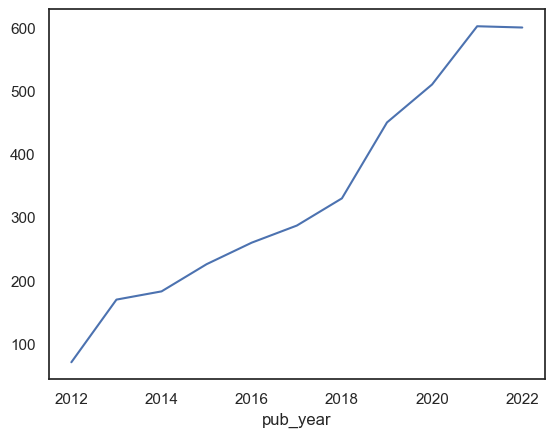

In [86]:
df_soc['pub_year'].value_counts().sort_index().plot()

<Axes: xlabel='pub_year'>

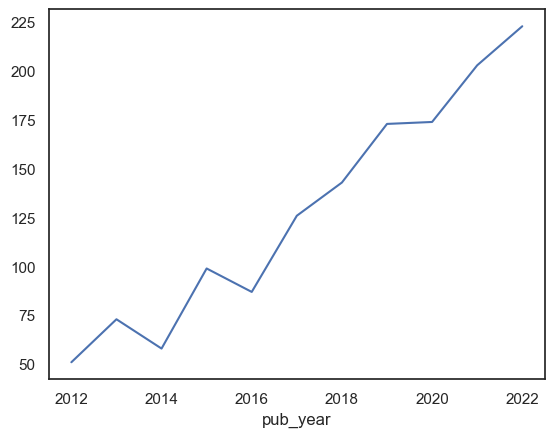

In [87]:
df_comp['pub_year'].value_counts().sort_index().plot()

In [88]:
df_total = pd.concat([df_comp, df_soc], axis=0)
df_total

,UID,r_id_disclaimer,static_data.summary.pub_info.coverdate,static_data.summary.pub_info.journal_oas_gold,static_data.summary.pub_info.pubyear,static_data.summary.pub_info.sortdate,static_data.summary.pub_info.has_abstract,pub_type,static_data.summary.pub_info.page.end,static_data.summary.pub_info.page.begin,...,static_data.fullrecord_metadata.normalized_languages.language,static_data.fullrecord_metadata.languages.language,static_data.summary.names.name.preferred_name.middle_name,static_data.fullrecord_metadata.addresses.address_name.names.name.preferred_name.middle_name,static_data.fullrecord_metadata.fund_ack.grants.grant.grant_source,pub_year,static_data.fullrecord_metadata.reprint_addresses.address_name.address_spec.zip,static_data.fullrecord_metadata.normalized_languages.language.status,static_data.summary.names.name.suffix,static_data.fullrecord_metadata.addresses.address_name.names.name.suffix
0,WOS:000712212600093,ResearcherID data provided by Clarivate Analytics,2017,N,2017,2017-01-01,Y,Book,760.0,759.0,...,NaN,NaN,NaN,NaN,NaN,2017.0,NaN,NaN,NaN,NaN
1,WOS:000800532002108,ResearcherID data provided by Clarivate Analytics,2021,N,2021,2021-01-01,Y,Book,2711.0,2706.0,...,NaN,NaN,NaN,NaN,NaN,2021.0,NaN,NaN,NaN,NaN
2,WOS:000467907000069,ResearcherID data provided by Clarivate Analytics,2019,N,2019,2019-01-01,Y,Journal,4752.0,4743.0,...,NaN,NaN,NaN,NaN,NaN,2019.0,NaN,NaN,NaN,NaN
3,WOS:000855183800094,ResearcherID data provided by Clarivate Analytics,2021,N,2021,2021-01-01,Y,Book,468.0,464.0,...,NaN,NaN,NaN,NaN,NaN,2021.0,NaN,NaN,NaN,NaN
4,WOS:000859869504062,ResearcherID data provided by Clarivate Analytics,2022,N,2022,2022-01-01,Y,Book,4726.0,4716.0,...,NaN,NaN,NaN,NaN,NaN,2022.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4194,WOS:000306783800001,ResearcherID data provided by Clarivate Analytics,JAN 2012,N,2012,2012-01-01,Y,Journal,16.0,1.0,...,NaN,NaN,NaN,NaN,NaN,2012.0,NaN,NaN,NaN,NaN
4195,WOS:000208936600004,ResearcherID data provided by Clarivate Analytics,SEP 2012,N,2012,2012-09-01,Y,Journal,548.0,545.0,...,NaN,NaN,NaN,NaN,NaN,2012.0,NaN,NaN,NaN,NaN
4196,WOS:000308031300004,ResearcherID data provided by Clarivate Analytics,SEP 2012,N,2012,2012-09-01,Y,Journal,2823.0,2807.0,...,NaN,NaN,NaN,NaN,NaN,2012.0,NaN,NaN,NaN,NaN
4198,WOS:000307908200010,ResearcherID data provided by Clarivate Analytics,SEP 2012,N,2012,2012-09-01,Y,Journal,981.0,947.0,...,NaN,NaN,NaN,NaN,NaN,2012.0,NaN,NaN,NaN,NaN


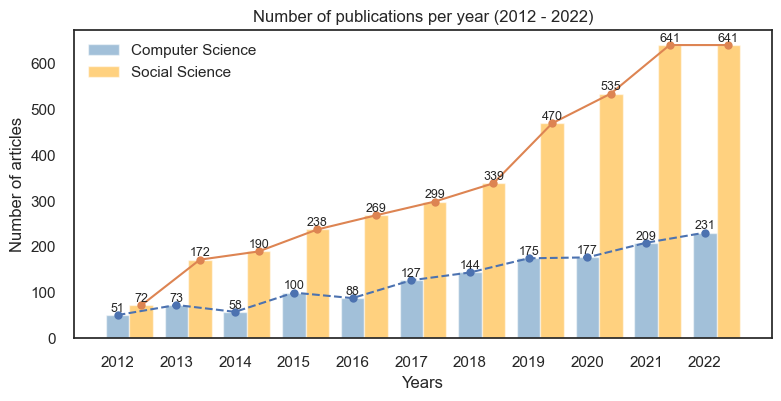

In [343]:
years_comp = df_comp['pub_year'].value_counts().reset_index().sort_values(by='pub_year')
years_soc = df_soc['pub_year'].value_counts().reset_index().sort_values(by='pub_year')

# Create a figure and a set of subplots
fig, ax = plt.subplots(figsize=(9, 4))

ax.bar(years_comp['pub_year'], years_comp['count'], color='steelblue', alpha=0.5, width = 0.4, label='Computer Science')
ax.plot(years_comp['pub_year'], years_comp['count'], marker='o', linestyle="--")
ax.bar(years_soc['pub_year']+0.4, years_soc['count'], color='orange', alpha=0.5, width = 0.4, label='Social Science')
ax.plot(years_soc['pub_year']+0.4, years_soc['count'], marker='o', linestyle="-")

# Add labels
ax.set_xlabel('Years') 
ax.set_ylabel('Number of articles')
ax.set_title('Number of publications per year (2012 - 2022)')

plt.xticks(years_comp['pub_year'])



rects = ax.patches

# Make some labels.
labels_comp = [f"{i}" for i in years_comp['count']]

for rect, label in zip(rects, labels_comp):
    height = rect.get_height()
    ax.text(
        rect.get_x() + rect.get_width() / 2, height + 0.5, label, ha="center", va="bottom", fontsize=9
    )

labels_soc = [f"{i}" for i in years_soc['count']]
counts_soc = [i for i in years_soc['count']]

for rect, label, height in zip(rects, labels_soc, counts_soc):
    #height = rect.get_height()
    ax.text(
        rect.get_x() + rect.get_width() / 2 + 0.4, height + 0.5, label, ha="center", va="bottom", fontsize=9
    )

# Add a legend
ax.legend()
# Show the plot
plt.show()

In [77]:
df_comp['pub_type'].value_counts()

pub_type
Book       775
Journal    635
Name: count, dtype: int64

In [78]:
df_arxiv['published_year']

0      2022
1      2019
2      2016
3      2021
4      2019
       ... 
226    2022
232    2022
233    2019
234    2018
235    2020
Name: published_year, Length: 179, dtype: int64

In [79]:
df_arxiv.columns

Index(['id', 'updated', 'published', 'title', 'summary', 'author', 'link',
       'primary_category', 'category', 'comment', 'doi', 'journal_ref',
       'published_year', 'updated_year'],
      dtype='object')

In [80]:
df_arxiv['pub_type'] = 'Pre-print'


In [342]:
df_comp_pub = df_comp[['title','pub_type', 'pub_year']]
df_soc_pub = df_soc[['title','pub_type', 'pub_year']]
df_arxiv_pub = df_arxiv[['title','pub_type', 'published_year']].rename(columns={'published_year': 'pub_year'})

df_comp_pub = pd.concat([df_comp_pub, df_arxiv_pub], axis=0)
df_comp_pub = df_comp_pub.drop_duplicates(subset='title', keep='first')
df_comp_pub = df_comp_pub[(df_comp_pub['pub_year'] < 2023) & (df_comp_pub['pub_year'] > 2011)]
df_comp_pub


KeyError: "['pub_type'] not in index"

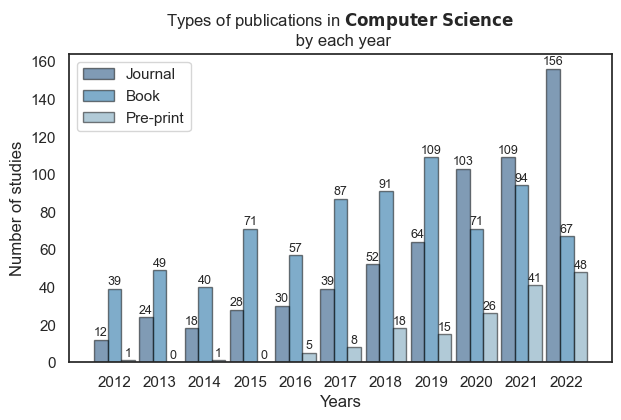

In [ ]:
years_comp_test = df_comp_pub[['pub_type', 'pub_year']].value_counts().reset_index()
dict_new = {'pub_type':['Pre-print', 'Pre-print'], 
        'pub_year':[2013, 2015], 
        'count':[0, 0] 
       } 
df2 = pd.DataFrame(dict_new) 
years_comp_test = pd.concat([years_comp_test, df2], ignore_index = True) 
years_comp_test = years_comp_test.sort_values(by='pub_year').reset_index(drop=True)

years_comp_test_journal = years_comp_test[years_comp_test['pub_type'] == 'Journal']
years_comp_test_book = years_comp_test[years_comp_test['pub_type'] == 'Book']
years_comp_test_preprint = years_comp_test[years_comp_test['pub_type'] == 'Pre-print']

# Create a figure and a set of subplots
fig, ax = plt.subplots(figsize=(7, 4))

ax.bar(years_comp_test_journal['pub_year'] - 0.3, years_comp_test_journal['count'], color='#03396c', alpha=0.5, width = 0.3, label='Journal', edgecolor='black')
ax.bar(years_comp_test_book['pub_year'], years_comp_test_book['count'], color='#005b96', alpha=0.5, width = 0.3, label='Book', edgecolor='black')
ax.bar(years_comp_test_preprint['pub_year'] + 0.3, years_comp_test_preprint['count'], color='#6497b1', alpha=0.5, width = 0.3, label='Pre-print', edgecolor='black')


# Add labels
ax.set_xlabel('Years') 
ax.set_ylabel('Number of studies')
ax.set_title('Types of publications in $\mathbf{Computer}$ $\mathbf{Science}$ \n by each year')

plt.xticks(years_comp['pub_year'])

rects = ax.patches

# Make some labels.
labels_comp_journal = [f"{i}" for i in years_comp_test_journal['count']]

for rect, label in zip(rects, labels_comp_journal):
    height = rect.get_height()
    ax.text(
        rect.get_x() + rect.get_width() / 2, height + 0.5, label, ha="center", va="bottom", fontsize=9
    )

labels_comp_book = [f"{i}" for i in years_comp_test_book['count']]
counts_comp_book = [i for i in years_comp_test_book['count']]

for rect, label, height in zip(rects, labels_comp_book, counts_comp_book):
    #height = rect.get_height()
    ax.text(
        rect.get_x() + rect.get_width() / 2 + 0.3, height + 0.5, label, ha="center", va="bottom", fontsize=9
    )

labels_comp_pp = [f"{i}" for i in years_comp_test_preprint['count']]
counts_comp_pp = [i for i in years_comp_test_preprint['count']]

for rect, label, height in zip(rects, labels_comp_pp, counts_comp_pp):
    #height = rect.get_height()
    ax.text(
        rect.get_x() + rect.get_width() / 2 + 0.6, height + 0.5, label, ha="center", va="bottom", fontsize=9
    )

# Add a legend
ax.legend()
# Show the plot
plt.show()

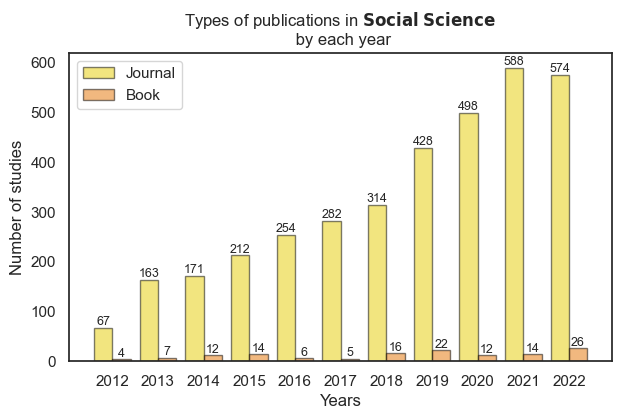

In [ ]:
years_soc_test = df_soc_pub[['pub_type', 'pub_year']].value_counts().reset_index()

years_soc_test = years_soc_test.sort_values(by='pub_year').reset_index(drop=True)

years_soc_test_journal = years_soc_test[years_soc_test['pub_type'] == 'Journal']
years_soc_test_book = years_soc_test[years_soc_test['pub_type'] == 'Book']
#years_soc_test_preprint = years_soc_test[years_soc_test['pub_type'] == 'Pre-print']

# Create a figure and a set of subplots
fig, ax = plt.subplots(figsize=(7, 4))

ax.bar(years_soc_test_journal['pub_year'] - 0.2, years_soc_test_journal['count'], color='#e6cc00', alpha=0.5, width = 0.4, label='Journal', edgecolor='black')
ax.bar(years_soc_test_book['pub_year'] + 0.2, years_soc_test_book['count'], color='#e47200', alpha=0.5, width = 0.4, label='Book', edgecolor='black')
#ax.bar(years_comp_test_preprint['pub_year'] + 0.3, years_comp_test_preprint['count'], color='#6497b1', alpha=0.5, width = 0.3, label='Pre-print', edgecolor='black')


# Add labels
ax.set_xlabel('Years') 
ax.set_ylabel('Number of studies')
ax.set_title('Types of publications in $\mathbf{Social}$ $\mathbf{Science}$ \n by each year')

plt.xticks(years_comp['pub_year'])

rects = ax.patches

# Make some labels.
labels_soc_journal = [f"{i}" for i in years_soc_test_journal['count']]

for rect, label in zip(rects, labels_soc_journal):
    height = rect.get_height()
    ax.text(
        rect.get_x() + rect.get_width() / 2, height + 0.4, label, ha="center", va="bottom", fontsize=9
    )

labels_soc_book = [f"{i}" for i in years_soc_test_book['count']]
counts_soc_book = [i for i in years_soc_test_book['count']]

for rect, label, height in zip(rects, labels_soc_book, counts_soc_book):
    #height = rect.get_height()
    ax.text(
        rect.get_x() + rect.get_width() / 2 + 0.4, height + 0.4, label, ha="center", va="bottom", fontsize=9
    )

"""labels_comp_pp = [f"{i}" for i in years_comp_test_preprint['count']]
counts_comp_pp = [i for i in years_comp_test_preprint['count']]

for rect, label, height in zip(rects, labels_comp_pp, counts_comp_pp):
    #height = rect.get_height()
    ax.text(
        rect.get_x() + rect.get_width() / 2 + 0.6, height + 0.5, label, ha="center", va="bottom", fontsize=9
    )
"""
# Add a legend
ax.legend()
# Show the plot
plt.show()

In [92]:
years_soc_test = df_soc_pub[['pub_type', 'pub_year']].value_counts().reset_index().sort_values(by='pub_year')
years_soc_test

,pub_type,pub_year,count
10,Journal,2012.0,67
21,Book,2012.0,4
9,Journal,2013.0,163
18,Book,2013.0,7
8,Journal,2014.0,171
17,Book,2014.0,12
7,Journal,2015.0,212
15,Book,2015.0,14
6,Journal,2016.0,254
19,Book,2016.0,6


<AxesSubplot:>

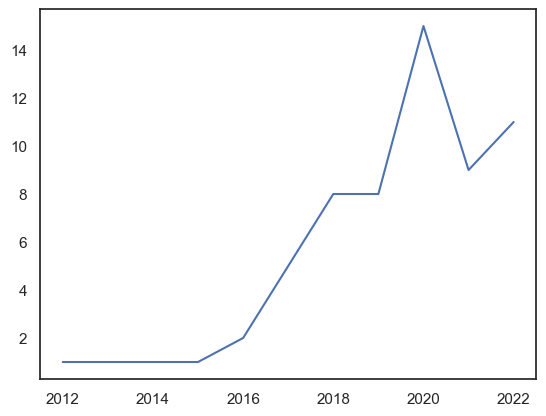

In [41]:
df_mul['pub_year'].value_counts().sort_index().plot()

In [345]:
df_soc = df_soc.rename(columns = {'static_data.fullrecord_metadata.abstracts.abstract.abstract_text.p': 'abstract'})
df_soc['abstract'] = df_soc['abstract'].astype(str)

df_comp = df_comp.rename(columns = {'static_data.fullrecord_metadata.abstracts.abstract.abstract_text.p': 'abstract'})
df_comp['abstract'] = df_comp['abstract'].astype(str)

df_mul = df_mul.rename(columns = {'static_data.fullrecord_metadata.abstracts.abstract.abstract_text.p': 'abstract'})
df_mul['abstract'] = df_mul['abstract'].astype(str)


In [346]:
df_arxiv = df_arxiv.rename(columns = {'summary': 'abstract'})
df_arxiv['abstract'] = df_arxiv['abstract'].astype(str)

In [347]:
df_cs = df_comp[['title','abstract']]
df_ss = df_soc[['title','abstract']]
df_arxiv_temp = df_arxiv[['title','abstract']]

df_cs = pd.concat([df_cs, df_arxiv_temp], axis=0)
df_cs = df_cs.drop_duplicates(subset='title', keep='first')
df_cs

,title,abstract
0,Deep Learning for Hate Speech Detection in Tweets,Hate speech detection on Twitter is critical f...
1,Automatic Misogyny Detection in Social Media P...,The important growth of social media and onlin...
2,Online Hate Speech against Women: Automatic Id...,"Patriarchal behavior, such as other social hab..."
3,"""Now there are a lot like you"": an artistic-ed...",The present work of Educational Research Based...
4,Counterfactually Augmented Data and Unintended...,Counterfactually Augmented Data (CAD) aims to ...
...,...,...
227,"Out of One, Many: Using Language Models to Sim...",We propose and explore the possibility that la...
234,"Sinophobia, misogyny, facism, and many more: A...",Anti-Asian hate/toxic/racial speech has recent...
235,Unwanted Advances in Higher Education: Uncover...,Sexual harassment in academia is often a hidde...
236,Hydra: A Peer to Peer Distributed Training & D...,The world needs diverse and unbiased data to t...


In [86]:
df_soc['static_data.fullrecord_metadata.abstracts.abstract.abstract_text.count'].value_counts()

static_data.fullrecord_metadata.abstracts.abstract.abstract_text.count
1.0     3435
4.0      108
2.0       70
5.0       31
3.0       22
6.0       11
7.0        3
8.0        3
10.0       2
9.0        2
12.0       1
17.0       1
Name: count, dtype: int64

In [88]:
df_comp['static_data.fullrecord_metadata.abstracts.abstract.abstract_text.count'].value_counts()

static_data.fullrecord_metadata.abstracts.abstract.abstract_text.count
1.0     1332
2.0       26
4.0       19
3.0       10
8.0        7
6.0        6
5.0        5
7.0        4
10.0       1
Name: count, dtype: int64

In [89]:
df_mul['static_data.fullrecord_metadata.abstracts.abstract.abstract_text.count'].value_counts()

static_data.fullrecord_metadata.abstracts.abstract.abstract_text.count
1.0    111
2.0      4
3.0      2
4.0      2
Name: count, dtype: int64

In [99]:
df_soc = df_soc[df_soc['static_data.fullrecord_metadata.abstracts.abstract.abstract_text.count'] == 1.0]
df_comp = df_comp[df_comp['static_data.fullrecord_metadata.abstracts.abstract.abstract_text.count'] == 1.0]
df_mul = df_mul[df_mul['static_data.fullrecord_metadata.abstracts.abstract.abstract_text.count'] == 1.0]
len(df_soc)

3435

In [100]:
'''
df_authors = pd.DataFrame.from_dict(df_comp['static_data.summary.names.name'].explode())
df_authors['index'] = df_authors.index
df_auth_temp = pd.json_normalize(df_authors['static_data.summary.names.name']).set_index(df_authors.index)
#df_auth_temp['temp_index'] = df_auth_temp.index

df_authors = pd.concat([df_authors, df_auth_temp], axis='columns')
df_authors = df_authors.drop(columns=['static_data.summary.names.name'])

df_authors['full_name'] = df_authors['full_name'].astype(str)
df_authors
'''

"\ndf_authors = pd.DataFrame.from_dict(df_comp['static_data.summary.names.name'].explode())\ndf_authors['index'] = df_authors.index\ndf_auth_temp = pd.json_normalize(df_authors['static_data.summary.names.name']).set_index(df_authors.index)\n#df_auth_temp['temp_index'] = df_auth_temp.index\n\ndf_authors = pd.concat([df_authors, df_auth_temp], axis='columns')\ndf_authors = df_authors.drop(columns=['static_data.summary.names.name'])\n\ndf_authors['full_name'] = df_authors['full_name'].astype(str)\ndf_authors\n"

In [101]:
'''
authors = df_authors.groupby(['index'])['full_name'].apply('; '.join).reset_index().rename(columns={'full_name':'authors'})
authors['authors'] = authors['authors'].replace('nan', np.nan, regex=True)
authors
'''

"\nauthors = df_authors.groupby(['index'])['full_name'].apply('; '.join).reset_index().rename(columns={'full_name':'authors'})\nauthors['authors'] = authors['authors'].replace('nan', np.nan, regex=True)\nauthors\n"

In [49]:
#authors['authors'].iloc[4]

In [50]:
#authors['authors'].isna().sum()

In [51]:
#data = pd.merge(data, authors, on='index', how='left')
#data

In [354]:
social_media_lst = ["twitter", "facebook", "reddit", "instagram", "whatsapp",
                    "gab", "2chan", "4chan", "8chan", "youtube", "linkedin", "tumblr", "meta"]

pattern = '|'.join(r"\b{}\b".format(x) for x in social_media_lst)
df_comp['Title & Abstract'] = df_comp['title'] + ' ' + df_comp['abstract']
df_comp["Platform of interest"] = df_comp['Title & Abstract'].str.findall(pattern, flags=re.I).str.join(' ')
df_comp["Platform of interest"].unique()

array(['Twitter', '', 'Twitter Twitter', 'Reddit',
       'Facebook Twitter Instagram Reddit', 'Reddit Reddit',
       'Twitter Twitter Twitter Twitter', 'Instagram',
       'YouTube YouTube YouTube YouTube', 'Meta', 'Facebook Facebook',
       'twitter', 'meta', 'Twitter Twitter meta',
       'Twitter Facebook Instagram', 'META', 'Twitter Twitter Twitter',
       'Facebook', 'Meta meta',
       'twitter facebook instagram twitter twitter', 'Reddit Twitter',
       'Twitter twitter', 'Facebook Twitter',
       'Twitter Twitter Twitter Twitter Twitter', 'meta meta meta',
       'twitter Twitter Twitter Twitter Twitter', 'meta meta',
       'Twitter Facebook twitter Facebook', 'Instagram Instagram',
       'Instagram Twitter YouTube YouTube YouTube YouTube',
       'Facebook Facebook Facebook Facebook',
       'Facebook Facebook Facebook',
       'Facebook Facebook Facebook Facebook Facebook Facebook Facebook',
       'Twitter Twitter twitter',
       'Facebook Twitter Facebook Twitter F

In [96]:
# Function to keep only the first occurrence of a sub-string
def remove_dup(string):
    # split input string separated by space
    input = string.split(" ")
 
    # now create dictionary using counter method
    # which will have strings as key and their
    # frequencies as value
    UniqW = Counter(input)
 
    # joins two adjacent elements in iterable way
    s = " ".join(UniqW.keys())
    return s

# Replacing facebook with meta of any casing
#df_comp["Platform of interest"] = df_comp["Platform of interest"].apply(lambda x: re.sub("facebook", "meta", x, flags=re.I))

df_comp["Platform of interest"] = df_comp["Platform of interest"].apply(remove_dup)

df_comp["Platform of interest"].unique()


array(['Twitter', '', 'Reddit', 'Instagram', 'YouTube', 'Facebook',
       'twitter', 'meta', 'Twitter meta', 'Twitter Facebook Instagram',
       'META', 'Meta meta', 'twitter facebook instagram',
       'Reddit Twitter', 'Facebook Twitter', 'twitter Twitter',
       'Twitter Facebook twitter', 'Instagram Twitter YouTube',
       'Twitter twitter', 'Twitter Meta meta', 'LinkedIn'], dtype=object)

In [97]:
# taking in only the platforms which showed in the string extraction
twitter_count = df_comp["Platform of interest"].str.lower().str.contains('twitter').sum()
#fb_count = df_comp["Platform of interest"].str.lower().str.contains('facebook').sum()
#fourchan_count = df_comp["Platform of interest"].str.lower().str.contains('4chan').sum()
#eightchan_count = df_comp["Platform of interest"].str.lower().str.contains('8chan').sum()
youtube_count = df_comp["Platform of interest"].str.lower().str.contains('youtube').sum()
meta_count = df_comp["Platform of interest"].str.lower().str.contains('facebook|meta').sum() # containing facebook or meta
#fb_count = df_comp["Platform of interest"].str.lower().str.contains('facebook').sum()
instagram_count = df_comp["Platform of interest"].str.lower().str.contains('instagram').sum()
reddit_count = df_comp["Platform of interest"].str.lower().str.contains('reddit').sum()
linkedin_count = df_comp["Platform of interest"].str.lower().str.contains('linkedin').sum()


df_social_media_counts = pd.DataFrame({'Social Media Platforms': ['Twitter', #'Facebook', #'4chan', '8chan',
                                                                 'YouTube', 'Meta', 'Instagram', 'Reddit', 'LinkedIn'], 
                                       'Counts in Computer Science': [twitter_count, #fb_count, #fourchan_count, eightchan_count,
                                                 youtube_count, meta_count, instagram_count, reddit_count, linkedin_count]}) #

fig = px.bar(df_social_media_counts, x='Counts in Computer Science', y='Social Media Platforms', text='Counts in Computer Science', color='Social Media Platforms')
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.update_traces(textposition='outside')
fig.update_layout(showlegend=False)

fig.show()

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

In [340]:
social_media_lst = ["twitter", "facebook", "reddit", "instagram", "whatsapp",
                    "gab", "2chan", "4chan", "8chan", "youtube", "linkedin", "tumblr", "meta"]

pattern = '|'.join(r"\b{}\b".format(x) for x in social_media_lst)
df_soc['Title & Abstract'] = df_soc['title'] + ' ' + df_soc['abstract']
df_soc["Platform of interest"] = df_soc['Title & Abstract'].str.findall(pattern, flags=re.I).str.join(' ')
#df_soc["Platform of interest"] = df_soc["Platform of interest"].apply(lambda x: re.sub("facebook", "meta", x, flags=re.I))
df_soc["Platform of interest"] = df_soc["Platform of interest"].apply(remove_dup)
# not use meta, as own fb and insta
df_soc["Platform of interest"].unique()

array(['', 'Instagram', 'Facebook', 'Twitter Gab', 'meta', 'Reddit',
       'Meta meta', 'Facebook Instagram', 'YouTube Facebook Twitter',
       'YouTube Instagram', 'Twitter', 'Meta', 'Youtube YouTube',
       'YouTube', 'Twitter WhatsApp', 'LinkedIn', 'Facebook twitter',
       'Youtube Reddit 4chan', 'Twitter twitter', 'Facebook Twitter'],
      dtype=object)

In [341]:
# taking in only the platforms which showed in the string extraction
twitter_count = df_soc["Platform of interest"].str.lower().str.contains('twitter').sum()
fourchan_count = df_soc["Platform of interest"].str.lower().str.contains('4chan').sum()
#eightchan_count = df_comp["Platform of interest"].str.lower().str.contains('8chan').sum()
youtube_count = df_soc["Platform of interest"].str.lower().str.contains('youtube').sum()
fb_count = df_soc["Platform of interest"].str.lower().str.contains('facebook').sum()
meta_count = df_soc["Platform of interest"].str.lower().str.contains('meta').sum()
instagram_count = df_soc["Platform of interest"].str.lower().str.contains('instagram').sum()
reddit_count = df_soc["Platform of interest"].str.lower().str.contains('reddit').sum()
#linkedin_count = df_soc["Platform of interest"].str.lower().str.contains('linkedin').sum()


df_social_media_counts = pd.DataFrame({'Social Media Platforms': ['Twitter/X', '4chan', 'Facebook',
                                                                 'YouTube', 'Meta', 'Instagram', 'Reddit'], 
                                       'Counts in Social Science': [twitter_count, fourchan_count, fb_count,
                                                 youtube_count, meta_count, instagram_count, reddit_count]})

fig = px.bar(df_social_media_counts, x='Counts in Social Science', y='Social Media Platforms', text='Counts in Social Science', color='Social Media Platforms')
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.update_traces(textposition='outside')
fig.update_layout(showlegend=False)

fig.show()

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

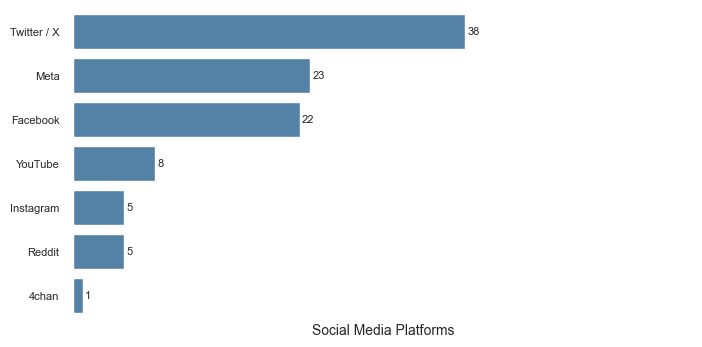

In [100]:
df_social_media_counts = pd.DataFrame({'Social Media Platforms': ['Twitter / X', '4chan', 'Facebook',
                                                                 'YouTube', 'Meta', 'Instagram', 'Reddit'], 
                                       'Counts': [twitter_count, fourchan_count, fb_count,
                                                 youtube_count, meta_count, instagram_count, reddit_count]})
df_social_media_counts = df_social_media_counts.sort_values(by='Counts', ascending=False)

f, ax = plt.subplots(figsize=(8, 4))

p = sns.barplot(data=df_social_media_counts, x='Counts', y='Social Media Platforms', color='steelblue')
ax.set(xlim=(0, 60))
# new helper method to auto-label bars
ax.bar_label(ax.containers[0], fontsize=8, padding=1.5)
sns.despine(left=True, bottom=True)
p.set_xlabel("Social Media Platforms", fontsize=10)
p.set_ylabel("",fontsize=10)
# disabling yticks by setting yticks to an empty list
plt.xticks([]) 
p.tick_params(labelsize=8)

In [58]:
df_mul['Title & Abstract'] = df_mul['title'] + ' ' + df_mul['abstract']
df_mul["Platform of interest"] = df_mul['Title & Abstract'].str.findall(pattern, flags=re.I).str.join(' ')
#df_mul["Platform of interest"] = df_mul["Platform of interest"].apply(lambda x: re.sub("facebook", "meta", x, flags=re.I))
df_mul["Platform of interest"] = df_mul["Platform of interest"].apply(remove_dup)

df_mul["Platform of interest"].unique()

array(['', 'Twitter', 'Facebook', 'Reddit', 'Instagram',
       'Facebook Twitter'], dtype=object)

In [59]:
# taking in only the platforms which showed in the string extraction
twitter_count = df_mul["Platform of interest"].str.lower().str.contains('twitter').sum()
#meta_count = df_mul["Platform of interest"].str.lower().str.contains('meta').sum()
fb_count = df_mul["Platform of interest"].str.lower().str.contains('facebook').sum()
reddit_count = df_mul["Platform of interest"].str.lower().str.contains('reddit').sum()

df_social_media_counts = pd.DataFrame({'Social Media Platforms': ['Twitter',  'Reddit', 'Facebook'], #'Meta',
                                       'Counts in Multidisciplinary': [twitter_count, reddit_count, fb_count]}) #meta_count, 

fig = px.bar(df_social_media_counts, x='Counts in Multidisciplinary', y='Social Media Platforms', text='Counts in Multidisciplinary', color='Social Media Platforms')
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.update_traces(textposition='outside')
fig.update_layout(showlegend=False)

fig.show()

In [60]:
len(df_comp[df_comp["Platform of interest"] == '']), len(df_soc[df_soc["Platform of interest"] == '']), len(df_mul[df_mul["Platform of interest"] == ''])

(912, 3061, 46)

In [61]:
df_comp["Platform of interest"][df_comp["Platform of interest"] != ''].str.lower().value_counts()

twitter                       52
facebook                      10
meta                           7
instagram                      4
youtube                        3
twitter meta                   2
twitter facebook instagram     2
twitter reddit                 2
facebook twitter               1
instagram twitter youtube      1
linkedin                       1
Name: Platform of interest, dtype: int64

In [62]:
df_soc["Platform of interest"][df_soc["Platform of interest"] != ''].str.lower().value_counts()

meta                             56
twitter                          38
facebook                         20
youtube                           8
reddit                            5
instagram                         3
twitter gab                       2
youtube instagram                 2
facebook twitter                  2
facebook instagram                1
meta facebook twitter youtube     1
twitter whatsapp                  1
youtube reddit 4chan              1
Name: Platform of interest, dtype: int64

In [63]:
df_mul["Platform of interest"][df_mul["Platform of interest"] != ''].str.lower().value_counts()

twitter             6
facebook            2
reddit              1
instagram           1
facebook twitter    1
Name: Platform of interest, dtype: int64

## Co-authorship network

In [64]:
def auth_comb(string):
    words= string.split(", ")
    pairs = list(skipgrams(words, n=2, k=len(words)-1))
    return pairs

In [65]:
df_comp['index'] = df_comp.reset_index().index
df_comp['index']

1         0
4         1
5         2
6         3
9         4
       ... 
1348    992
1351    993
1352    994
1356    995
1361    996
Name: index, Length: 997, dtype: int64

In [66]:
authors_1 = pd.DataFrame(pd.json_normalize(pd.json_normalize(df_comp['static_data.summary.names.name'])[0])).fillna('')
authors_1['index'] = authors_1.index
authors_2 = pd.DataFrame(pd.json_normalize(pd.json_normalize(df_comp['static_data.summary.names.name'])[1])).fillna('')
authors_2['index'] = authors_2.index
authors_3 = pd.DataFrame(pd.json_normalize(pd.json_normalize(df_comp['static_data.summary.names.name'])[2])).fillna('')
authors_3['index'] = authors_3.index
authors_4 = pd.DataFrame(pd.json_normalize(pd.json_normalize(df_comp['static_data.summary.names.name'])[3])).fillna('')
authors_4['index'] = authors_4.index
#type(authors_4['preferred_name.full_name'].iloc[0]) # str
authors_4

,seq_no,role,claim_status,last_name,display_name,daisng_id,full_name,addr_no,wos_standard,r_id,...,preferred_name.last_name,preferred_name.first_name,orcid_id,noncore_endyear,noncore_startyear,preferred_name.middle_name,data-item-ids.data-item-id,reprint,suffix,index
0,4.0,author,False,Martin,"Martin, Lukas",46925717.0,"Martin, Lukas",2,"Martin, L",IVL-6145-2023,...,Martin,Lukas,,,,,,,,0
1,,,,,,,,,,,...,,,,,,,,,,1
2,4.0,author,False,Jezek,"Jezek, Elisabetta",15763940.0,"Jezek, Elisabetta",2,"Jezek, E",DXH-3537-2022,...,Jezek,Elisabetta,0000-0003-2518-5200,,,,,,,2
3,4.0,author,True,Perez,"Perez, Noel",2049184.0,"Perez, Noel",1,"Perez, N",AAV-5033-2020,...,Pérez,Noel,0000-0003-3166-745X,,,,,,,3
4,4.0,author,False,Ullrich,"Ullrich, Stefan",16936964.0,"Ullrich, Stefan",1,"Ullrich, S",ECC-6561-2022,...,Ullrich,Stefan,,,,,,,,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
992,,,,,,,,,,,...,,,,,,,,,,992
993,4.0,author,False,Yang,"Yang, Songfan",31257506.0,"Yang, Songfan",1,"Yang, SF",GJP-7121-2022,...,Yang,Songfan,,,,,,,,993
994,,,,,,,,,,,...,,,,,,,,,,994
995,4.0,book_editor,,Bimbot,"Bimbot, F",,"Bimbot, F",,"Bimbot, F",,...,,,,,,,,,,995


In [67]:
authors_4['preferred_name.full_name'].iloc[0]

'Martin, Lukas'

In [68]:
authors_1['preferred_name.full_name'].iloc[-1]

'Ardakany, A. R.'

In [69]:
'''
lst_a1 = authors_1['preferred_name.full_name'].to_list()
lst_a2 = authors_2['preferred_name.full_name'].to_list()
lst_a3 = authors_3['preferred_name.full_name'].to_list()
lst_a4 = authors_4['preferred_name.full_name'].to_list()
list_auth = [lst_a1, lst_a2,lst_a3, lst_a4]

#auth_series = pd.DataFrame(list_auth).sum(axis=0)
auth_series = list(map('; '.join, zip(*list_auth)))
auth_series
'''

"\nlst_a1 = authors_1['preferred_name.full_name'].to_list()\nlst_a2 = authors_2['preferred_name.full_name'].to_list()\nlst_a3 = authors_3['preferred_name.full_name'].to_list()\nlst_a4 = authors_4['preferred_name.full_name'].to_list()\nlist_auth = [lst_a1, lst_a2,lst_a3, lst_a4]\n\n#auth_series = pd.DataFrame(list_auth).sum(axis=0)\nauth_series = list(map('; '.join, zip(*list_auth)))\nauth_series\n"

In [ ]:
df_comp = pd.merge(df_comp, authors_1[['index', 'preferred_name.full_name']], on="index", how="left")
df_comp = df_comp.rename(columns={"preferred_name.full_name": "author_1"})
df_comp = pd.merge(df_comp, authors_2[['index', 'preferred_name.full_name']], on="index", how="left")
df_comp = df_comp.rename(columns={"preferred_name.full_name": "author_2"})
df_comp = pd.merge(df_comp, authors_3[['index', 'preferred_name.full_name']], on="index", how="left")
df_comp = df_comp.rename(columns={"preferred_name.full_name": "author_3"})
df_comp = pd.merge(df_comp, authors_4[['index', 'preferred_name.full_name']], on="index", how="left")
df_comp = df_comp.rename(columns={"preferred_name.full_name": "author_4"})
df_comp

In [ ]:
df_comp['authors'] = df_comp[['author_1', 'author_2', 'author_3', 'author_4']].fillna('').agg('; '.join, axis=1)
df_comp['authors']

In [72]:
# Remove trailing commas and space
def prepros_auth(text):
    text = str(text)
    text = text.rstrip('; ') # remove spaces and trailing semi-colons
    text = '; '.join(set(text.split('; '))) # remove duplicates from the text
    text = text.split('; ')
    result = []
    for each in text:
        each = each.split(', ')
        first = ''.join(each[1:])
        last = each[0]
        res = first + ' ' + last
        result.append(res)
    result = ', '.join([str(element) for element in result])
    return result

#df_comp['authors'] = pd.DataFrame(auth_series)
df_comp['authors'] = df_comp['authors'].apply(prepros_auth)
df_comp['authors']

0      Suchanda Bhattacharyya, Janine Meyer-Christodo...
1                               Zhuya Huang, Junsheng Yu
2      Alan Ramponi, Elisabetta Jezek, Sara Tonelli, ...
3      Daniel Jimenez, Noel Pérez, Leonel Miranda, Di...
4      Jessica Percy Campbell, Stefan Ullrich, Jacob ...
                             ...                        
992           Kyu J. Han, Ming Li, Shrikanth S Narayanan
993          Xiaojing Chen, Le An, Songfan Yang, M Kafai
994                 Anmol Aggarwal, Jasdeep Singh Bhalla
995     Zheng-Hua Tan, Sven E. Shepstone, Søren H Jensen
996    A. R. Ardakany, Mircea Nicolescu, Monica Nicol...
Name: authors, Length: 997, dtype: object

In [73]:
text = 'Huang, Zhuya test; Yu, Junsheng;  ;'

def ath_test(text):
    text = str(text)
    text = text.rstrip('; ') # remove spaces and trailing semi-colons
    text = '; '.join(set(text.split('; '))) # remove duplicates from the text
    text = text.split('; ')
    result = []
    for each in text:
        each = each.split(', ')
        first = ''.join(each[1:])
        last = each[0]
        result.append(first + ' ' + last)
    return result

ath_test(text)

['Zhuya test Huang', 'Junsheng Yu']

In [74]:
authors_3['preferred_name.full_name'].iloc[0] + '; ' + authors_4['preferred_name.full_name'].iloc[0]

'Meyer-Christodoulou, Janine; Martin, Lukas'

In [75]:
df_comp['authors'].iloc[1]

'Zhuya Huang, Junsheng Yu'

In [76]:
df_comp['authors'].iloc[-1]

'A. R. Ardakany, Mircea Nicolescu, Monica Nicolescu'

In [77]:
df_comp['paired_authors'] = df_comp['authors'].apply(auth_comb)
df_comp['paired_authors']

0      [(Suchanda Bhattacharyya, Janine Meyer-Christo...
1                           [(Zhuya Huang, Junsheng Yu)]
2      [(Alan Ramponi, Elisabetta Jezek), (Alan Rampo...
3      [(Daniel Jimenez, Noel Pérez), (Daniel Jimenez...
4      [(Jessica Percy Campbell, Stefan Ullrich), (Je...
                             ...                        
992    [(Kyu J. Han, Ming Li), (Kyu J. Han, Shrikanth...
993    [(Xiaojing Chen, Le An), (Xiaojing Chen, Songf...
994             [(Anmol Aggarwal, Jasdeep Singh Bhalla)]
995    [(Zheng-Hua Tan, Sven E. Shepstone), (Zheng-Hu...
996    [(A. R. Ardakany, Mircea Nicolescu), (A. R. Ar...
Name: paired_authors, Length: 997, dtype: object

In [78]:
data_paired_auth = df_comp[df_comp['paired_authors'].map(lambda d: len(d)) > 0]

In [79]:
auth_term_bigram= data_paired_auth['paired_authors']
#auth_bigrams = list(itertools.chain(*auth_term_bigram))
auth_bigrams = list(chain.from_iterable(auth_term_bigram))

# Create counter of words in clean bigrams
auth_bigram_counts = collections.Counter(auth_bigrams)

auth_bigram_counts= auth_bigram_counts.most_common(100)
auth_bigram_counts

[(('Noor Kamal Al-Qazzaz', 'Mohannad K. Sabir'), 4),
 (('Siti Anom Ahmad', 'Noor Kamal Al-Qazzaz'), 3),
 (('Siti Anom Ahmad', 'Sawal Hamid Md Ali'), 3),
 (('Siti Anom Ahmad', 'Mohannad K. Sabir'), 3),
 (('Noor Kamal Al-Qazzaz', 'Sawal Hamid Md Ali'), 3),
 (('Sawal Hamid Md Ali', 'Mohannad K. Sabir'), 3),
 (('Behzad Rouhanizadeh', 'Sharareh Kermanshachi'), 3),
 (('HAZIM KEMAL EKENEL', 'Fevziye I. Eyiokur'), 3),
 (('HAZIM KEMAL EKENEL', 'Dogucan Yaman'), 3),
 (('Fevziye I. Eyiokur', 'Dogucan Yaman'), 3),
 (('Fangzhao Wu', 'Chuhan Wu'), 3),
 (('Claudio A Perez', 'Juan E. Tapia'), 3),
 (('alex noel', 'Vijayalakshmi G V Mahesh'), 3),
 (('Samiul Azam', 'Marina Gavrilova'), 3),
 (('Nesrine BOUADJENEK', 'Hassiba Nemmour'), 3),
 (('Nesrine BOUADJENEK', 'Youcef Chibani'), 3),
 (('Hassiba Nemmour', 'Youcef Chibani'), 3),
 (('Mohammed Daoudi', 'Boulbaba Ben Amor'), 3),
 (('Mohammed Daoudi', 'Baiqiang Xia'), 3),
 (('Boulbaba Ben Amor', 'Baiqiang Xia'), 3),
 (('Vladimir Khryashchev', 'Andrei L Prior

In [80]:
#data_paired_auth = pd.DataFrame.from_dict(auth_bigram_counts, orient='index').reset_index()
data_paired_auth = pd.DataFrame(auth_bigram_counts,
                             columns=['auth_bigram', 'count'])

#data_paired_auth = data_paired_auth.rename(columns={'index':'auth_bigram', 0:'count'})
data_paired_auth

,auth_bigram,count
0,"(Noor Kamal Al-Qazzaz, Mohannad K. Sabir)",4
1,"(Siti Anom Ahmad, Noor Kamal Al-Qazzaz)",3
2,"(Siti Anom Ahmad, Sawal Hamid Md Ali)",3
3,"(Siti Anom Ahmad, Mohannad K. Sabir)",3
4,"(Noor Kamal Al-Qazzaz, Sawal Hamid Md Ali)",3
...,...,...
95,"(Sangheeta Roy, Shivakumara Palaiahnakote)",2
96,"(B. J. Navya, Shivakumara Palaiahnakote)",2
97,"(Piotr Bilinski, Francois Bremond)",2
98,"(Piotr Bilinski, Antitza Dantcheva)",2


In [81]:
# Create dictionary of bigrams and their counts
d = data_paired_auth.set_index('auth_bigram').T.to_dict('records')

# Create network plot 
G = nx.Graph()

# Create connections between nodes
for k, v in d[0].items():
    G.add_edge(k[0], k[1], weight=(v * 10))
    # creating node size depending on node degree
    degree = dict(G.degree)

In [82]:
color_lookup = {k:v for v, k in enumerate(sorted(set(G.nodes())))}

low, *_, high = sorted(color_lookup.values())
norm = mpl.colors.Normalize(vmin=low, vmax=high, clip=True)
mapper = mpl.cm.ScalarMappable(norm=norm, cmap=mpl.cm.coolwarm)

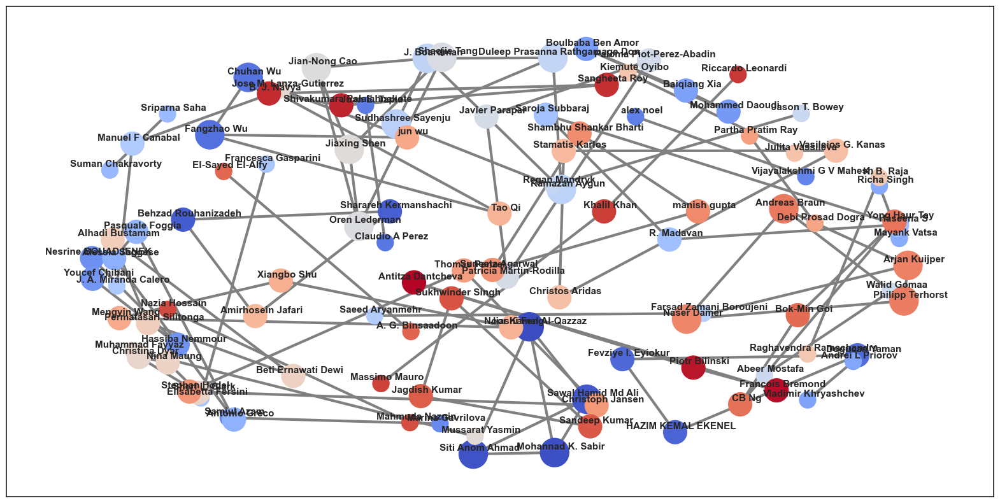

In [83]:
fig, ax = plt.subplots(figsize=(20, 10))

pos = nx.spring_layout(G, k=2)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=8,
                 width=3,
                 edge_color='grey',
                 node_color= [mapper.to_rgba(i) 
                    for i in color_lookup.values()],           #'purple',
                 nodelist=degree.keys(), node_size=[v * 350 for v in degree.values()],
                 with_labels = False,
                 ax=ax)

# Create offset labels
for key, value in pos.items():
    x, y = value[0]+.015, value[1]+.015
    ax.text(x, y,
            s=key,
            #bbox=dict(facecolor='red', alpha=0.25),
            horizontalalignment='center', fontsize=11, weight='bold')

sns.set_style("white")
plt.show()

## Type of document

In [84]:
df_comp['static_data.summary.pub_info.pubtype'].value_counts()

Book       533
Journal    464
Name: static_data.summary.pub_info.pubtype, dtype: int64

In [85]:
df_comp['static_data.summary.doctypes.doctype'].value_counts()

Proceedings Paper    536
Article              461
Name: static_data.summary.doctypes.doctype, dtype: int64

In [86]:
df_comp[['static_data.summary.pub_info.pubtype', 'static_data.summary.doctypes.doctype', 'static_data.item.bib_pagecount.type']].value_counts()

static_data.summary.pub_info.pubtype  static_data.summary.doctypes.doctype  static_data.item.bib_pagecount.type
Book                                  Proceedings Paper                     Book                                   529
Journal                               Article                               Journal                                461
Book                                  Proceedings Paper                     Journal                                  4
Journal                               Proceedings Paper                     Journal                                  3
dtype: int64

In [87]:
df_comp['type'] = df_comp['static_data.summary.pub_info.pubtype'] + ', ' + df_comp['static_data.summary.doctypes.doctype'] +', ' + df_comp['static_data.item.bib_pagecount.type']

# remove duplicates from the list
df_comp['type'] = df_comp['type'].apply(lambda x: ', '.join(set(x.split(", "))))

df_comp['type'].unique()

array(['Journal, Book, Proceedings Paper', 'Article, Journal',
       'Book, Proceedings Paper', 'Journal, Proceedings Paper'],
      dtype=object)

In [88]:
types_df = df_comp[['index', 'pub_year', 'type']]

types_df['journal'] = np.where(types_df["type"].str.contains('Journal'), 1, np.nan)
types_df['article'] = np.where(types_df["type"].str.contains('Article'), 1, np.nan)
types_df['conference'] = np.where(types_df["type"].str.contains('Proceedings Paper'), 1, np.nan)
types_df['book'] = np.where(types_df["type"].str.contains('Book'), 1, np.nan)

types_df

,index,pub_year,type,journal,article,conference,book
0,0,2022.0,"Journal, Book, Proceedings Paper",1.0,NaN,1.0,1.0
1,1,2022.0,"Journal, Book, Proceedings Paper",1.0,NaN,1.0,1.0
2,2,2022.0,"Article, Journal",1.0,1.0,NaN,NaN
3,3,2022.0,"Journal, Book, Proceedings Paper",1.0,NaN,1.0,1.0
4,4,2022.0,"Article, Journal",1.0,1.0,NaN,NaN
...,...,...,...,...,...,...,...
992,992,2013.0,"Article, Journal",1.0,1.0,NaN,NaN
993,993,2013.0,"Book, Proceedings Paper",NaN,NaN,1.0,1.0
994,994,2013.0,"Book, Proceedings Paper",NaN,NaN,1.0,1.0
995,995,2013.0,"Book, Proceedings Paper",NaN,NaN,1.0,1.0


In [89]:
len(types_df[types_df['journal'] == 1])

468

In [90]:
n_journals = pd.DataFrame(types_df.groupby('journal')['pub_year'].value_counts().to_frame('count').sort_values(by='pub_year').reset_index())
n_articles = pd.DataFrame(types_df.groupby('article')['pub_year'].value_counts().to_frame('count').sort_values(by='pub_year').reset_index())
n_conferences = pd.DataFrame(types_df.groupby('conference')['pub_year'].value_counts().to_frame('count').sort_values(by='pub_year').reset_index())
n_books = pd.DataFrame(types_df.groupby('book')['pub_year'].value_counts().to_frame('count').sort_values(by='pub_year').reset_index())
n_conferences

,conference,pub_year,count
0,1.0,2012.0,15
1,1.0,2013.0,29
2,1.0,2014.0,31
3,1.0,2015.0,59
4,1.0,2016.0,30
5,1.0,2017.0,57
6,1.0,2018.0,62
7,1.0,2019.0,76
8,1.0,2020.0,62
9,1.0,2021.0,70


In [91]:
# two of them has years starting from 2013. So add a new column there

# Articles
new_row = {'article': 1.0, 'pub_year': 2012.0, 'count': 0}
n_articles.loc[len(n_articles)] = new_row
n_articles = n_articles.sort_values(by='pub_year').reset_index(drop=True)

# Journals
new_row = {'journal': 1.0, 'pub_year': 2012.0, 'count': 0}
n_journals.loc[len(n_journals)] = new_row
n_journals = n_journals.sort_values(by='pub_year').reset_index(drop=True)
n_journals

,journal,pub_year,count
0,1.0,2012.0,0
1,1.0,2013.0,18
2,1.0,2014.0,13
3,1.0,2015.0,21
4,1.0,2016.0,21
5,1.0,2017.0,21
6,1.0,2018.0,34
7,1.0,2019.0,45
8,1.0,2020.0,74
9,1.0,2021.0,89


In [92]:
n_journals['pub_year'].to_list()

[2012.0,
 2013.0,
 2014.0,
 2015.0,
 2016.0,
 2017.0,
 2018.0,
 2019.0,
 2020.0,
 2021.0,
 2022.0]

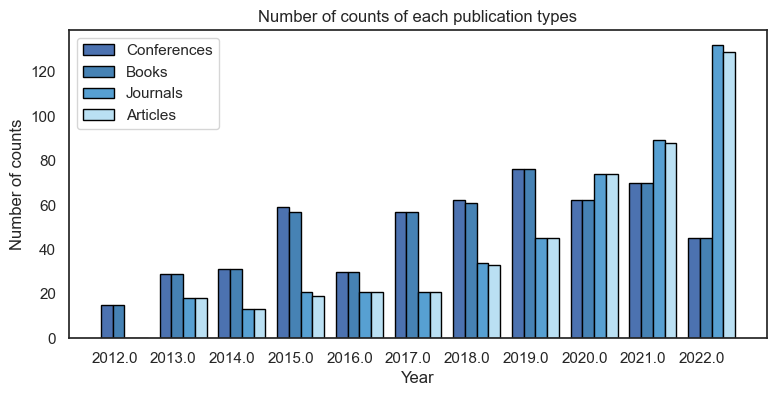

In [93]:
n=11
r = np.arange(n) 
width = 0.20

plt.figure(figsize=(9,4))
plt.bar(r, n_conferences['count'].to_list(), color = 'b', 
        width = width, edgecolor = 'black', 
        label='Conferences') 
plt.bar(r + width, n_books['count'].to_list(), color = '#4682B4', 
        width = width, edgecolor = 'black', 
        label='Books')
plt.bar(r + 2*width, n_journals['count'].to_list(), color = '#57A0D2', 
        width = width, edgecolor = 'black', 
        label='Journals')
plt.bar(r + 3*width, n_articles['count'].to_list(), color = '#bae0f3', 
        width = width, edgecolor = 'black', 
        label='Articles')

plt.xlabel("Year") 
plt.ylabel("Number of counts") 
plt.title("Number of counts of each publication types") 
  
#plt.grid(linestyle='--') 
plt.xticks(r + width/1.5, n_conferences['pub_year'].to_list()) 
plt.legend() 

# Set the style
sns.set_style("white")
  
plt.show() 

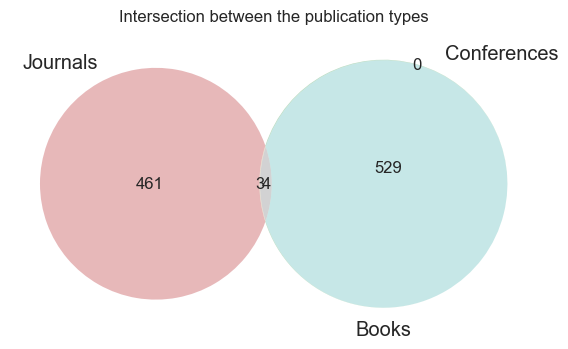

In [94]:
# Choose those indices contained for each publication type
d1 = types_df[types_df['journal'] == 1].index.tolist()
d2 = types_df[types_df['conference'] == 1].index.tolist() 
d3 = types_df[types_df['book'] == 1].index.tolist() 


# Visualize the intersection through venn diagram
plt.style.use('seaborn')
 
plt.figure(figsize=(8,4))
plt.title("Intersection between the publication types")

venn3([set(d1), 
       set(d2),
       set(d3)],
       set_labels=('Journals', 'Conferences', 'Books')
     )

plt.show()

<AxesSubplot:>

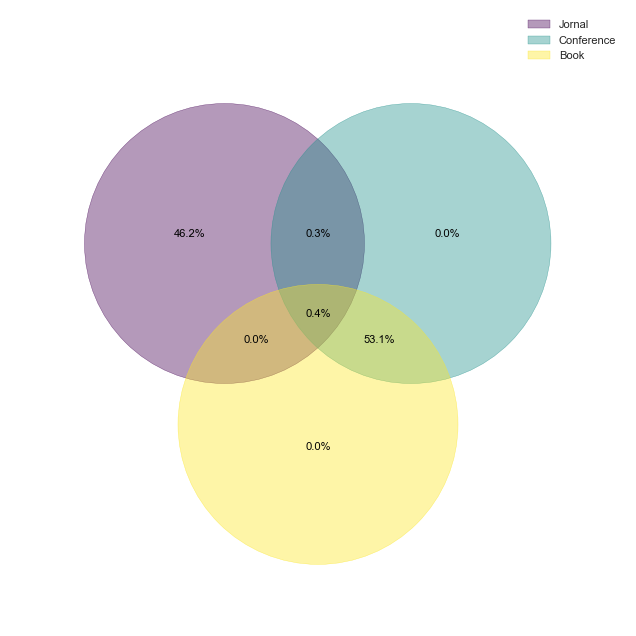

In [95]:
dataset_dict = {
        'Jornal': set(d1),
    'Conference': set(d2),
    'Book': set(d3),
    }
venn(dataset_dict, fmt="{percentage:.1f}%", fontsize=8, legend_loc="upper right")

In [489]:
df_arxiv_test = df_arxiv[['title', 'abstract']]
df_arxiv_test['title and abstract'] = df_arxiv_test['title'] + '. ' + df_arxiv_test['abstract']
df_arxiv_test

,title,abstract,title and abstract
0,AMS_ADRN at SemEval-2022 Task 5: A Suitable Im...,"Women are influential online, especially in im...",AMS_ADRN at SemEval-2022 Task 5: A Suitable Im...
1,Hidden in Plain Sight For Too Long: Using Text...,Objective: The goal of this study is to unders...,Hidden in Plain Sight For Too Long: Using Text...
2,Shirtless and Dangerous: Quantifying Linguisti...,"Imagine a princess asleep in a castle, waiting...",Shirtless and Dangerous: Quantifying Linguisti...
3,Let-Mi: An Arabic Levantine Twitter Dataset fo...,Online misogyny has become an increasing worry...,Let-Mi: An Arabic Levantine Twitter Dataset fo...
4,How is Your Mood When Writing Sexist tweets? D...,Online social platforms have been the battlefi...,How is Your Mood When Writing Sexist tweets? D...
...,...,...,...
224,Improved two-stage hate speech classification ...,Hate speech is a form of online harassment tha...,Improved two-stage hate speech classification ...
225,"Out of One, Many: Using Language Models to Sim...",We propose and explore the possibility that la...,"Out of One, Many: Using Language Models to Sim..."
231,Unwanted Advances in Higher Education: Uncover...,Sexual harassment in academia is often a hidde...,Unwanted Advances in Higher Education: Uncover...
232,Hydra: A Peer to Peer Distributed Training & D...,The world needs diverse and unbiased data to t...,Hydra: A Peer to Peer Distributed Training & D...


In [499]:
type(df_arxiv_test['title and abstract'].iloc[0])

str

In [504]:
from langdetect import detect, DetectorFactory

In [506]:
def detect_lang(text):
    DetectorFactory.seed = 0
    res = detect(text)
    return res


In [508]:
# Proving that all studies are in English only

df_arxiv_test['lang'] = df_arxiv_test['title and abstract'].apply(detect_lang)
df_arxiv_test['lang'].value_counts()

lang
en    179
Name: count, dtype: int64

## Keywords search

In [348]:
## Remove nan values first

# Computer Science
df_cs['abstract'] = df_cs['abstract'].replace('nan', np.nan, regex=True)
df_cs = df_cs[~df_cs['abstract'].isna()]

# Social Science
df_ss['abstract'] = df_ss['abstract'].replace('nan', np.nan, regex=True)
df_ss = df_ss[~df_ss['abstract'].isna()]

df_cs

,title,abstract
0,Deep Learning for Hate Speech Detection in Tweets,Hate speech detection on Twitter is critical f...
1,Automatic Misogyny Detection in Social Media P...,The important growth of social media and onlin...
2,Online Hate Speech against Women: Automatic Id...,"Patriarchal behavior, such as other social hab..."
3,"""Now there are a lot like you"": an artistic-ed...",The present work of Educational Research Based...
4,Counterfactually Augmented Data and Unintended...,Counterfactually Augmented Data (CAD) aims to ...
...,...,...
227,"Out of One, Many: Using Language Models to Sim...",We propose and explore the possibility that la...
234,"Sinophobia, misogyny, facism, and many more: A...",Anti-Asian hate/toxic/racial speech has recent...
235,Unwanted Advances in Higher Education: Uncover...,Sexual harassment in academia is often a hidde...
236,Hydra: A Peer to Peer Distributed Training & D...,The world needs diverse and unbiased data to t...


In [351]:
df_cs['title and abstract'] = df_cs['title'] + '. ' + df_cs['abstract']
df_ss['title and abstract'] = df_ss['title'] + '. ' + df_ss['abstract']

In [216]:
kw_model = KeyBERT(model='all-mpnet-base-v2')

def extraction(text):
    keywords = kw_model.extract_keywords(text, 
                                     keyphrase_ngram_range=(1, 2),
                                     stop_words='english', 
                                     highlight=False,
                                     top_n=10)
    listed_keys= []
    for i in keywords:
        listed_keys.append(str(i[0]))
    return listed_keys

In [357]:
df_cs['keywords_abstract'] = df_cs['title and abstract'].apply(extraction)
df_ss['keywords_abstract'] = df_ss['title and abstract'].apply(extraction)

In [217]:
# Remove collection words
collection_words = ['ai', 'artificial intelligence', 'natural language', 'natural language processing', 'language processing',
                   'nlp', 'machine learning', 'learning', 'deep learning', 'artificial intelligence', 
                    'artificial intelligence ai', 'ai intelligence', 'intelligence ai', 'intelligence'
                   'ml', 'dl', 'ellen wachtel', 'driven recommendation', 'facebook ai']

def remove_words(list_):
    temp_list = []
    intersect = set(list_).intersection(collection_words)
    for i in list_:
        if i in intersect:
            continue
        else:
            temp_list.append(i)
    return temp_list
    
def coupling_terms(list_):
    res= [(j,i) for i in list_ for j in list_ if j not in i 
       if set(j.split('_')[1:]) < set(i.split('_'))][::2]
    return res

In [359]:
df_cs['coupled_keywords_abstract'] = df_cs['keywords_abstract'].apply(remove_words)
df_cs['coupled_keywords_abstract'] = df_cs['coupled_keywords_abstract'].apply(coupling_terms)

df_ss['coupled_keywords_abstract'] = df_ss['keywords_abstract'].apply(remove_words)
df_ss['coupled_keywords_abstract'] = df_ss['coupled_keywords_abstract'].apply(coupling_terms)

In [360]:
terms_b_cs= df_cs['coupled_keywords_abstract'] 
bigrams_cs = list(chain.from_iterable(terms_b_cs)) #list(itertools.chain(*terms_b))

# Create counter of words in clean bigrams
bigram_counts_cs = collections.Counter(bigrams_cs)

bigram_df_cs = pd.DataFrame(bigram_counts_cs.most_common(100),
                             columns=['bigram', 'count'])

In [363]:
d_cs = bigram_df_cs.set_index('bigram').T.to_dict('records')
d_cs

[{('gender classification', 'gender recognition'): 20,
  ('support vector', 'svm'): 17,
  ('gender classification', 'svm'): 17,
  ('gender recognition', 'gender classification'): 15,
  ('svm', 'support vector'): 15,
  ('svm', 'gender classification'): 13,
  ('convolutional neural', 'convolutional'): 12,
  ('gender classification', 'facial images'): 12,
  ('gender classification', 'support vector'): 12,
  ('convolutional neural', 'gender classification'): 11,
  ('facial images', 'gender classification'): 11,
  ('gender classification', 'face images'): 11,
  ('support vector', 'gender classification'): 11,
  ('svm', 'gender recognition'): 11,
  ('gender classification', 'gender identification'): 10,
  ('gender classification', 'classification using'): 10,
  ('gender prediction', 'gender classification'): 9,
  ('gait based', 'gender classification'): 9,
  ('predict gender', 'gender prediction'): 9,
  ('gender information', 'gender prediction'): 9,
  ('support vector', 'machine svm'): 9,
 

In [386]:
#del dict # avoid creating variables of same name as built-in functions

In [387]:
# Create dictionary of bigrams and their counts
d_cs = bigram_df_cs.set_index('bigram').T.to_dict('records')

# Create network plot 
G = nx.Graph()

# Create connections between nodes
for k, v in d_cs[0].items():
    G.add_edge(k[0], k[1], weight=(v * 10))
    degree = dict(G.degree)

#G.add_node("sexism", weight=100)
#G.add_node("misogyny", weight=100)

# these two words do not exist

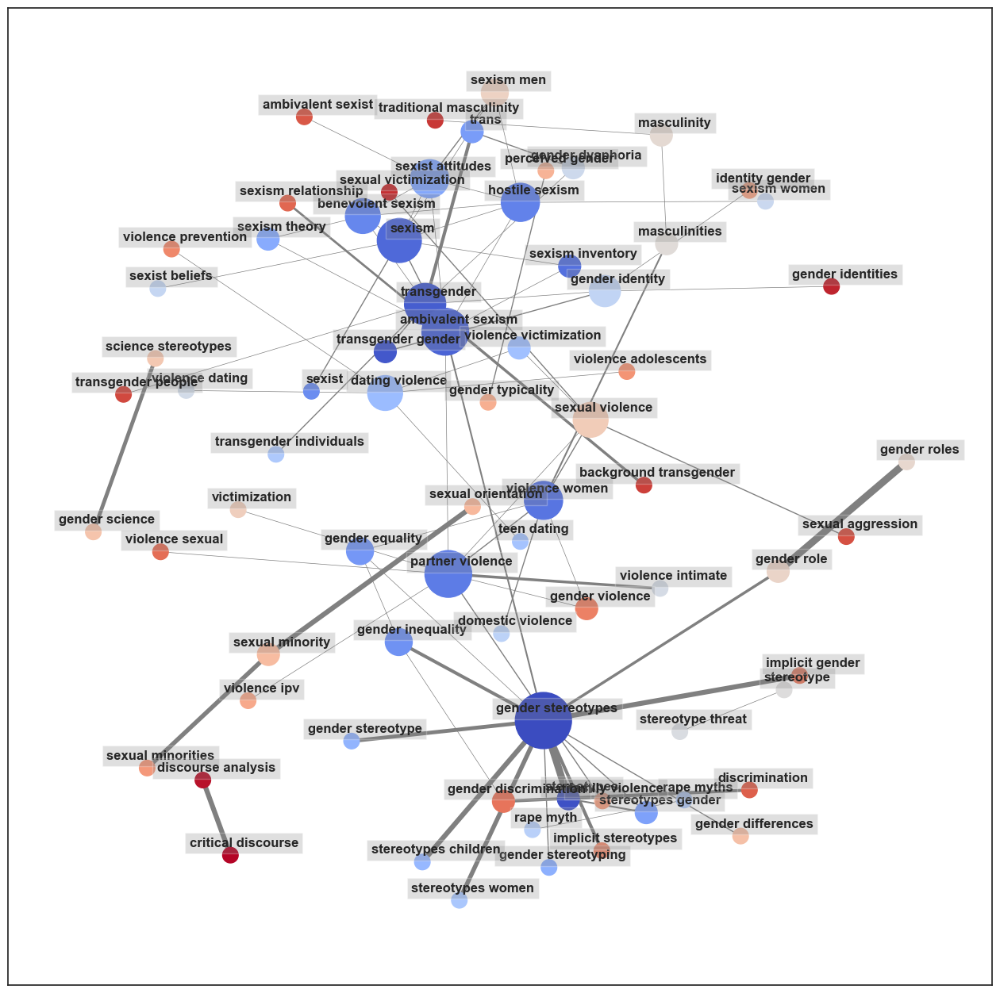

In [396]:
color_lookup = {k:v for v, k in enumerate(sorted(set(G.nodes())))}

low, *_, high = sorted(color_lookup.values())
norm = mpl.colors.Normalize(vmin=low, vmax=high, clip=True)
mapper = mpl.cm.ScalarMappable(norm=norm, cmap=mpl.cm.coolwarm)


fig, ax = plt.subplots(figsize=(16, 16))

pos = nx.spring_layout(G, k=2)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=10,
                 width=[v * 0.5 for v in degree.values()],
                 edge_color='grey',
                 node_color= [mapper.to_rgba(i) 
                    for i in color_lookup.values()],           #'purple',
                 nodelist=degree.keys(), node_size=[v * 200 for v in degree.values()],
                 with_labels = False,
                 ax=ax)

# Create offset labels
for key, value in pos.items():
    x, y = value[0]+.03, value[1]+.02
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='grey', alpha=0.25),
            horizontalalignment='center', fontsize=12, weight='bold')
    
plt.show()

In [389]:
terms_b_ss= df_ss['coupled_keywords_abstract'] 
bigrams_ss = list(chain.from_iterable(terms_b_ss)) #list(itertools.chain(*terms_b))

# Create counter of words in clean bigrams
bigram_counts_ss = collections.Counter(bigrams_ss)

bigram_df_ss = pd.DataFrame(bigram_counts_ss.most_common(100),
                             columns=['bigram', 'count'])

In [390]:
# Create dictionary of bigrams and their counts
d_ss = bigram_df_ss.set_index('bigram').T.to_dict('records')

# Create network plot 
G = nx.Graph()

# Create connections between nodes
for k, v in d_ss[0].items():
    G.add_edge(k[0], k[1], weight=(v * 10))
    degree = dict(G.degree)

#G.add_node("sexism", weight=100)
#G.add_node("misogyny", weight=100)

# these two words do not exist

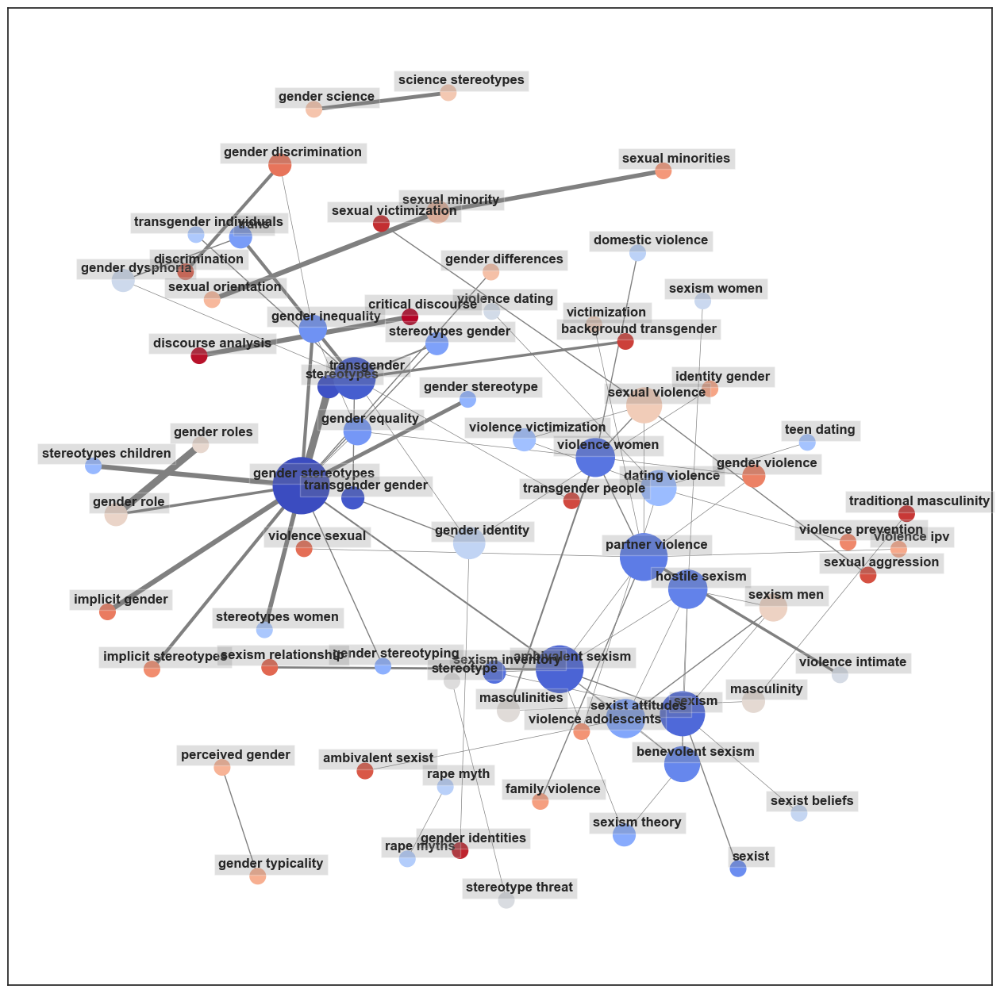

In [393]:
color_lookup = {k:v for v, k in enumerate(sorted(set(G.nodes())))}

low, *_, high = sorted(color_lookup.values())
norm = mpl.colors.Normalize(vmin=low, vmax=high, clip=True)
mapper = mpl.cm.ScalarMappable(norm=norm, cmap=mpl.cm.coolwarm)


fig, ax = plt.subplots(figsize=(16, 16))

pos = nx.spring_layout(G, k=2)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=10,
                 width=[v * 0.5 for v in degree.values()],
                 edge_color='grey',
                 node_color= [mapper.to_rgba(i) 
                    for i in color_lookup.values()],           #'purple',
                 nodelist=degree.keys(), node_size=[v * 200 for v in degree.values()],
                 with_labels = False,
                 ax=ax)

# Create offset labels
for key, value in pos.items():
    x, y = value[0]+.03, value[1]+.02
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='grey', alpha=0.25),
            horizontalalignment='center', fontsize=12, weight='bold')
    
plt.show()

## Topic modeling with Sentence embedding

In [ ]:
# Use llama.cpp to load in a Quantized LLM
#llm = Llama(model_path="openhermes-2.5-mistral-7b.Q4_K_M.gguf", n_gpu_layers=-1, n_ctx=4096, stop=["Q:", "\n"])
# https://colab.research.google.com/drive/1DdSHvVPJA3rmNfBWjCo2P1E9686xfxFx?usp=sharing#scrollTo=hqhLlG8_YhtB

In [96]:
df_comp['static_data.fullrecord_metadata.normalized_doctypes.doctype'].value_counts()

Meeting                    533
Article                    451
[Article, Early Access]     10
[Article, Meeting]           3
Name: static_data.fullrecord_metadata.normalized_doctypes.doctype, dtype: int64

In [97]:
df_comp['static_data.fullrecord_metadata.related_records.record.type']

0      NaN
1      NaN
2      NaN
3      NaN
4      NaN
      ... 
992    NaN
993    NaN
994    NaN
995    NaN
996    NaN
Name: static_data.fullrecord_metadata.related_records.record.type, Length: 997, dtype: object

### Preparing the data

In [98]:
keywords = ['Purpose: ', 'Introduction: ', 'Abstract: ']

In [ ]:
abstract_df_ss = df_soc[['index', 'abstract', 'title', 'pub_year', 'Title & Abstract']]
abstract_df_ss = abstract_df_ss.drop_duplicates(subset=['abstract', 'title'])
abstract_df_ss['abstract'] = abstract_df_ss['abstract'].replace('nan', np.nan, regex=True)
abstract_df_ss = abstract_df_ss[~abstract_df_ss['abstract'].isna()]
abstract_df_ss['abstract'] = abstract_df_ss['abstract'].apply(lambda x: x.partition("Purpose: ")[2])
abstract_df_ss['abstract'] = abstract_df_ss['abstract'].apply(lambda x: x.partition("Introduction: ")[2])
abstract_df_ss['abstract'] = abstract_df_ss['abstract'].apply(lambda x: x.partition("INTRODUCTION: ")[2])
#abstract_df_ss['abstract'] = abstract_df_ss['abstract'].apply(lambda x: x.partition("Abstract: ")[2])
len(abstract_df_ss)

In [355]:
df_comp['Title & Abstract'] = df_comp['title'] + ' ' + df_comp['abstract']

abstract_df_cs = df_comp[['index', 'abstract', 'title', 'pub_year', 'Title & Abstract']]
abstract_df_cs = abstract_df_cs.drop_duplicates(subset=['abstract', 'title'])
abstract_df_cs['abstract'] = abstract_df_cs['abstract'].replace('nan', np.nan, regex=True)
abstract_df_cs = abstract_df_cs[~abstract_df_cs['abstract'].isna()]
abstract_df_cs['abstract'] = abstract_df_cs['abstract'].apply(lambda x: x.partition("Purpose: ")[2])
abstract_df_cs['abstract'] = abstract_df_cs['abstract'].apply(lambda x: x.partition("Introduction: ")[2])
abstract_df_cs['abstract'] = abstract_df_cs['abstract'].apply(lambda x: x.partition("INTRODUCTION: ")[2])
len(abstract_df_cs)

1322

In [101]:
abstract_df_mul = df_mul[['index', 'abstract', 'title', 'pub_year', 'Title & Abstract']]
abstract_df_mul = abstract_df_mul.drop_duplicates(subset=['abstract', 'title']) 
abstract_df_mul['abstract'] = abstract_df_mul['abstract'].replace('nan', np.nan, regex=True)
abstract_df_mul = abstract_df_mul[~abstract_df_mul['abstract'].isna()]

### Updated version

In [358]:
def clean_abstract(text):
    text = text.strip()
    text = text.split('\n')
    text = " ".join(text)
    text = re.sub('\[', '', text)
    text = re.sub('\]', '', text)
    text = re.sub('^\"|\"$', '', text)
    text = text.replace('"', '')
    text = text.replace("'", "")
    text = text.replace("\\", "'")
    text = text.replace(":", ": ")
    text = text.replace("-", " - ")
    text = re.sub(' +', ' ', text) # remove multiple spaces
    return text

In [359]:
clean_abstract(df_ss['title and abstract'].iloc[78])

'Racial discrimination and the weathering of nonmarital relationships. Objective: The purpose of this study was to assess the impact of perceived racial discrimination on the satisfaction and dissolution of different - gender, nonmarital relationships among African American young adults.Background: Racial discrimination has proven detrimental to relationship quality among married couples. Racial disparities in relationship processes begin long before marriages form, however. Racial discrimination may also weather and disrupt nonmarital relationships earlier in the life course.Method: Survey data from African American young adult couples (N = 407) from the Family and Community Health Study were used to assess the associations between each partners experience of racial discrimination, relationship satisfaction, and relationship dissolution using structural equation modeling.Results: Results support a stress spillover perspective in that racial discrimination experienced by both men and w

In [360]:
df_arxiv['abstract']

0      Women are influential online, especially in im...
1      Objective: The goal of this study is to unders...
2      Imagine a princess asleep in a castle, waiting...
3      Online misogyny has become an increasing worry...
4      Online social platforms have been the battlefi...
                             ...                        
227    We propose and explore the possibility that la...
234    Anti-Asian hate/toxic/racial speech has recent...
235    Sexual harassment in academia is often a hidde...
236    The world needs diverse and unbiased data to t...
237    We present a data-driven approach using word e...
Name: abstract, Length: 180, dtype: object

In [361]:
df_titles = df_titles.rename(columns = {'static_data.fullrecord_metadata.abstracts.abstract.abstract_text.p': 'abstract'})
df_titles['abstract'] = df_titles['abstract'].astype(str)

In [362]:
df_cs['title and abstract'] = df_cs['title and abstract'].astype(str).apply(clean_abstract)
df_ss['title and abstract'] = df_ss['title and abstract'].astype(str).apply(clean_abstract)

In [385]:
df_arxiv['title and abstract'] = df_arxiv['title'] + '. ' + df_arxiv['abstract']
df_titles['title and abstract'] = df_titles['title'] + '. ' + df_titles['abstract']

df_titles_temp = pd.DataFrame()
df_arxiv_temp = pd.DataFrame()

df_titles['pub_year'] = np.where(df_titles['static_data.summary.pub_info.early_access_year'].isnull(), df_titles['static_data.summary.pub_info.pubyear'], df_titles['static_data.summary.pub_info.early_access_year'])

# only keeping the ones in our desired range of years
df_titles = df_titles[df_titles['pub_year'].isin([2022., 2021., 2020., 2019., 2018., 2017., 2016., 2015.,
       2014., 2013., 2012.])]

df_titles['pub_year'] = df_titles['pub_year'].astype(np.int64) # change from numpy.float64 to numpy.int64 type

df_titles_temp['pub_year'] = df_titles['pub_year']
df_arxiv_temp['pub_year'] = df_arxiv['published_year']

df_titles_temp['title and abstract'] = df_titles['title and abstract']
df_arxiv_temp['title and abstract'] = df_arxiv['title and abstract']

df_arxiv_temp = pd.concat([df_titles_temp, df_arxiv_temp], axis=0)
df_arxiv_temp = df_arxiv_temp.reset_index(drop=True)
df_arxiv_temp['title and abstract'] = df_arxiv_temp['title and abstract'].astype(str).apply(clean_abstract)

In [386]:
df_arxiv_temp

,pub_year,title and abstract
0,2017,Deep Learning for Hate Speech Detection in Twe...
1,2021,Automatic Misogyny Detection in Social Media P...
2,2019,Online Hate Speech against Women: Automatic Id...
3,2021,Now there are a lot like you: an artistic - ed...
4,2022,Counterfactually Augmented Data and Unintended...
...,...,...
211,2022,"Out of One, Many: Using Language Models to Sim..."
212,2022,"Sinophobia, misogyny, facism, and many more: A..."
213,2019,Unwanted Advances in Higher Education: Uncover...
214,2018,Hydra: A Peer to Peer Distributed Training & D...


### Social Science

In [191]:
# Create representation models
keybert_model = KeyBERTInspired(top_n_words=80, nr_repr_docs= 40, random_state=1234)
mmr_model = MaximalMarginalRelevance(diversity=0.2)
pos_patterns = [
            [{'POS': 'ADJ'}, {'POS': 'NOUN'}],
            [{'POS': 'NOUN'}], [{'POS': 'ADJ'}]
]
# DEFAULT_PATTERNS = [ [{'POS': 'ADJ'}, {'POS': 'NOUN'}], [{'POS': 'NOUN'}], [{'POS': 'ADJ'}] ]
pos_model = PartOfSpeech("en_core_web_sm", pos_patterns=pos_patterns) 

# LLM model
llm = Llama(model_path="../openhermes-2.5-mistral-7b.Q3_K_M.gguf", n_gpu_layers=-1, n_ctx=4096, stop=["Q:", "\n"])
prompt = """ Q:
I have a topic that contains the following documents:
[DOCUMENTS]

The topic is described by the following keywords: '[KEYWORDS]'.

Based on the above information, can you give a short label of the topic of at most 5 words?
A:
"""

representation_models = {
    "KeyBERT": keybert_model,
    "POS": pos_model,
    "MMR": mmr_model,
    "LLM": LlamaCPP(llm, prompt=prompt),
}


#representation_models = [pos_model, keybert_model, mmr_model]

ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)

#word_model = api.load('fasttext-wiki-news-subwords-300')
#sentence_model = SentenceTransformer("all-MiniLM-L6-v2") #  all-mpnet-base-v2
sentence_model = SentenceTransformer("BAAI/bge-small-en")
#word_doc_embedder = WordDocEmbedder(embedding_model=sentence_model, word_embedding_model=word_model)
embeddings_ss = sentence_model.encode(df_ss['title and abstract'].to_list(), show_progress_bar=True)

llama_model_loader: loaded meta data with 20 key-value pairs and 291 tensors from ../openhermes-2.5-mistral-7b.Q3_K_M.gguf (version GGUF V3 (latest))
llama_model_loader: Dumping metadata keys/values. Note: KV overrides do not apply in this output.
llama_model_loader: - kv   0:                       general.architecture str              = llama
llama_model_loader: - kv   1:                               general.name str              = teknium_openhermes-2.5-mistral-7b
llama_model_loader: - kv   2:                       llama.context_length u32              = 32768
llama_model_loader: - kv   3:                     llama.embedding_length u32              = 4096
llama_model_loader: - kv   4:                          llama.block_count u32              = 32
llama_model_loader: - kv   5:                  llama.feed_forward_length u32              = 14336
llama_model_loader: - kv   6:                 llama.rope.dimension_count u32              = 128
llama_model_loader: - kv   7:               

In [187]:
df_ss['title and abstract'].iloc[78]

"Deciphering the messages of gender violence: A typological approach and application in the context of gender violence in Africa. Gender violence has drawn academic and political attention due to its pervasiveness in practically every society in the world. Although gender violence sparked debates within the international feminist movement back in the 1970s, it took decades for political leaders and international organisations to come to terms with its meaning. It has since become crystallised in a variety of resolutions and recommendations of the United Nations, such as the Convention on the Elimination of All Forms of Discrimination Against Women (CEDAW, 1979) and its subsequent protocols and recommendations, and the Vienna Declaration and Programme of Action (1993). Nevertheless, much of the debate in the political arena has equated gender violence with violence against women and girls, eschewing a much broader and necessary understanding of social gender hierarchies and their relati

In [192]:
# Pre-reduce embeddings for visualization purposes
reduced_embeddings_ss = umap.UMAP(n_neighbors=15, n_components=2, min_dist=0.0, metric='cosine', random_state=42).fit_transform(embeddings_ss)

In [193]:
umap_model = umap.UMAP(n_neighbors=20, n_components=50, min_dist=0.0, metric='cosine', random_state=1234)
#vectorizer_model = CountVectorizer(stop_words="english")
vectorizer_model = TfidfVectorizer()
cluster_model = KMeans(n_clusters=20)
hdbscan_model = HDBSCAN(min_cluster_size=25, min_samples=20,
                        gen_min_span_tree=True,
                        prediction_data=True, 
                        metric = 'manhattan').fit(embeddings_ss)

#reduced_embeddings_comp = umap.UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine').fit_transform(embeddings_comp)

topic_model_ss = BERTopic(
    language='english', # Set to 'multilingual' for datasets with languages other than English. # a few other languages set so changing from 'english'
    top_n_words=30,
    n_gram_range=(1, 3),
    #min_topic_size=10,
    nr_topics= 'auto',
    low_memory=False,
    calculate_probabilities=True, # The probabilities of all topics per document.
    representation_model=representation_models,
    embedding_model=sentence_model,
    hdbscan_model= hdbscan_model, #cluster_model, 
    umap_model=umap_model, 
    vectorizer_model=vectorizer_model,
    ctfidf_model=ctfidf_model
)

In [194]:
topics_ss, probs_ss = topic_model_ss.fit_transform(df_ss['title and abstract'], embeddings_ss)

ggml_metal_free: deallocating

llama_print_timings:        load time =   13867.33 ms
llama_print_timings:      sample time =     171.38 ms /    11 runs   (   15.58 ms per token,    64.19 tokens per second)
llama_print_timings: prompt eval time =   73810.79 ms /  2530 tokens (   29.17 ms per token,    34.28 tokens per second)
llama_print_timings:        eval time =   44927.63 ms /    10 runs   ( 4492.76 ms per token,     0.22 tokens per second)
llama_print_timings:       total time =  122004.86 ms
Llama.generate: prefix-match hit

llama_print_timings:        load time =   13867.33 ms
llama_print_timings:      sample time =      79.10 ms /    15 runs   (    5.27 ms per token,   189.63 tokens per second)
llama_print_timings: prompt eval time =   64242.79 ms /  2794 tokens (   22.99 ms per token,    43.49 tokens per second)
llama_print_timings:        eval time =   38047.81 ms /    14 runs   ( 2717.70 ms per token,     0.37 tokens per second)
llama_print_timings:       total time =  105315

In [195]:
topic_model_ss.get_topic_info()

,Topic,Count,Name,Representation,KeyBERT,POS,MMR,LLM,Representative_Docs
0,-1,1396,-1_gambling_violence_health_sexual,"[gambling, violence, health, sexual, to, as, w...","[research, transgender, women, adolescents, ge...","[gambling, violence, health, sexual, women, ge...","[gambling, violence, health, sexual, women, ge...",[- Discrimination and Drinking\n- Transgender ...,[Effects of Violence on Transgender People. Wh...
1,0,483,0_sexism_discrimination_benevolent_leadership,"[sexism, discrimination, benevolent, leadershi...","[feminist, women, discrimination, sexism, sexi...","[sexism, discrimination, benevolent, leadershi...","[sexism, discrimination, benevolent, prejudice...","[Sexism and Leadership Preferences, , , , , , ...",[Untangling the relationship between gender an...
2,1,251,1_ipv_intimate_partner_violence,"[ipv, intimate, partner, violence, ptsd, recid...","[victimization, ptsd, violence, trauma, victim...","[intimate, partner, violence, recidivism, trau...","[ipv, intimate, ptsd, trauma, abuse, posttraum...",[Intimate Partner Violence\n\nAnswer: Intimate...,[Gender Patterns in the Use of Physical Violen...
3,2,249,2_math_stem_mathematics_career,"[math, stem, mathematics, career, science, eng...","[research, academic, science, students, stereo...","[math, mathematics, career, science, engineeri...","[math, stem, mathematics, science, academic, m...","[Math Stereotypes and STEM Interest, , , , , ,...",[Examining adolescent daughters and their pare...
4,3,153,3_speech_languages_language_speakers,"[speech, languages, language, speakers, nouns,...","[sociolinguistic, nlp, lexical, language, morp...","[speech, languages, language, speakers, nouns,...","[language, nouns, grammatical, embeddings, sem...",[Multilingual Author Profiling on Social Media...,[Improving the affective analysis in texts Aut...
5,4,145,4_transgender_tgd_suicide_affirmation,"[transgender, tgd, suicide, affirmation, ideat...","[transgender, lgbtq, stigma, lgbt, dysphoria, ...","[transgender, suicide, affirmation, ideation, ...","[transgender, tgd, affirmation, dysphoria, pat...","[Transgender Mental Health Study., , , , , , ,...",[MDMA - assisted psychotherapy; Inclusion of t...
6,5,104,5_violence_peace_asylum_war,"[violence, peace, asylum, war, regimes, confli...","[feminist, violence, trafficking, article, mig...","[violence, peace, asylum, war, regimes, confli...","[violence, regimes, conflict, trafficking, ref...","[Violence, Feminism, Japan, Sexual, Culture, ,...",[The Irish Conflict and the experiences of fem...
7,6,95,6_faces_facial_brain_processing,"[faces, facial, brain, processing, gaze, conne...","[neuroimaging, fmri, cortical, brain, cerebell...","[faces, facial, brain, processing, gaze, conne...","[faces, facial, brain, gaze, face, stimuli, am...",[Face processing in MDD and Schizophrenia\n\nT...,[Altered whole brain functional connectivity p...
8,7,89,7_presidential_voters_election_candidates,"[presidential, voters, election, candidates, c...","[partisanship, political, politics, democrats,...","[presidential, voters, election, candidates, v...","[voters, election, candidates, candidate, elec...",[Presidential Election Study \n\nQuestion 2:\n...,[Implicit candidate traits in the 2016 US Pres...
9,8,76,8_dating_violence_perpetration_tdv,"[dating, violence, perpetration, tdv, teen, vi...","[victimization, adolescents, adolescence, prev...","[dating, violence, perpetration, teen, victimi...","[dating, violence, teen, victimization, adoles...",[Teen Dating Violence and Prevention Strategie...,[Genders Role in Exposure to Interparental Vio...


In [200]:
topic_model_ss._outliers

1

In [26]:
# Use llama.cpp to load in a Quantized LLM
# Copying the relative path to the main directory, hence '..'
llm = Llama(model_path="../openhermes-2.5-mistral-7b.Q3_K_M.gguf", n_gpu_layers=-1, n_ctx=4096, stop=["Q:", "\n"])

llama_model_loader: loaded meta data with 20 key-value pairs and 291 tensors from ../openhermes-2.5-mistral-7b.Q3_K_M.gguf (version GGUF V3 (latest))
llama_model_loader: Dumping metadata keys/values. Note: KV overrides do not apply in this output.
llama_model_loader: - kv   0:                       general.architecture str              = llama
llama_model_loader: - kv   1:                               general.name str              = teknium_openhermes-2.5-mistral-7b
llama_model_loader: - kv   2:                       llama.context_length u32              = 32768
llama_model_loader: - kv   3:                     llama.embedding_length u32              = 4096
llama_model_loader: - kv   4:                          llama.block_count u32              = 32
llama_model_loader: - kv   5:                  llama.feed_forward_length u32              = 14336
llama_model_loader: - kv   6:                 llama.rope.dimension_count u32              = 128
llama_model_loader: - kv   7:               

Following two steps only after installing 'clblast'

In [27]:
LlamaCPP(llm, prompt='how are you?')

LlamaCPP(model=<llama_cpp.llama.Llama object at 0x2a2a99cc0>,
         prompt='how are you?')

Trying <b>without</b> the LLM now

In [474]:
"""# Pre-calculate embeddings
#embedding_model = SentenceTransformer("BAAI/bge-small-en")
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")

# Create representation models
keybert_model = KeyBERTInspired(top_n_words=80, nr_repr_docs= 40, random_state=1234)
mmr_model = MaximalMarginalRelevance(diversity=0.2)
pos_patterns = [
            [{'POS': 'ADJ'}, {'POS': 'NOUN'}],
            [{'POS': 'NOUN'}], [{'POS': 'ADJ'}]
]
# DEFAULT_PATTERNS = [ [{'POS': 'ADJ'}, {'POS': 'NOUN'}], [{'POS': 'NOUN'}], [{'POS': 'ADJ'}] ]
pos_model = PartOfSpeech("en_core_web_sm", pos_patterns=pos_patterns) 
representation_models = [pos_model, keybert_model, mmr_model]

ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)

#word_doc_embedder = WordDocEmbedder(embedding_model=sentence_model, word_embedding_model=word_model)
embeddings_ss = sentence_model.encode(df_ss['title and abstract'].to_list(), show_progress_bar=True)

# Pre-reduce embeddings for visualization purposes
#reduced_embeddings_ss = umap.UMAP(n_neighbors=15, n_components=2, min_dist=0.0, metric='cosine', random_state=42).fit_transform(embeddings_ss)"""

Batches: 100%|██████████| 94/94 [12:19<00:00,  7.86s/it]


In [475]:
"""# Define sub-models
umap_model = umap.UMAP(n_neighbors=20, n_components=50, min_dist=0.0, metric='cosine', random_state=1234)
#hdbscan_model = HDBSCAN(min_cluster_size=400, metric='euclidean', cluster_selection_method='eom', prediction_data=True)
hdbscan_model = HDBSCAN(min_cluster_size=25, min_samples=20,
                        gen_min_span_tree=True,
                        prediction_data=True, 
                        metric = 'manhattan').fit(embeddings_ss)"""

In [476]:
"""topic_model_ss = BERTopic(

  # Sub-models
  embedding_model=embedding_model,
  umap_model=umap_model,
  hdbscan_model=hdbscan_model,
  representation_model=representation_models,
  # Hyperparameters
  top_n_words=10,
  verbose=True,
  language='english', # Set to 'multilingual' for datasets with languages other than English. # a few other languages set so changing from 'english'
  #top_n_words=30,
  n_gram_range=(1, 3),
  #min_topic_size=10,
  nr_topics= 'auto',
  low_memory=False,
  calculate_probabilities=True, # The probabilities of all topics per document.
  vectorizer_model=vectorizer_model,
  ctfidf_model=ctfidf_model,
)"""

In [477]:
"""# Train model
topics_ss, probs_ss = topic_model_ss.fit_transform(df_ss['title and abstract'].to_list(), embeddings_ss)"""

2024-01-09 17:43:42,202 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-01-09 17:43:55,248 - BERTopic - Dimensionality - Completed ✓
2024-01-09 17:43:55,254 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-01-09 17:43:55,660 - BERTopic - Cluster - Completed ✓
2024-01-09 17:43:55,661 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-01-09 17:44:50,240 - BERTopic - Representation - Completed ✓
2024-01-09 17:44:50,252 - BERTopic - Topic reduction - Reducing number of topics
2024-01-09 17:45:33,646 - BERTopic - Topic reduction - Reduced number of topics from 25 to 21


In [196]:
# Show topics
topic_model_ss.get_topic_info()

,Topic,Count,Name,Representation,KeyBERT,POS,MMR,LLM,Representative_Docs
0,-1,1396,-1_gambling_violence_health_sexual,"[gambling, violence, health, sexual, to, as, w...","[research, transgender, women, adolescents, ge...","[gambling, violence, health, sexual, women, ge...","[gambling, violence, health, sexual, women, ge...",[- Discrimination and Drinking\n- Transgender ...,[Effects of Violence on Transgender People. Wh...
1,0,483,0_sexism_discrimination_benevolent_leadership,"[sexism, discrimination, benevolent, leadershi...","[feminist, women, discrimination, sexism, sexi...","[sexism, discrimination, benevolent, leadershi...","[sexism, discrimination, benevolent, prejudice...","[Sexism and Leadership Preferences, , , , , , ...",[Untangling the relationship between gender an...
2,1,251,1_ipv_intimate_partner_violence,"[ipv, intimate, partner, violence, ptsd, recid...","[victimization, ptsd, violence, trauma, victim...","[intimate, partner, violence, recidivism, trau...","[ipv, intimate, ptsd, trauma, abuse, posttraum...",[Intimate Partner Violence\n\nAnswer: Intimate...,[Gender Patterns in the Use of Physical Violen...
3,2,249,2_math_stem_mathematics_career,"[math, stem, mathematics, career, science, eng...","[research, academic, science, students, stereo...","[math, mathematics, career, science, engineeri...","[math, stem, mathematics, science, academic, m...","[Math Stereotypes and STEM Interest, , , , , ,...",[Examining adolescent daughters and their pare...
4,3,153,3_speech_languages_language_speakers,"[speech, languages, language, speakers, nouns,...","[sociolinguistic, nlp, lexical, language, morp...","[speech, languages, language, speakers, nouns,...","[language, nouns, grammatical, embeddings, sem...",[Multilingual Author Profiling on Social Media...,[Improving the affective analysis in texts Aut...
5,4,145,4_transgender_tgd_suicide_affirmation,"[transgender, tgd, suicide, affirmation, ideat...","[transgender, lgbtq, stigma, lgbt, dysphoria, ...","[transgender, suicide, affirmation, ideation, ...","[transgender, tgd, affirmation, dysphoria, pat...","[Transgender Mental Health Study., , , , , , ,...",[MDMA - assisted psychotherapy; Inclusion of t...
6,5,104,5_violence_peace_asylum_war,"[violence, peace, asylum, war, regimes, confli...","[feminist, violence, trafficking, article, mig...","[violence, peace, asylum, war, regimes, confli...","[violence, regimes, conflict, trafficking, ref...","[Violence, Feminism, Japan, Sexual, Culture, ,...",[The Irish Conflict and the experiences of fem...
7,6,95,6_faces_facial_brain_processing,"[faces, facial, brain, processing, gaze, conne...","[neuroimaging, fmri, cortical, brain, cerebell...","[faces, facial, brain, processing, gaze, conne...","[faces, facial, brain, gaze, face, stimuli, am...",[Face processing in MDD and Schizophrenia\n\nT...,[Altered whole brain functional connectivity p...
8,7,89,7_presidential_voters_election_candidates,"[presidential, voters, election, candidates, c...","[partisanship, political, politics, democrats,...","[presidential, voters, election, candidates, v...","[voters, election, candidates, candidate, elec...",[Presidential Election Study \n\nQuestion 2:\n...,[Implicit candidate traits in the 2016 US Pres...
9,8,76,8_dating_violence_perpetration_tdv,"[dating, violence, perpetration, tdv, teen, vi...","[victimization, adolescents, adolescence, prev...","[dating, violence, perpetration, teen, victimi...","[dating, violence, teen, victimization, adoles...",[Teen Dating Violence and Prevention Strategie...,[Genders Role in Exposure to Interparental Vio...


In [485]:
#topic_model_ss.get_topics(full=True)['Main'].keys()

dict_values([[('violence', 0.41463605), ('sexism', 0.38903782), ('gender', 0.38273504), ('trauma', 0.30641878), ('ptsd', 0.25628167), ('social', 0.23939562), ('disability', 0.18382104), ('autism', 0.17633384), ('veterans', 0.14349975), ('ict', 0.09597199)], [('violence', 0.4977471), ('rape', 0.44273576), ('aggression', 0.43127197), ('victimization', 0.42619443), ('assault', 0.40884686), ('victims', 0.3700328), ('adolescents', 0.3340267), ('consent', 0.3233979), ('aggressors', 0.31815827), ('perpetrator', 0.28326365)], [('stereotypes', 0.48991424), ('stereotype', 0.4692835), ('gender', 0.4423055), ('aspirations', 0.39793694), ('academic', 0.38263965), ('academia', 0.37589478), ('students', 0.34983188), ('disciplines', 0.34834337), ('professors', 0.32726032), ('career', 0.3157363)], [('sexism', 0.57975537), ('masculinity', 0.5073186), ('sexist', 0.48499584), ('heterosexuals', 0.4767226), ('feminist', 0.46965575), ('feminists', 0.46784756), ('prejudice', 0.4382024), ('stereotyping', 0.405

In [ ]:
"""
# Create a label for each document
labels_ss = [re.sub(r'\W+', ' ', label[0][0].split("\n")[0].replace('"', '')) for label in topic_model_ss.get_topics(full=True)["Main"].values()]
labels_ss = [label if label else "Unlabelled" for label in labels_ss]
all_labels_ss = [labels_ss[topic+topic_model_ss._outliers] if topic != -1 else "Unlabelled" for topic in topics_ss]

# Run the visualization
datamapplot.create_plot(
    embeddings_ss,#reduced_embeddings,
    all_labels_ss,
    label_font_size=11,
    title="ArXiv - BERTopic",
    sub_title="Topics labeled with `openhermes-2.5-mistral-7b`",
    label_wrap_width=20,
    use_medoids=True,
)"""

In [206]:
labels_ss = [re.sub(r'\W+', ' ', label[0][0].split("\n")[0].replace('"', '')) for label in topic_model_ss.get_topics(full=True)["LLM"].values()]
labels_ss = [label if label else "Unlabelled" for label in labels_ss]
all_labels_ss = [labels_ss[topic+topic_model_ss._outliers] if topic != -1 else "Unlabelled" for topic in topics_ss]
all_labels_ss

['Unlabelled',
 'Coaches and athletes perception and awareness in sports ',
 'Multilingual Author Profiling on Social Media ',
 'Sexism and Leadership Preferences',
 'Sexism and Leadership Preferences',
 'Sexism and Leadership Preferences',
 'Unlabelled',
 'Unlabelled',
 'Sexism and Leadership Preferences',
 'Unlabelled',
 'Multilingual Author Profiling on Social Media ',
 'Gender Studies and Anthropology',
 'Unlabelled',
 'Unlabelled',
 'COVID 19 Mental Health Implications ',
 'Multilingual Author Profiling on Social Media ',
 'Math Stereotypes and STEM Interest',
 'Unlabelled',
 'Violence Feminism Japan Sexual Culture',
 'Intimate Partner Violence',
 'Unlabelled',
 'Violence Feminism Japan Sexual Culture',
 'Multilingual Author Profiling on Social Media ',
 'Multilingual Author Profiling on Social Media ',
 'Multilingual Author Profiling on Social Media ',
 'Multilingual Author Profiling on Social Media ',
 'Multilingual Author Profiling on Social Media ',
 'Multilingual Author Profi

(<Figure size 1600x1600 with 1 Axes>,
 <Axes: title={'left': 'A data map of papers from the Social Science studies on sexism/misogyny'}>)

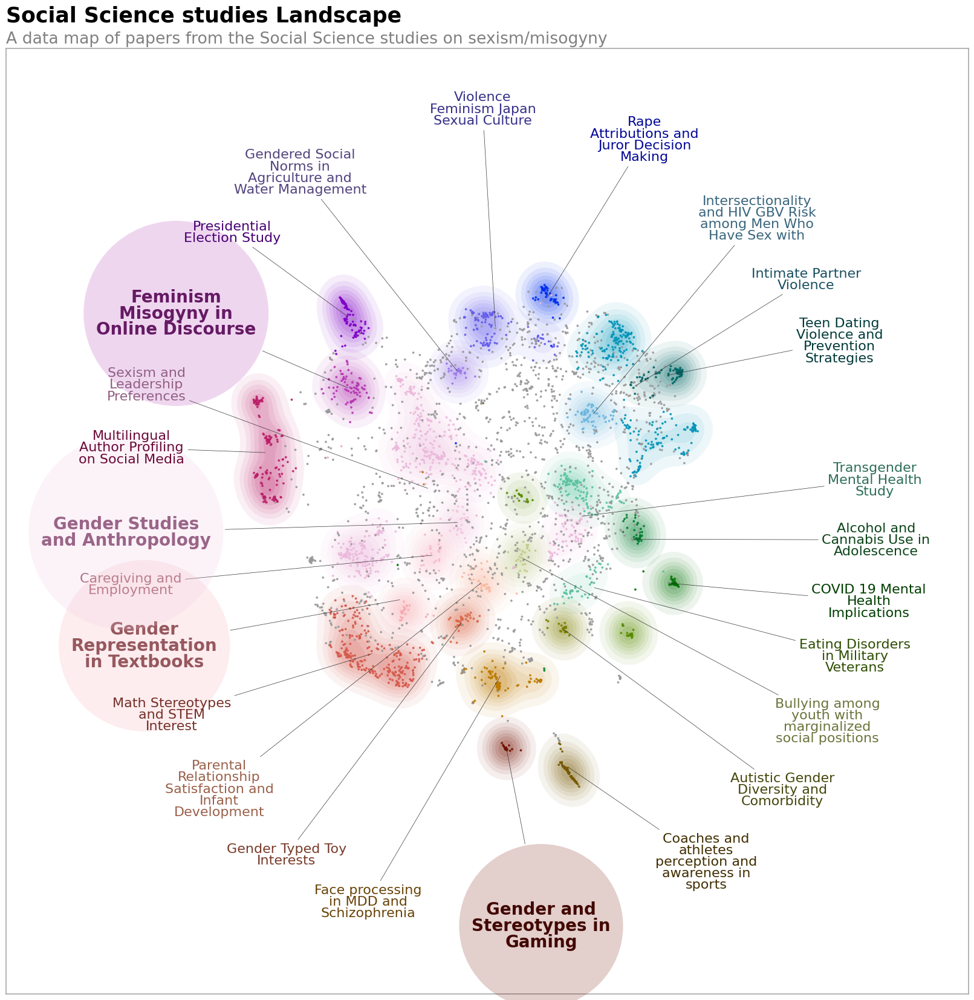

In [357]:
# Run the visualization
"""datamapplot.create_plot(
    embeddings_ss,
    all_labels_ss,
    label_font_size=11,
    title="ArXiv - BERTopic",
    sub_title="Topics labeled with `openhermes-2.5-mistral-7b`",
    label_wrap_width=20,
    use_medoids=True,
    #logo=bertopic_logo,
    #logo_width=0.16
)"""

datamapplot.create_plot(
    reduced_embeddings_ss,
    all_labels_ss,
    title="Social Science studies Landscape",
    sub_title="A data map of papers from the Social Science studies on sexism/misogyny",
    highlight_labels=[
        "Feminism Misogyny in Online Discourse",
        "Gender Studies and Anthropology",
        "Gender Representation in Textbooks",
        "Gender and Stereotypes in Gaming"
    ],
    label_font_size=16,
    highlight_label_keywords={
        "fontsize": 20, "fontweight": "bold", "bbox":{"boxstyle":"circle", "pad":0.75}
    },
    #label_margin_factor=2.0,
    add_glow=True,
    figsize=(16, 16),
    #logo=arxiv_logo,
)

In [323]:
all_labels_ss.count("Feminism Misogyny in Online Discourse")

74

In [324]:
all_labels_ss.count("Gender Studies and Anthropology")

32

In [326]:
all_labels_ss.count("Gender Representation in Textbooks")

26

In [325]:
all_labels_ss.count("Gender and Stereotypes in Gaming")

30

In [76]:
topic_model_ss.visualize_barchart(topics=None, top_n_topics=20, n_words=10, custom_labels=True, width=350, height=350)

In [102]:
'''
topics_change_ss = {0: 'Gender-based violence', 1: 'Gender-based cyberbullying', 2: 'Sexism in politics', 
                      3: '', 4: '', 5: '',
                      6: '', 7: '', 8: 'Gender stereotypes'}

topic_model_ss.set_topic_labels(topics_change_ss)
'''

"\ntopics_change_ss = {0: 'Gender-based violence', 1: 'Gender-based cyberbullying', 2: 'Sexism in politics', \n                      3: '', 4: '', 5: '',\n                      6: '', 7: '', 8: 'Gender stereotypes'}\n\ntopic_model_ss.set_topic_labels(topics_change_ss)\n"

In [124]:
topic_model_ss.visualize_documents(abstract_df_ss['Title & Abstract'].to_list(), custom_labels=True, width=750, height=500) 

In [125]:
soc_doc_topic = pd.DataFrame({'document': abstract_df_ss['Title & Abstract'], 'topic': topics_ss}).reset_index(drop=True)
soc_doc_topic

,document,topic
0,Employers' stereotypes and taste-based discrim...,0
1,"Breaking with the ""Ignorance Cycle"": The Socie...",0
2,Strongly identifying Italian women support the...,0
3,Help-seeking behaviours of those experiencing ...,0
4,The process of manualization of linguistic kno...,0
...,...,...
2776,Scripts for Actual First Date and Hanging-Out ...,0
2777,Regression-Based Norms Improve the Sensitivity...,0
2778,THE EFFECTS OF IMPULSIVENESS AND ALCOHOL ABUSE...,0
2779,Gender Differences in Self-Conscious Emotional...,0


In [105]:
topic_model_ss.get_topic(3)

[('acculturation', 0.43648583),
 ('discrimination', 0.3847873),
 ('adolescents', 0.38104793),
 ('health', 0.347544),
 ('anxiety', 0.3327464),
 ('disorders', 0.32358983),
 ('ethnic', 0.30845103),
 ('social', 0.29849368),
 ('autism', 0.26061037),
 ('asd', 0.18802008)]

In [106]:
soc_doc_topic[soc_doc_topic['topic'] == 3]

,document,topic
20,Identity formation with gender differences in ...,3
26,Design and study of psychometric properties of...,3
60,Psychometric Properties of the Utrecht Work En...,3
87,I am one of you! Team prototypicality as a fac...,3
135,The Intersection of Transgender and Gender-Div...,3
...,...,...
2719,Embedding Concepts of Sex and Gender Health Di...,3
2733,Reversing Implicit Gender Stereotype Activatio...,3
2751,Gender-Specific Correlates of Complementary an...,3
2753,Blaming the Messenger for the Bad News about P...,3


In [107]:
soc_doc_topic[soc_doc_topic['document'].str.startswith('Purpose: ')]

,document,topic


In [85]:
soc_doc_topic[soc_doc_topic['document'].str.startswith('PURPOSE: ')]

,document,topic


In [86]:
soc_doc_topic['document'].iloc[25]

''

In [87]:
soc_doc_topic['document'].iloc[25].partition("Purpose: ")[2]

''

### Technology

In [405]:
"""# Create representation models
keybert_model = KeyBERTInspired(top_n_words=50, nr_repr_docs= 10, random_state=1234)
mmr_model = MaximalMarginalRelevance(diversity=0.3)
pos_patterns = [
            [{'POS': 'ADJ'}, {'POS': 'NOUN'}],
            [{'POS': 'NOUN'}], [{'POS': 'ADJ'}]
]
# DEFAULT_PATTERNS = [ [{'POS': 'ADJ'}, {'POS': 'NOUN'}], [{'POS': 'NOUN'}], [{'POS': 'ADJ'}] ]
pos_model = PartOfSpeech("en_core_web_sm", pos_patterns=pos_patterns) 

representation_models = [pos_model, keybert_model, mmr_model]

ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)

#word_model = api.load('fasttext-wiki-news-subwords-300')
sentence_model = SentenceTransformer("all-mpnet-base-v2") # all-MiniLM-L6-v2
#word_doc_embedder = WordDocEmbedder(embedding_model=sentence_model, word_embedding_model=word_model)
embeddings_cs = sentence_model.encode(df_cs['title and abstract'].to_list(), show_progress_bar=True)"""

Batches: 100%|██████████| 44/44 [6:07:26<00:00, 501.06s/it]  


In [154]:
"""# Create representation models
keybert_model = KeyBERTInspired(top_n_words=80, nr_repr_docs= 40, random_state=1234)
mmr_model = MaximalMarginalRelevance(diversity=0.2)
pos_patterns = [
            [{'POS': 'ADJ'}, {'POS': 'NOUN'}],
            [{'POS': 'NOUN'}], [{'POS': 'ADJ'}]
]
# DEFAULT_PATTERNS = [ [{'POS': 'ADJ'}, {'POS': 'NOUN'}], [{'POS': 'NOUN'}], [{'POS': 'ADJ'}] ]
pos_model = PartOfSpeech("en_core_web_sm", pos_patterns=pos_patterns) 

# LLM model
llm = Llama(model_path="../openhermes-2.5-mistral-7b.Q3_K_M.gguf", n_gpu_layers=-1, n_ctx=4096, stop=["Q:", "\n"])
prompt = """ Q:
I have a topic that contains the following documents:
[DOCUMENTS]

The topic is described by the following keywords: '[KEYWORDS]'.

Based on the above information, can you give a short label of the topic of at most 5 words?
A:
"""

representation_models = {
    "KeyBERT": keybert_model,
    "POS": pos_model,
    "MMR": mmr_model,
    "LLM": LlamaCPP(llm, prompt=prompt),
}


#representation_models = [pos_model, keybert_model, mmr_model]

ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)

#word_model = api.load('fasttext-wiki-news-subwords-300')
#sentence_model = SentenceTransformer("all-MiniLM-L6-v2") #  all-mpnet-base-v2
sentence_model = SentenceTransformer("BAAI/bge-small-en")
#word_doc_embedder = WordDocEmbedder(embedding_model=sentence_model, word_embedding_model=word_model)
embeddings_cs = sentence_model.encode(df_arxiv_temp['title and abstract'].to_list(), show_progress_bar=True)# df_cs['title and abstract'].to_list()"""

llama_model_loader: loaded meta data with 20 key-value pairs and 291 tensors from ../openhermes-2.5-mistral-7b.Q3_K_M.gguf (version GGUF V3 (latest))
llama_model_loader: Dumping metadata keys/values. Note: KV overrides do not apply in this output.
llama_model_loader: - kv   0:                       general.architecture str              = llama
llama_model_loader: - kv   1:                               general.name str              = teknium_openhermes-2.5-mistral-7b
llama_model_loader: - kv   2:                       llama.context_length u32              = 32768
llama_model_loader: - kv   3:                     llama.embedding_length u32              = 4096
llama_model_loader: - kv   4:                          llama.block_count u32              = 32
llama_model_loader: - kv   5:                  llama.feed_forward_length u32              = 14336
llama_model_loader: - kv   6:                 llama.rope.dimension_count u32              = 128
llama_model_loader: - kv   7:               

In [387]:
# Create representation models
main_representation = KeyBERTInspired()
keybert_model = KeyBERTInspired(top_n_words=80, nr_repr_docs= 40, random_state=1234)
mmr_model = MaximalMarginalRelevance(diversity=0.5)
pos_patterns = [
            [{'POS': 'ADJ'}, {'POS': 'NOUN'}],
            [{'POS': 'NOUN'}], [{'POS': 'ADJ'}]
]
# DEFAULT_PATTERNS = [ [{'POS': 'ADJ'}, {'POS': 'NOUN'}], [{'POS': 'NOUN'}], [{'POS': 'ADJ'}] ]
pos_model = PartOfSpeech("en_core_web_sm", pos_patterns=pos_patterns) 
aspect_model2 = [keybert_model, mmr_model]

# LLM model
llm = Llama(model_path="../openhermes-2.5-mistral-7b.Q3_K_M.gguf", n_gpu_layers=-1, n_ctx=4096, stop=["Q:", "\n"])
prompt = """ Q:
I have a topic that contains the following documents:
[DOCUMENTS]

The topic is described by the following keywords: '[KEYWORDS]'.

Based on the above information, can you give a short label of the topic of at most 5 words?
A:
"""

representation_models = {
    "KeyBERT": keybert_model,
    "POS": pos_model,
    "Key_MMR": aspect_model2,
    "LLM": LlamaCPP(llm, prompt=prompt),
}


#representation_models = [pos_model, keybert_model, mmr_model]

ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)

#word_model = api.load('fasttext-wiki-news-subwords-300')
#sentence_model = SentenceTransformer("all-MiniLM-L6-v2") #  all-mpnet-base-v2
sentence_model = SentenceTransformer("BAAI/bge-small-en")
#word_doc_embedder = WordDocEmbedder(embedding_model=sentence_model, word_embedding_model=word_model)
embeddings_cs = sentence_model.encode(df_arxiv_temp['title and abstract'].to_list(), show_progress_bar=True)# df_cs['title and abstract'].to_list()

llama_model_loader: loaded meta data with 20 key-value pairs and 291 tensors from ../openhermes-2.5-mistral-7b.Q3_K_M.gguf (version GGUF V3 (latest))
llama_model_loader: Dumping metadata keys/values. Note: KV overrides do not apply in this output.
llama_model_loader: - kv   0:                       general.architecture str              = llama
llama_model_loader: - kv   1:                               general.name str              = teknium_openhermes-2.5-mistral-7b
llama_model_loader: - kv   2:                       llama.context_length u32              = 32768
llama_model_loader: - kv   3:                     llama.embedding_length u32              = 4096
llama_model_loader: - kv   4:                          llama.block_count u32              = 32
llama_model_loader: - kv   5:                  llama.feed_forward_length u32              = 14336
llama_model_loader: - kv   6:                 llama.rope.dimension_count u32              = 128
llama_model_loader: - kv   7:               

In [388]:
"""umap_model = umap.UMAP(n_neighbors=20, n_components=50, min_dist=0.0, metric='cosine', random_state=1234)
#vectorizer_model = CountVectorizer(stop_words="english")
vectorizer_model = TfidfVectorizer()
cluster_model = KMeans(n_clusters=15)
hdbscan_model = HDBSCAN(min_cluster_size=80, min_samples=40,
                        gen_min_span_tree=True,
                        prediction_data=True, 
                        metric='manhattan').fit(embeddings_cs)

#reduced_embeddings_comp = umap.UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine').fit_transform(embeddings_comp)

topic_model_cs = BERTopic(
    language='english', # Set to 'multilingual' for datasets with languages other than English. # a few other languages set so changing from 'english'
    top_n_words=30,
    n_gram_range=(1, 3),
    #min_topic_size=10,
    nr_topics= 'auto',
    low_memory=False,
    calculate_probabilities=True, # The probabilities of all topics per document.
    representation_model=representation_models,
    embedding_model=sentence_model,
    hdbscan_model= hdbscan_model, #cluster_model, 
    umap_model=umap_model, 
    vectorizer_model=vectorizer_model,
    ctfidf_model=ctfidf_model
)"""

'umap_model = umap.UMAP(n_neighbors=20, n_components=50, min_dist=0.0, metric=\'cosine\', random_state=1234)\n#vectorizer_model = CountVectorizer(stop_words="english")\nvectorizer_model = TfidfVectorizer()\ncluster_model = KMeans(n_clusters=15)\nhdbscan_model = HDBSCAN(min_cluster_size=80, min_samples=40,\n                        gen_min_span_tree=True,\n                        prediction_data=True, \n                        metric=\'manhattan\').fit(embeddings_cs)\n\n#reduced_embeddings_comp = umap.UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric=\'cosine\').fit_transform(embeddings_comp)\n\ntopic_model_cs = BERTopic(\n    language=\'english\', # Set to \'multilingual\' for datasets with languages other than English. # a few other languages set so changing from \'english\'\n    top_n_words=30,\n    n_gram_range=(1, 3),\n    #min_topic_size=10,\n    nr_topics= \'auto\',\n    low_memory=False,\n    calculate_probabilities=True, # The probabilities of all topics per document.\n 

In [389]:
# Pre-reduce embeddings for visualization purposes
reduced_embeddings_cs = umap.UMAP(n_neighbors=15, n_components=2, min_dist=0.0, metric='cosine', random_state=42).fit_transform(embeddings_cs)

In [532]:
umap_model = umap.UMAP(n_neighbors=20, n_components=50, min_dist=0.0, metric='cosine', random_state=1234)
#vectorizer_model = CountVectorizer(stop_words="english")
vectorizer_model = TfidfVectorizer()
cluster_model = KMeans(n_clusters=20)
hdbscan_model = HDBSCAN(min_cluster_size=25, min_samples=20,
                        gen_min_span_tree=True,
                        prediction_data=True, 
                        metric = 'manhattan').fit(embeddings_cs)

#reduced_embeddings_comp = umap.UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine').fit_transform(embeddings_comp)

topic_model_cs = BERTopic(
    language='english', # Set to 'multilingual' for datasets with languages other than English. # a few other languages set so changing from 'english'
    top_n_words=30,
    n_gram_range=(1, 3),
    #min_topic_size=10,
    nr_topics= 'auto',
    low_memory=False,
    calculate_probabilities=True, # The probabilities of all topics per document.
    representation_model=representation_models,
    embedding_model=sentence_model,
    hdbscan_model= hdbscan_model, #cluster_model, 
    umap_model=umap_model, 
    vectorizer_model=vectorizer_model,
    ctfidf_model=ctfidf_model
)

In [533]:
topics_cs, probs_cs = topic_model_cs.fit_transform(df_arxiv_temp['title and abstract'], embeddings_cs)

Llama.generate: prefix-match hit

llama_print_timings:        load time =   13070.00 ms
llama_print_timings:      sample time =     131.48 ms /    11 runs   (   11.95 ms per token,    83.66 tokens per second)
llama_print_timings: prompt eval time =   78069.71 ms /  1640 tokens (   47.60 ms per token,    21.01 tokens per second)
llama_print_timings:        eval time =   16593.80 ms /    10 runs   ( 1659.38 ms per token,     0.60 tokens per second)
llama_print_timings:       total time =   97638.85 ms
Llama.generate: prefix-match hit

llama_print_timings:        load time =   13070.00 ms
llama_print_timings:      sample time =     254.01 ms /    16 runs   (   15.88 ms per token,    62.99 tokens per second)
llama_print_timings: prompt eval time =   53891.09 ms /  1526 tokens (   35.32 ms per token,    28.32 tokens per second)
llama_print_timings:        eval time =   16518.24 ms /    15 runs   ( 1101.22 ms per token,     0.91 tokens per second)
llama_print_timings:       total time =   73

In [534]:
topic_model_cs.get_topic_info()

,Topic,Count,Name,Representation,KeyBERT,POS,Key_MMR,LLM,Representative_Docs
0,-1,57,-1_the_and_of_in,"[the, and, of, in, to, physics, on, we, that, ...","[research, feminist, stereotype, women, model,...","[physics, students, data, gender, more, sexism...","[research, feminist, stereotype, models, subre...",[Gender and language analysis in politics and ...,[Investigating societys educational debts due ...
1,0,83,0_gender_in_the_of,"[gender, in, the, of, to, and, bias, we, that,...","[biases, research, embeddings, embedding, ster...","[gender, bias, stereotypes, word, biases, lang...","[biases, research, embedding, language, stereo...",[Gender Bias in Language and Text Processing\n...,[Gender Bias in Remote Pair Programming among ...
2,1,76,1_the_of_hate_and,"[the, of, hate, and, to, speech, for, in, sexi...","[convolutional, misogynistic, annotated, categ...","[hate, speech, sexism, detection, tweets, onli...","[convolutional, misogynistic, annotated, datas...",[hate speech detection\n\nThe short label for ...,[A Unified Deep Learning Architecture for Abus...


In [535]:
topics_comp = pd.DataFrame(topic_model_cs.get_topic_info())
topics_comp

,Topic,Count,Name,Representation,KeyBERT,POS,Key_MMR,LLM,Representative_Docs
0,-1,57,-1_the_and_of_in,"[the, and, of, in, to, physics, on, we, that, ...","[research, feminist, stereotype, women, model,...","[physics, students, data, gender, more, sexism...","[research, feminist, stereotype, models, subre...",[Gender and language analysis in politics and ...,[Investigating societys educational debts due ...
1,0,83,0_gender_in_the_of,"[gender, in, the, of, to, and, bias, we, that,...","[biases, research, embeddings, embedding, ster...","[gender, bias, stereotypes, word, biases, lang...","[biases, research, embedding, language, stereo...",[Gender Bias in Language and Text Processing\n...,[Gender Bias in Remote Pair Programming among ...
2,1,76,1_the_of_hate_and,"[the, of, hate, and, to, speech, for, in, sexi...","[convolutional, misogynistic, annotated, categ...","[hate, speech, sexism, detection, tweets, onli...","[convolutional, misogynistic, annotated, datas...",[hate speech detection\n\nThe short label for ...,[A Unified Deep Learning Architecture for Abus...


In [536]:
topics_comp['Key_MMR'].iloc[1]

['biases',
 'research',
 'embedding',
 'language',
 'stereotypical',
 'women',
 'discrimination',
 'robots',
 'fer',
 'roles']

In [537]:
labels_cs = [re.sub(r'\W+', ' ', label[0][0].split("\n")[0].replace('"', '')) for label in topic_model_cs.get_topics(full=True)["LLM"].values()]
labels_cs = [label if label else "Unlabelled" for label in labels_cs]
all_labels_cs = [labels_cs[topic+topic_model_cs._outliers] if topic != -1 else "Unlabelled" for topic in topics_cs]
all_labels_cs

['hate speech detection',
 'hate speech detection',
 'hate speech detection',
 'Unlabelled',
 'Unlabelled',
 'hate speech detection',
 'hate speech detection',
 'hate speech detection',
 'hate speech detection',
 'hate speech detection',
 'hate speech detection',
 'hate speech detection',
 'hate speech detection',
 'hate speech detection',
 'hate speech detection',
 'Unlabelled',
 'hate speech detection',
 'hate speech detection',
 'hate speech detection',
 'Gender Bias in Language and Text Processing',
 'hate speech detection',
 'hate speech detection',
 'Unlabelled',
 'Gender Bias in Language and Text Processing',
 'Gender Bias in Language and Text Processing',
 'Gender Bias in Language and Text Processing',
 'hate speech detection',
 'Gender Bias in Language and Text Processing',
 'Gender Bias in Language and Text Processing',
 'hate speech detection',
 'Gender Bias in Language and Text Processing',
 'hate speech detection',
 'Gender Bias in Language and Text Processing',
 'Gender B

In [538]:
all_labels_cs.count("Hate Speech Detection in Social Media")

0

In [539]:
all_labels_cs.count("Gender Bias in Text Embeddings")

0

(<Figure size 800x400 with 1 Axes>,
 <Axes: title={'left': 'A data map of papers from the Computer Science studies on sexism/misogyny'}>)

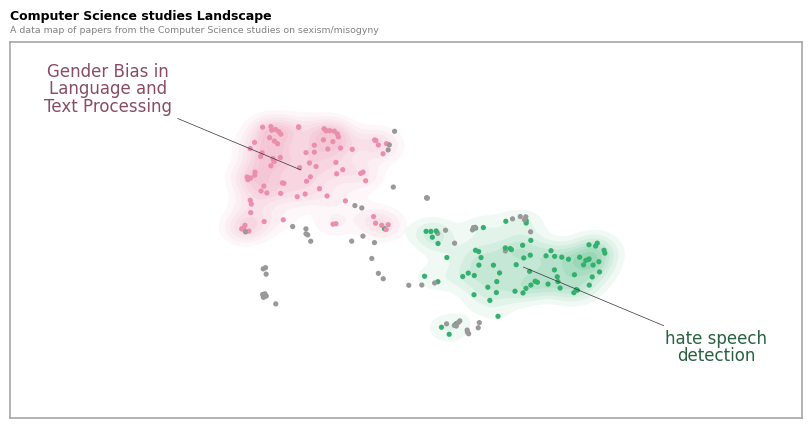

In [540]:
datamapplot.create_plot(
    reduced_embeddings_cs,
    all_labels_cs,
    title="Computer Science studies Landscape",
    sub_title="A data map of papers from the Computer Science studies on sexism/misogyny",
    highlight_labels=[
        "Hate Speech Detection in Social Media",
        'Hate speech detection using deep learning models '
    ],
    label_font_size=12,
    highlight_label_keywords={
        "fontsize": 18, "fontweight": "bold", "bbox":{"boxstyle":"circle", "pad":0.75}
    },
    #label_linespacing=1.25, # to check compactness in the text labels
    label_margin_factor=2.0,
    label_base_radius=6.0, # how further away from thr points should the labels be
    figsize=(8, 4),
    add_glow=True,
)

In [541]:
all_labels_cs.count('Hate speech detection using deep learning models ')

0

In [542]:
comp_doc_topic = pd.DataFrame({'document': df_arxiv_temp['title and abstract'], 'topic': topics_cs}).reset_index(drop=True)
comp_doc_topic

,document,topic
0,Deep Learning for Hate Speech Detection in Twe...,1
1,Automatic Misogyny Detection in Social Media P...,1
2,Online Hate Speech against Women: Automatic Id...,1
3,Now there are a lot like you: an artistic - ed...,-1
4,Counterfactually Augmented Data and Unintended...,-1
...,...,...
211,"Out of One, Many: Using Language Models to Sim...",0
212,"Sinophobia, misogyny, facism, and many more: A...",1
213,Unwanted Advances in Higher Education: Uncover...,-1
214,Hydra: A Peer to Peer Distributed Training & D...,1


In [543]:
comp_doc_topic_sub = comp_doc_topic[comp_doc_topic['topic'] == 0]
comp_doc_topic_sub = comp_doc_topic_sub.reset_index(drop=True)
comp_doc_topic_sub

,document,topic
0,Multi - Dimensional Gender Bias Classification...,0
1,Counterfactual Data Augmentation for Mitigatin...,0
2,Gender stereotype reinforcement: Measuring the...,0
3,<i>Pretty Princess vs</i>. <i>Successful Leade...,0
4,Understanding Undesirable Word Embedding Assoc...,0
...,...,...
78,On the Social and Technical Challenges of Web ...,0
79,Demographic Fairness in Biometric Systems: Wha...,0
80,Analyzing the Limits of Self - Supervision in ...,0
81,"Out of One, Many: Using Language Models to Sim...",0


#### Calculate the coherence scores

What you want here is to make sure that two things are prevented:

- Passing words that are not found in the dictionary
        - These are typically empty words
- Topics are completely empty

First, let's create a reproducible topic model that has some topics that topics that contain empty words.
https://github.com/MaartenGr/BERTopic/issues/90

In [544]:
# Preprocess Documents
documents = pd.DataFrame({"Document": df_arxiv_temp['title and abstract'],
                          "ID": range(len(df_arxiv_temp['title and abstract'])),
                          "Topic": topics_cs})
documents_per_topic = documents.groupby(['Topic'], as_index=False).agg({'Document': ' '.join})
cleaned_docs = topic_model_cs._preprocess_text(documents_per_topic.Document.values)

# Extract vectorizer and analyzer from BERTopic
vectorizer = topic_model_cs.vectorizer_model
analyzer = vectorizer.build_analyzer()

In [545]:
# Use .get_feature_names_out() if you get an error with .get_feature_names()
words = vectorizer.get_feature_names_out()

# Extract features for Topic Coherence evaluation
tokens = [analyzer(doc) for doc in cleaned_docs]
dictionary = corpora.Dictionary(tokens)
corpus = [dictionary.doc2bow(token) for token in tokens]

In [546]:
# Extract words in each topic if they are non-empty and exist in the dictionary
topic_words = []
for topic in range(len(set(topics_cs))-topic_model_cs._outliers):
    words = list(zip(*topic_model_cs.get_topic(topic)))[0]
    words = [word for word in words if word in dictionary.token2id]
    topic_words.append(words)
topic_words = [words for words in topic_words if len(words) > 0]

In [547]:
os.environ["TOKENIZERS_PARALLELISM"] = "false"

# Evaluate Coherence
coherence_model = CoherenceModel(topics=topic_words, 
                                 texts=tokens, 
                                 corpus=corpus,
                                 dictionary=dictionary, 
                                 coherence='c_v')
coherence = coherence_model.get_coherence()

In [548]:
coherence

0.3243833995934485

##### Perplexity scores

In [549]:
log_perplexity = -1 * np.mean(np.log(np.sum(probs_cs, axis=1)))
perplexity = np.exp(log_perplexity)

In [550]:
perplexity

1.216122327930037

In [551]:
topic_term_matrix = topic_model_cs.c_tf_idf_
words = topic_model_cs.vectorizer_model.get_feature_names_out()
words

array(['000', '033', '064', ..., 'zero', 'zone', 'zones'], dtype=object)

In [552]:
comp_doc_topic = pd.DataFrame({'document': df_arxiv_temp['title and abstract'], 'topic': topics_cs, 'year': df_arxiv_temp['pub_year']}).reset_index(drop=True)
comp_doc_topic

,document,topic,year
0,Deep Learning for Hate Speech Detection in Twe...,1,2017
1,Automatic Misogyny Detection in Social Media P...,1,2021
2,Online Hate Speech against Women: Automatic Id...,1,2019
3,Now there are a lot like you: an artistic - ed...,-1,2021
4,Counterfactually Augmented Data and Unintended...,-1,2022
...,...,...,...
211,"Out of One, Many: Using Language Models to Sim...",0,2022
212,"Sinophobia, misogyny, facism, and many more: A...",1,2022
213,Unwanted Advances in Higher Education: Uncover...,-1,2019
214,Hydra: A Peer to Peer Distributed Training & D...,1,2018


In [553]:
type(comp_doc_topic['year'].iloc[0])

numpy.int64

In [554]:
#comp_doc_topic = comp_doc_topic.loc[(comp_doc_topic['year'] < 2012) & (comp_doc_topic['year'] > 2022)]
#comp_doc_topic = comp_doc_topic[comp_doc_topic['year'].isin([2022, 2021, 2020, 2019, 2018, 2017, 2016, 2015,
#       2014, 2013, 2012])]

comp_doc_topic

,document,topic,year
0,Deep Learning for Hate Speech Detection in Twe...,1,2017
1,Automatic Misogyny Detection in Social Media P...,1,2021
2,Online Hate Speech against Women: Automatic Id...,1,2019
3,Now there are a lot like you: an artistic - ed...,-1,2021
4,Counterfactually Augmented Data and Unintended...,-1,2022
...,...,...,...
211,"Out of One, Many: Using Language Models to Sim...",0,2022
212,"Sinophobia, misogyny, facism, and many more: A...",1,2022
213,Unwanted Advances in Higher Education: Uncover...,-1,2019
214,Hydra: A Peer to Peer Distributed Training & D...,1,2018


In [555]:
comp_doc_topic.sort_values(by='year').reset_index()

,index,document,topic,year
0,136,Systemic lupus erythematosus in African - Amer...,-1,2003
1,137,Education in Conflict Zones: a Web and Mobilit...,-1,2012
2,81,Architectures of Virtual Decision - Making: Th...,0,2014
3,201,Learning to do diversity work: A model for con...,-1,2016
4,38,Shirtless and Dangerous: Quantifying Linguisti...,0,2016
...,...,...,...,...
211,126,TIB - VA at SemEval - 2022 Task 5: A Multimoda...,-1,2022
212,127,Codec at SemEval - 2022 Task 5: Multi - Modal ...,-1,2022
213,161,Making a Radical Misogynist: How online social...,-1,2022
214,122,Context - Aware Discrimination Detection in Jo...,0,2022


In [556]:
topics_per_class = topic_model_cs.topics_per_class(comp_doc_topic['document'], classes=comp_doc_topic['year'])

topic_model_cs.visualize_topics_per_class(topics_per_class, 
    top_n_topics=10, normalize_frequency = True)


ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'hoverinfo': 'text',
              'hovertext': [<b>Topic 0</b><br>Words: stereotypes, embedding,
                            gender, fiction, embeddings, <b>Topic 0</b><br>Words:
                            movie, movies, posters, bollywood, plots, <b>Topic
                            0</b><br>Words: gender, disadvantage, occupation, in,
                            word, <b>Topic 0</b><br>Words: gender, cs, stereotypes,
                            in, and, <b>Topic 0</b><br>Words: in, gender, the, to,
                            of, <b>Topic 0</b><br>Words: gender, bias, in, and, of,
                            <b>Topic 0</b><br>Words: gender, the, in, to, bias,
                            <b>Topic 0</b><br>Words: markets, sociology,
                            crowdfunding, structural, website],
              'marker': {'color': '#E69F00'},
              'name': '0_gender_in_the_of',
              'orientation': 'h',
              'type': 'bar',
              'visible': True,
              'x': array([0.08192319, 0.02730773, 0.21846185, 0.3550005 , 0.43692369, 0.54615461,
                          0.57346234, 0.02730773]),
              'y': array([2016, 2017, 2018, 2019, 2020, 2021, 2022, 2014])},
             {'hoverinfo': 'text',
              'hovertext': [<b>Topic 1</b><br>Words: presidential, election, 2016,
                            followers, images, <b>Topic 1</b><br>Words: hate,
                            speech, tweets, learning, to, <b>Topic 1</b><br>Words:
                            intent, of, rape, twitter, the, <b>Topic
                            1</b><br>Words: sexism, of, the, harassment, and,
                            <b>Topic 1</b><br>Words: workplace, of, the, hate,
                            detection, <b>Topic 1</b><br>Words: the, of, and, hate,
                            for, <b>Topic 1</b><br>Words: the, of, hate, to, and],
              'marker': {'color': '#56B4E9'},
              'name': '1_the_of_hate_and',
              'orientation': 'h',
              'type': 'bar',
              'visible': 'legendonly',
              'x': array([0.03165445, 0.22158113, 0.37985336, 0.41150781, 0.34819892, 0.5381256 ,
                          0.4748167 ]),
              'y': array([2016, 2017, 2018, 2019, 2020, 2021, 2022])}],
    'layout': {'height': 900,
               'hoverlabel': {'bgcolor': 'white', 'font': {'family': 'Rockwell', 'size': 16}},
               'legend': {'title': {'text': '<b>Global Topic Representation'}},
               'template': '...',
               'title': {'font': {'color': 'Black', 'size': 22},
                         'text': '<b>Topics per Class</b>',
                         'x': 0.4,
                         'xanchor': 'center',
                         'y': 0.95,
                         'yanchor': 'top'},
               'width': 1250,
               'xaxis': {'showgrid': True, 'title': {'text': 'Normalized Frequency'}},
               'yaxis': {'showgrid': True, 'title': {'text': 'Class'}}}
})

In [ ]:
comp_doc_topic[comp_doc_topic['topic'] == 0].sort_values(by='year').reset_index()

,index,document,topic,year
0,81,Architectures of Virtual Decision - Making: Th...,0,2014
1,62,Quantifying and Reducing Stereotypes in Word E...,0,2016
2,38,Shirtless and Dangerous: Quantifying Linguisti...,0,2016
3,80,Man is to Computer Programmer as Woman is to H...,0,2016
4,68,Analyzing Gender Stereotyping in Bollywood Mov...,0,2017
...,...,...,...,...
78,116,Assessing Demographic Bias Transfer from Datas...,0,2022
79,118,Jumping to male - dominated occupations: A nov...,0,2022
80,122,Context - Aware Discrimination Detection in Jo...,0,2022
81,72,Mitigating Gender Stereotypes in Hindi and Mar...,0,2022


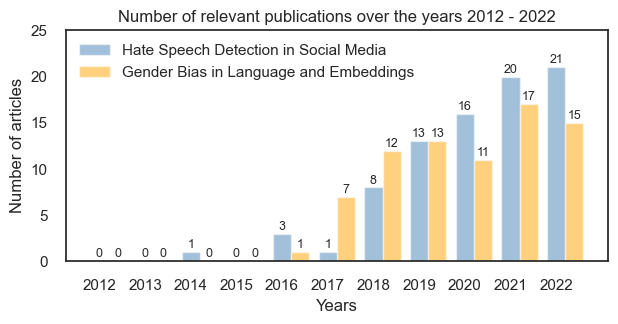

In [ ]:
dict_new = {
    'year':[2012, 2013, 2015], 
        'count':[0, 0, 0] 
       } 
df1 = pd.DataFrame(dict_new) 
years_top_1 = comp_doc_topic[comp_doc_topic['topic'] == 0].reset_index()
years_top_1 = years_top_1['year'].value_counts().reset_index(name='count')
years_top_1 = pd.concat([years_top_1, df1], ignore_index = True).sort_values(by='year')
dict_new = {
    'year':[2012, 2013, 2014, 2015], 
        'count':[0, 0, 0, 0] 
       } 
df2 = pd.DataFrame(dict_new) 
years_top_2 = comp_doc_topic[comp_doc_topic['topic'] == 1].reset_index()
years_top_2 = years_top_2['year'].value_counts().reset_index(name='count')
years_top_2 = pd.concat([years_top_2, df2], ignore_index = True).sort_values(by='year')

# Create a figure and a set of subplots
fig, ax = plt.subplots(figsize=(7, 3))

ax.bar(years_top_1['year'], years_top_1['count'], color='steelblue', alpha=0.5, width = 0.4, label='Hate Speech Detection in Social Media')
#ax.plot(years_top_1['year'], years_top_1['count'], marker='o', linestyle="--")
ax.bar(years_top_2['year']+0.4, years_top_2['count'], color='orange', alpha=0.5, width = 0.4, label='Gender Bias in Language and Embeddings')
#ax.plot(years_top_2['year']+0.4, years_top_2['count'], marker='o', linestyle="-")

# Add labels
ax.set_xlabel('Years') 
ax.set_ylabel('Number of articles')
ax.set_title('Number of relevant publications over the years 2012 - 2022')

ax.set_ylim([0, 25])

plt.xticks(years_top_1['year'])


rects = ax.patches

# Make some labels.
labels_1 = [f"{i}" for i in years_top_1['count']]

for rect, label in zip(rects, labels_1):
    height = rect.get_height()
    ax.text(
        rect.get_x() + rect.get_width() / 2, height + 0.1, label, ha="center", va="bottom", fontsize=9
    )

labels_2 = [f"{i}" for i in years_top_2['count']]
counts_2 = [i for i in years_top_2['count']]

for rect, label, height in zip(rects, labels_2, counts_2):
    #height = rect.get_height()
    ax.text(
        rect.get_x() + rect.get_width() / 2 + 0.4, height + 0.1, label, ha="center", va="bottom", fontsize=9
    )

# Add a legend
ax.legend()
# Show the plot
plt.show()

In [ ]:
topic_model_cs = topic_model_cs.set_topic_labels({-1:'Unlabelled', 0: 'Hate Speech Detection in Social Media', 1: 'Gender Bias in Language and Embeddings'})
topic_model_cs.visualize_term_rank(log_scale=True, topics=[0, 1], custom_labels=True, title='Term score decline per Topic', width=600, height=400)

AttributeError: 'NoneType' object has no attribute 'set_topic_labels'

In [84]:
comp_doc_topic[comp_doc_topic['topic'] == 3]

,document,topic
5,Should Course-based At-risk Predication Models...,3
9,E-FAIR-DB: Functional Dependencies to Discover...,3
16,Gradient Based Activations for Accurate Bias-F...,3
17,Anatomizing Bias in Facial Analysis Existing f...,3
34,A Systematic Literature Review of Anti-Discrim...,3
40,Bias on the Force Concept Inventory across the...,3
58,Measuring Fairness in Machine Learning Models ...,3
59,Study of medical students' learning approaches...,3
107,Development of an Active Health Dashboard for ...,3
115,A Multi-Center Comparison of Orthopaedic Atten...,3


In [87]:
comp_doc_topic['document'].iloc[5]

"Should Course-based At-risk Predication Models Include Protected Features? Nowadays, online learning is preferable as it allows learners to learn anytime and anywhere, especially in pandemic crisis. However, this type of learning suffers from high dropout and low completion rates. Identifying at-risk students can improve students' success and institutes effectiveness. Therefore, this paper proposes an at-risk predictive model by exploiting students behavioral and assessment data using data from a large distance-based university, Open University in UK. Unlike the tradition way of training and testing a model using one course, the proposed model is trained based on three historical course data and tested on the last offering. The prediction models show high performance values like 0.91 in accuracy. At same time, the paper examines if including protected feature like gender make prediction models discriminates against underrepresented student groups and aggravate present inequalities. To

In [82]:
topic_model_cs.visualize_barchart(topics=None, top_n_topics=20, n_words=10, custom_labels=True, width=350, height=350)

In [113]:
topic_model_cs.visualize_documents(abstract_df_cs['Title & Abstract'].to_list(), custom_labels=True, width=750, height=500) 

### Multidisciplinary

In [ ]:
# Create representation models
keybert_model = KeyBERTInspired(top_n_words=50, nr_repr_docs= 10, random_state=1234)
mmr_model = MaximalMarginalRelevance(diversity=0.0)
pos_patterns = [
            [{'POS': 'ADJ'}, {'POS': 'NOUN'}],
            [{'POS': 'NOUN'}], [{'POS': 'ADJ'}]
]
# DEFAULT_PATTERNS = [ [{'POS': 'ADJ'}, {'POS': 'NOUN'}], [{'POS': 'NOUN'}], [{'POS': 'ADJ'}] ]
pos_model = PartOfSpeech("en_core_web_sm", pos_patterns=pos_patterns) 

representation_models = [pos_model, keybert_model, mmr_model]

ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)

#word_model = api.load('fasttext-wiki-news-subwords-300')
sentence_model = SentenceTransformer("all-mpnet-base-v2") # all-MiniLM-L6-v2
#word_doc_embedder = WordDocEmbedder(embedding_model=sentence_model, word_embedding_model=word_model)
embeddings_mul = sentence_model.encode(abstract_df_mul['Title & Abstract'].astype(str).to_list(), show_progress_bar=True)

Batches:   0%|          | 0/2 [00:00<?, ?it/s]

In [ ]:
umap_model = umap.UMAP(n_neighbors=50, n_components=80, min_dist=0.0, metric='cosine', random_state=1234)
#vectorizer_model = CountVectorizer(stop_words="english")
vectorizer_model = TfidfVectorizer()
cluster_model = KMeans(n_clusters=20)

#reduced_embeddings_comp = umap.UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine').fit_transform(embeddings_comp)

topic_model_mul = BERTopic(
    language='english', # Set to 'multilingual' for datasets with languages other than English. # a few other languages set so changing from 'english'
    top_n_words=30,
    n_gram_range=(1, 3),
    #min_topic_size=10,
    nr_topics= 'auto',
    low_memory=False,
    calculate_probabilities=True, # The probabilities of all topics per document.
    representation_model=representation_models,
    embedding_model=sentence_model,
    hdbscan_model= cluster_model, 
    umap_model=umap_model, 
    vectorizer_model=vectorizer_model,
    ctfidf_model=ctfidf_model
)

In [ ]:
topics_mul, probs_mul = topic_model_mul.fit_transform(abstract_df_mul['Title & Abstract'].astype('str').to_list(), embeddings_mul)

In [ ]:
topics_mul = pd.DataFrame(topic_model_mul.get_topic_info())
topics_mul

,Topic,Count,Name,Representation,Representative_Docs
0,0,18,0_sexism_sexist_misogyny_language,"[sexism, sexist, misogyny, language, categoriz...",[As large Pre-trained Language Models (PLMs) t...
1,1,13,1_abusive_hate_racism_word2vec,"[abusive, hate, racism, word2vec, text, langua...",[Online Social Network has let people connect ...
2,2,12,2_bias_debiasing_embeddings_nlp,"[bias, debiasing, embeddings, nlp, corpus, cor...",[Masked Language Models (MLMs) pre-trained by ...
3,3,11,3_gendered_programmers_occupations_engineers,"[gendered, programmers, occupations, engineers...",[CS4 All initiatives nationwide have been work...
4,4,11,4_lgbtq_transgender_discrimination_stereotyping,"[lgbtq, transgender, discrimination, stereotyp...",[Online and social media platforms employ auto...
5,5,10,5_corpus_corpora_authorship_text,"[corpus, corpora, authorship, text, classifier...",[We explore the contribution of lexical and in...
6,6,10,6_anthropometry_anthropometric_femininity_endu...,"[anthropometry, anthropometric, femininity, en...",[This study's objective was to develop models ...
7,7,9,7_discrimination_disparities_inequities_women,"[discrimination, disparities, inequities, wome...",[This paper estimates size and impact factors ...
8,8,8,8_predicting_gender_data_forecasting,"[predicting, gender, data, forecasting, relati...",[Although social media plays a significant rol...


# On selected data only

In [264]:
df_arxiv['title'].map(df_comp['title'].value_counts()).sum()

11.0

In [265]:
df_arxiv['common'] = df_arxiv['title'].map(df_comp['title'].value_counts())
df_arxiv['common'].value_counts()

common
1.0    11
Name: count, dtype: int64

In [266]:
df_arxiv[df_arxiv['common'] == 1.0].index

Index([10, 27, 33, 48, 55, 74, 75, 77, 98, 103, 128], dtype='int64')

In [267]:
df_arxiv['title'].map(df_titles['title'].value_counts()).sum()

15.0

In [268]:
df_arxiv['common'] = df_arxiv['title'].map(df_titles['title'].value_counts())
df_arxiv['common'].value_counts()

common
1.0    15
Name: count, dtype: int64

In [269]:
df_arxiv[df_arxiv['common'] == 1.0].index

Index([6, 10, 19, 27, 33, 43, 48, 55, 70, 74, 75, 77, 98, 103, 128], dtype='int64')

In [ ]:
df_final = df_arxiv[df_arxiv['common'] == 1.0]
df_final = df_final.reset_index(drop=True)
df_final

In [236]:
"""social_media_lst = ["twitter", "facebook", "reddit", "instagram", "whatsapp",
                    "gab", "2chan", "4chan", "8chan", "youtube", "linkedin", "tumblr", "meta"]

pattern = '|'.join(r"\b{}\b".format(x) for x in social_media_lst)
df_final['title and abstract'] = df_final['title'] + '. ' + df_final['abstract']
df_final["platform"] = df_final['title and abstract'].str.findall(pattern, flags=re.I).str.join(' ')
#df_final["platform"].unique()
"""

# Function to keep only the first occurrence of a sub-string
def remove_dup(string):
    # split input string separated by space
    input = string.split(" ")
 
    # now create dictionary using counter method
    # which will have strings as key and their
    # frequencies as value
    UniqW = Counter(input)
 
    # joins two adjacent elements in iterable way
    s = " ".join(UniqW.keys())
    return s

# Replacing facebook with meta of any casing
#df_comp["Platform of interest"] = df_comp["Platform of interest"].apply(lambda x: re.sub("facebook", "meta", x, flags=re.I))

"""df_final["platform"] = df_final["platform"].apply(remove_dup)

df_final["platform"].value_counts()
"""

'df_final["platform"] = df_final["platform"].apply(remove_dup)\n\ndf_final["platform"].value_counts()\n'

In [ ]:
"""
df_social_media_counts = pd.DataFrame({'Social Media Platforms': ['Twitter / X', '4chan', 'Facebook',
                                                                 'YouTube', 'Meta', 'Instagram', 'Reddit'], 
                                       'Counts': [twitter_count, fourchan_count, fb_count,
                                                 youtube_count, meta_count, instagram_count, reddit_count]})
df_social_media_counts = df_social_media_counts.sort_values(by='Counts', ascending=False)

f, ax = plt.subplots(figsize=(8, 4))

p = sns.barplot(data=df_social_media_counts, x='Counts', y='Social Media Platforms', color='steelblue')
ax.set(xlim=(0, 60))
# new helper method to auto-label bars
ax.bar_label(ax.containers[0], fontsize=8, padding=1.5)
sns.despine(left=True, bottom=True)
p.set_xlabel("Social Media Platforms", fontsize=10)
p.set_ylabel("",fontsize=10)
# disabling yticks by setting yticks to an empty list
plt.xticks([]) 
p.tick_params(labelsize=8)
"""

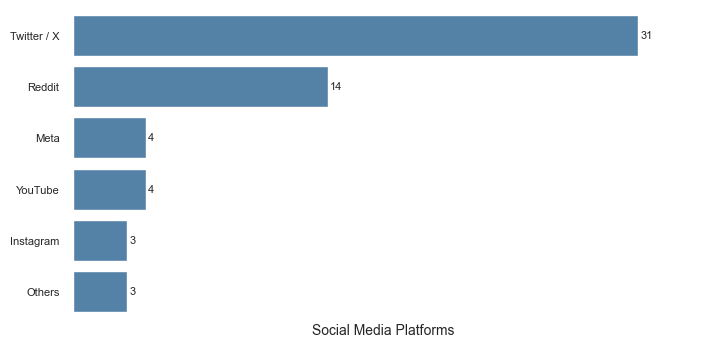

In [275]:
df_cs["platform"] = df_cs['title and abstract'].str.findall(pattern, flags=re.I).str.join(' ')
df_cs["platform"] = df_cs["platform"].apply(remove_dup)

twitter_count = df_cs["platform"].str.lower().str.contains('twitter').sum()
#fb_count = df_comp["Platform of interest"].str.lower().str.contains('facebook').sum()
#fourchan_count = df_cs["platform"].str.lower().str.contains('4chan').sum()
#eightchan_count = df_comp["Platform of interest"].str.lower().str.contains('8chan').sum()
youtube_count = df_cs["platform"].str.lower().str.contains('youtube').sum()
meta_count = df_cs["platform"].str.lower().str.contains('facebook|meta').sum() # containing facebook or meta
#fb_count = df_comp["Platform of interest"].str.lower().str.contains('facebook').sum()
instagram_count = df_cs["platform"].str.lower().str.contains('instagram').sum()
reddit_count = df_cs["platform"].str.lower().str.contains('reddit').sum()
#linkedin_count = df_cs["platform"].str.lower().str.contains('linkedin').sum()
others_count = df_cs["platform"].str.lower().str.contains('gab|4chan|linkedin|8chan').sum()


df_social_media_counts = pd.DataFrame({'Social Media Platforms': ['Twitter / X', 'Meta', #'4chan', 
                                                                 'YouTube', 'Meta', 'Instagram', 'Reddit', 'Others'], 
                                       'Counts': [twitter_count, meta_count, #fourchan_count, 
                                                 youtube_count, meta_count, instagram_count, reddit_count, others_count]})
df_social_media_counts = df_social_media_counts.sort_values(by='Counts', ascending=False)

f, ax = plt.subplots(figsize=(8, 4))

p = sns.barplot(data=df_social_media_counts, x='Counts', y='Social Media Platforms', color='steelblue')
ax.set(xlim=(0, 34))
# new helper method to auto-label bars
ax.bar_label(ax.containers[0], fontsize=8, padding=1.5)
sns.despine(left=True, bottom=True)
p.set_xlabel("Social Media Platforms", fontsize=10)
p.set_ylabel("",fontsize=10)
# disabling yticks by setting yticks to an empty list
plt.xticks([]) 
p.tick_params(labelsize=8)

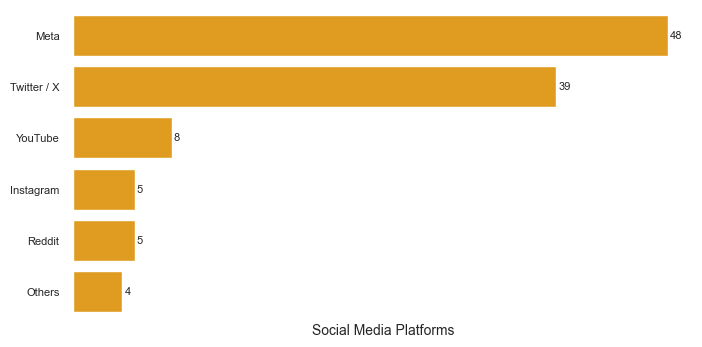

In [279]:
df_ss["platform"] = df_ss['title and abstract'].str.findall(pattern, flags=re.I).str.join(' ')
df_ss["platform"] = df_ss["platform"].apply(remove_dup)

twitter_count = df_ss["platform"].str.lower().str.contains('twitter').sum()
#fb_count = df_comp["Platform of interest"].str.lower().str.contains('facebook').sum()
#fourchan_count = df_cs["platform"].str.lower().str.contains('4chan').sum()
#eightchan_count = df_comp["Platform of interest"].str.lower().str.contains('8chan').sum()
youtube_count = df_ss["platform"].str.lower().str.contains('youtube').sum()
meta_count = df_ss["platform"].str.lower().str.contains('facebook|meta').sum() # containing facebook or meta
#fb_count = df_comp["Platform of interest"].str.lower().str.contains('facebook').sum()
instagram_count = df_ss["platform"].str.lower().str.contains('instagram').sum()
reddit_count = df_ss["platform"].str.lower().str.contains('reddit').sum()
#linkedin_count = df_cs["platform"].str.lower().str.contains('linkedin').sum()
others_count = df_ss["platform"].str.lower().str.contains('gab|4chan|linkedin|8chan').sum()


df_social_media_counts = pd.DataFrame({'Social Media Platforms': ['Twitter / X', 'Meta', #'4chan', 
                                                                 'YouTube', 'Meta', 'Instagram', 'Reddit', 'Others'], 
                                       'Counts': [twitter_count, meta_count, #fourchan_count, 
                                                 youtube_count, meta_count, instagram_count, reddit_count, others_count]})
df_social_media_counts = df_social_media_counts.sort_values(by='Counts', ascending=False)

f, ax = plt.subplots(figsize=(8, 4))

p = sns.barplot(data=df_social_media_counts, x='Counts', y='Social Media Platforms', color='orange')
ax.set(xlim=(0, 50))
# new helper method to auto-label bars
ax.bar_label(ax.containers[0], fontsize=8, padding=1.5)
sns.despine(left=True, bottom=True)
p.set_xlabel("Social Media Platforms", fontsize=10)
p.set_ylabel("",fontsize=10)
# disabling yticks by setting yticks to an empty list
plt.xticks([]) 
p.tick_params(labelsize=8)

### Document by models

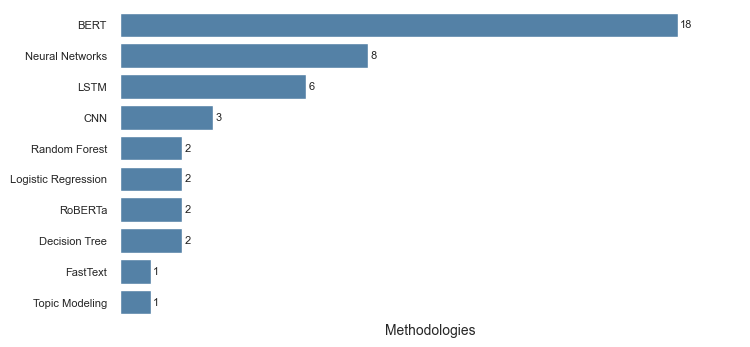

In [337]:
models_lst = ["SVM", "Support Vector Machine", "CNN", "Convolution Neural Network", "FastText", "LSTM", "GBDT", "MLP", "RF", "Random Forest", "NB", "Naıve Bayes",
    "Logistic Regression", "BERT", "Seq2Seq", "bi-LSTM", "Latent Dirichlet Allocation", "LDA", "One-vs-the-rest", "OvR", "Neural network architectures",
    "XLM-R", "XLM", "RoBERTa", "XGBoost", "GCN", "Graph Convolutional Network", "Feedforward Deep Neural Network", "DNN", "k-NearestNeighbours","kNN",
    "Ridge Classifier", "Decision Tree", "DT", "Neural Network"]

pattern = '|'.join(r"\b{}\b".format(x) for x in models_lst)

df_cs["models"] = df_cs['title and abstract'].str.findall(pattern, flags=re.I).str.join(' ')
df_cs['models'] = df_cs['models'].apply(remove_dup)

nn_count = df_cs["models"].str.lower().str.contains('neural network architecture|eural network|seq2seq|gcn|graph convolutional network|feedforward deep neural network|dnn').sum()
cnn_count = df_cs["models"].str.lower().str.contains('cnn|convolution neural network').sum()
fasttext_count = df_cs["models"].str.lower().str.contains('fasttext').sum() 
lstm_count = df_cs["models"].str.lower().str.contains('lstm|bi-lstm').sum()
bert_count = df_cs["models"].str.lower().str.contains('bert').sum()
mlp_count = df_cs["models"].str.lower().str.contains('mlp').sum()
nb_count = df_cs["models"].str.lower().str.contains('nb|naıve bayes').sum()
rf_count = df_cs["models"].str.lower().str.contains('rf|random forest').sum()
lr_count = df_cs["models"].str.lower().str.contains('logistic regression').sum()
tm_count = df_cs["models"].str.lower().str.contains('topic modeling|latent dirichlet allocation|lda').sum()
roberta_count = df_cs["models"].str.lower().str.contains('roberta|xlm').sum()
dt_count = df_cs["models"].str.lower().str.contains('decision tree|dt').sum()

df_methods_counts = pd.DataFrame({'Methodologies': ['Neural Networks', 'CNN', 'FastText', 'LSTM',
                                                    'BERT', 'Random Forest', 
                                                    'Logistic Regression', 'Topic Modeling', 
                                                    'RoBERTa', 'Decision Tree'], 
                                       'Counts': [nn_count, cnn_count, fasttext_count, lstm_count,
                                                  bert_count, rf_count, 
                                                  lr_count, tm_count, roberta_count, dt_count]})
df_methods_counts = df_methods_counts.sort_values(by='Counts', ascending=False)

f, ax = plt.subplots(figsize=(8, 4))

p = sns.barplot(data=df_methods_counts, x='Counts', y='Methodologies', color='steelblue')
ax.set(xlim=(0, 20))
# new helper method to auto-label bars
ax.bar_label(ax.containers[0], fontsize=8, padding=1.5)
sns.despine(left=True, bottom=True)
p.set_xlabel("Methodologies", fontsize=10)
p.set_ylabel("",fontsize=10)
# disabling yticks by setting yticks to an empty list
plt.xticks([]) 
p.tick_params(labelsize=8)

## Documents by benchmark datasets

In [341]:
dataset_list = ['EVALITA2018', 'EN-EVALITA', 'EVALITA', 'EVALITA2020', '16k tweets SRW', 'MLMA', 'Hate Speech MLMA', 'Urban Dictionary Definitions', 'ISEP Sexist Workplace Statements',
                'TRAC2020', 'TRAC', 'IberEval2018', 'MEX-A3T', 'IberEval', 'twitter hate-speech dataset by Waseem', 'EXIST', 'ISG Identity Subgroup', 'Samory et al.',
                'HC Hatecheck', 'Tweets With Emojis', 'Call Me Sexist', 'counterfactual', 'reports from Everyday Sexism Project website', 'ESP', 'AMI', 'HaSpeeDe 2',
                'Chiril et al.', 'Danish colloquial web speech', 'HatEval2019', 'MeTwo', 'InterTASS', 'International TASS Corpus', 'EmoEvent', 'Tweet Sentiment to CSV',
                'sitcoms', 'Subslikescript', 'Multilingual Gender Biased and Communal Language Identification', 'ICON', 'Wikipedia',
                'Yelp Reviews', 'ConvAI2', 'ImageChat', 'OpenSubtitles']

pattern = '|'.join(r"\b{}\b".format(x) for x in dataset_list)

df_cs["dataset"] = df_cs['title and abstract'].str.findall(pattern, flags=re.I).str.join(' ')
df_cs['dataset'] = df_cs['dataset'].apply(remove_dup)

df_cs['dataset'].value_counts()


dataset
                  184
exist               5
EXIST               4
Wikipedia           3
AMI                 1
sitcoms             1
Counterfactual      1
counterfactual      1
Call me sexist      1
AMI EVALITA         1
Exist               1
Name: count, dtype: int64

In [ ]:
prompt = """ Q:
I want to find the research objectives from the following document: [DOCUMENT]

Based on the provided information, can you give a short label of the research objectives of at most 5 words?
DOCUMENT:
"""
llm = LlamaCpp(
    model_path="../openhermes-2.5-mistral-7b.Q3_K_M.gguf", 
    temperature=0.75,
    max_tokens=2000,
    n_gpu_layers=-1,
    f16_kv=True,  # MUST set to True, otherwise you will run into problem after a couple of calls
    top_p=1,
    #callback_manager=callback_manager,
    verbose=True,  # Verbose is required to pass to the callback manager
)

#llm_chain = LLMChain(prompt=prompt, llm=llm)

#question = df_cs['title and abstract'].iloc[0]
#llm_chain.run(question)


In [ ]:
llm(df_cs['title and abstract'].iloc[0])

In [449]:
df_cs['title and abstract'].iloc[0]

'Deep Learning for Hate Speech Detection in Tweets. Hate speech detection on Twitter is critical for applications like controversial event extraction, building AI chatterbots, content recommendation, and sentiment analysis. We define this task as being able to classify a tweet as racist, sexist or neither. The complexity of the natural language constructs makes this task very challenging. We perform extensive experiments with multiple deep learning architectures to learn semantic word embeddings to handle this complexity. Our experiments on a benchmark dataset of 16K annotated tweets show that such deep learning methods outperform state - of - the - art char/word n - gram methods by similar to 18 F1 points.'

In [247]:
social_media_lst = ["twitter", "facebook", "reddit", "instagram", "whatsapp",
                    "gab", "2chan", "4chan", "8chan", "youtube", "linkedin", "tumblr", "meta"]

pattern = '|'.join(r"\b{}\b".format(x) for x in social_media_lst)
comp_doc_topic_sub["platform"] = comp_doc_topic_sub['document'].str.findall(pattern, flags=re.I).str.join(' ')

In [249]:
task_list = ['identification', 'identify ', 'detection', 'detect ', 'classify ', 'classification']

pattern = '|'.join(r"\b{}\b".format(x) for x in task_list)


comp_doc_topic_sub["task_type"] = comp_doc_topic_sub['document'].str.findall(pattern, flags=re.I).str.join(' ')
comp_doc_topic_sub["task_type"] = comp_doc_topic_sub["task_type"].apply(lambda x: x.lower())

comp_doc_topic_sub["task_type"] = comp_doc_topic_sub["task_type"].apply(lambda x: x.ljust(5))

comp_doc_topic_sub["task_type"] = comp_doc_topic_sub["task_type"].apply(lambda x: x.replace("indentify ", "identification"))
comp_doc_topic_sub["task_type"] = comp_doc_topic_sub["task_type"].apply(lambda x: x.replace("detect ", "detection"))
comp_doc_topic_sub["task_type"] = comp_doc_topic_sub["task_type"].apply(lambda x: x.replace("classify ", "classification"))
comp_doc_topic_sub["task_type"] = comp_doc_topic_sub["task_type"].apply(lambda x: re.sub(' +', ' ', x))
comp_doc_topic_sub["task_type"] = comp_doc_topic_sub["task_type"].apply(lambda x: x.replace("indentify", "identification"))

comp_doc_topic_sub['task_type'] = comp_doc_topic_sub['task_type'].apply(remove_dup)

comp_doc_topic_sub['task_type'].value_counts()

task_type
                                                     26
detection classification                             17
detection                                            17
classification detection                              9
classification                                        7
detection identification                              6
detection identify                                    3
identify                                              2
identification                                        2
identification detection                              2
identification classification                         2
identification detection classification identify      1
identify detection identification                     1
classification identification                         1
detection classification identification identify      1
identify classification detection                     1
identification classification detection               1
identification identify classification

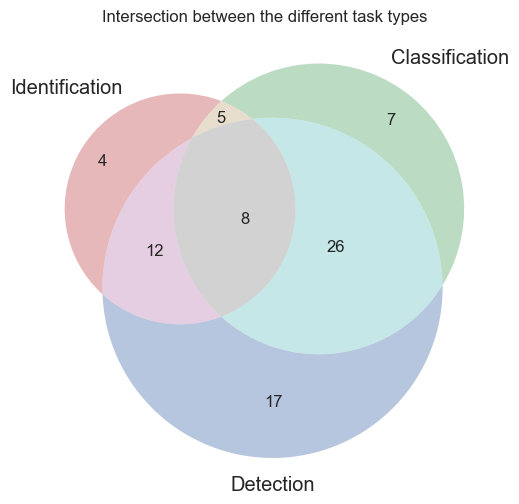

In [250]:
d1 = comp_doc_topic_sub[comp_doc_topic_sub['task_type'].str.contains(pat='identification', regex=False)].index.tolist()
d1_1 = comp_doc_topic_sub[comp_doc_topic_sub['task_type'].str.contains(pat='identify', regex=False)].index.tolist()
d1 = d1 + d1_1
d1 = list(dict.fromkeys(d1))

d2 = comp_doc_topic_sub[comp_doc_topic_sub['task_type'].str.contains(pat='classification', regex=False)].index.tolist()
d3 = comp_doc_topic_sub[comp_doc_topic_sub['task_type'].str.contains(pat='detection', regex=False)].index.tolist()

# Visualize the intersection through venn diagram
plt.style.use('seaborn-v0_8')
 
plt.figure(figsize=(10,6))
plt.title("Intersection between the different task types")

venn3([set(d1), 
       set(d2),
       set(d3)],
       set_labels=('Identification', 'Classification', 'Detection')
     )

plt.show()
dataset_dict = {
        'Identification': set(d1),
    'Classification': set(d2),
    'Detection': set(d3),
    }
#venn(dataset_dict, fmt="{percentage:.1f}%", fontsize=8, legend_loc="upper right")

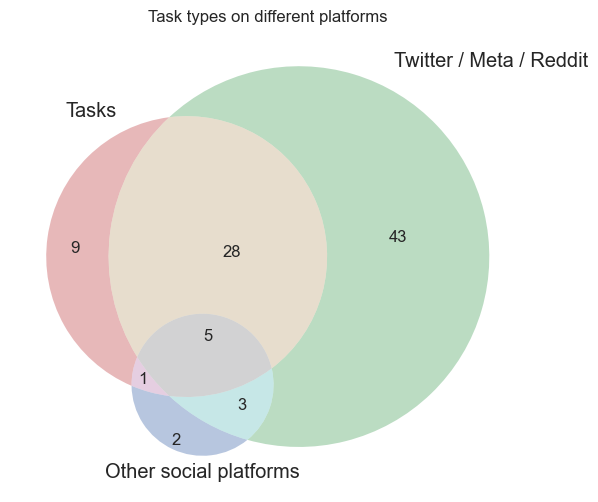

In [251]:
d1 = comp_doc_topic_sub[comp_doc_topic_sub["platform"].str.lower().str.contains('twitter|reddit|meta|facebook')].index.tolist()

d2 = comp_doc_topic_sub[comp_doc_topic_sub['task_type'].str.contains(pat='identification', regex=False)].index.tolist()
d2_1 = comp_doc_topic_sub[comp_doc_topic_sub['task_type'].str.contains(pat='identify', regex=False)].index.tolist()
d2_2 = comp_doc_topic_sub[comp_doc_topic_sub['task_type'].str.contains(pat='classification', regex=False)].index.tolist()
d2_3 = comp_doc_topic_sub[comp_doc_topic_sub['task_type'].str.contains(pat='detection', regex=False)].index.tolist()
d2 = d2 + d2_1 + d2_2 + d2_3
d2 = list(dict.fromkeys(d2))

d3 = comp_doc_topic_sub[comp_doc_topic_sub["platform"].str.lower().str.contains('gab|4chan|linkedin|8chan|youtube|instagram')].index.tolist()

plt.style.use('seaborn-v0_8')
 
plt.figure(figsize=(10,6))
plt.title("Task types on different platforms")

venn3([set(d1), 
       set(d2),
       set(d3)],
       set_labels=('Tasks', 'Twitter / Meta / Reddit', 'Other social platforms')
     )

plt.show()
dataset_dict = {
        'Tasks': set(d1),
    'Twitter / Meta / Reddit': set(d2),
    'Other social platforms': set(d3),
    }

## Keyword selection for the comp_science

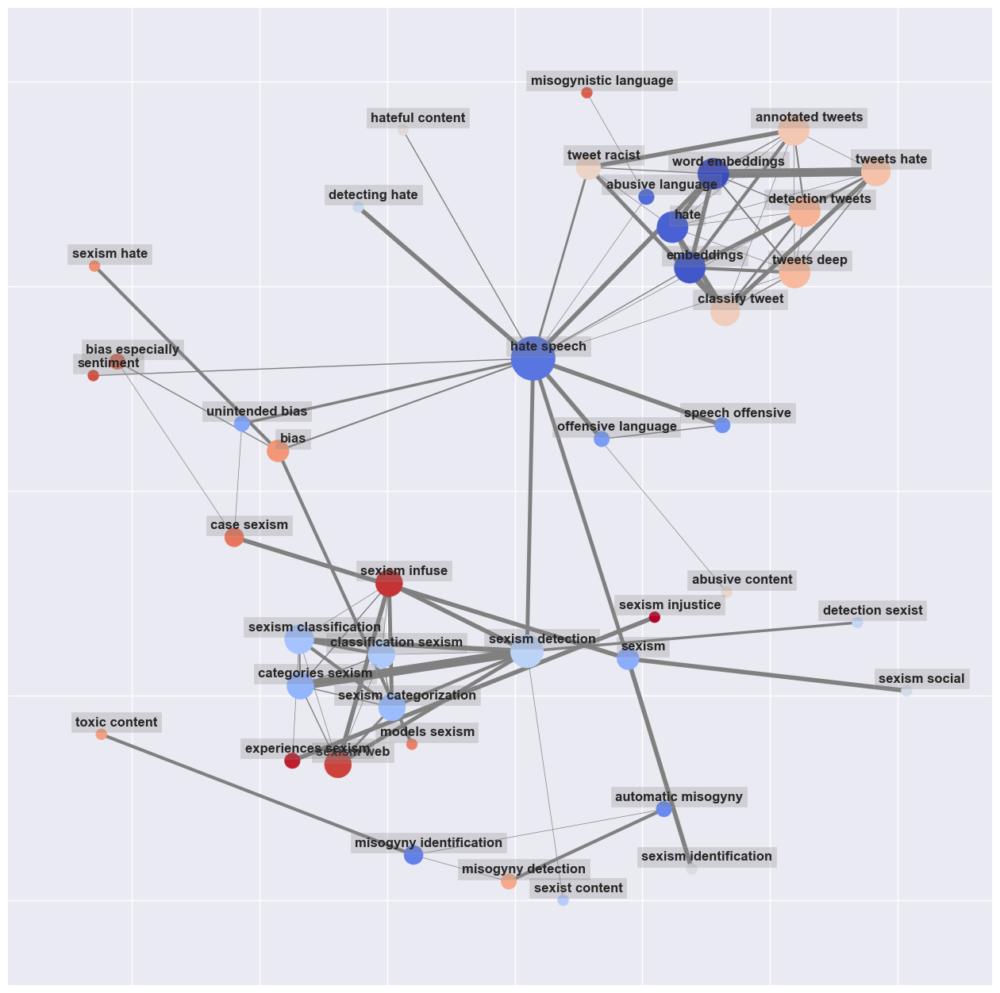

In [276]:
comp_doc_topic_sub['keywords_abstract'] = comp_doc_topic_sub['document'].apply(extraction)
comp_doc_topic_sub['coupled_keywords_abstract'] = comp_doc_topic_sub['keywords_abstract'].apply(remove_words)
comp_doc_topic_sub['coupled_keywords_abstract'] = comp_doc_topic_sub['coupled_keywords_abstract'].apply(coupling_terms)

terms_b_cs= comp_doc_topic_sub['coupled_keywords_abstract'] 
bigrams_cs = list(chain.from_iterable(terms_b_cs)) #list(itertools.chain(*terms_b))

# Create counter of words in clean bigrams
bigram_counts_cs = collections.Counter(bigrams_cs)

bigram_df_cs = pd.DataFrame(bigram_counts_cs.most_common(100),
                             columns=['bigram', 'count'])
d_cs = bigram_df_cs.set_index('bigram').T.to_dict('records')

d_cs = bigram_df_cs.set_index('bigram').T.to_dict('records')

# Create network plot 
G = nx.Graph()

# Create connections between nodes
for k, v in d_cs[0].items():
    G.add_edge(k[0], k[1], weight=(v * 10))
    degree = dict(G.degree)

color_lookup = {k:v for v, k in enumerate(sorted(set(G.nodes())))}

low, *_, high = sorted(color_lookup.values())
norm = mpl.colors.Normalize(vmin=low, vmax=high, clip=True)
mapper = mpl.cm.ScalarMappable(norm=norm, cmap=mpl.cm.coolwarm)


fig, ax = plt.subplots(figsize=(16, 16))

pos = nx.spring_layout(G, k=2)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=10,
                 width=[v * 0.5 for v in degree.values()],
                 edge_color='grey',
                 node_color= [mapper.to_rgba(i) 
                    for i in color_lookup.values()],           #'purple',
                 nodelist=degree.keys(), node_size=[v * 100 for v in degree.values()],
                 with_labels = False,
                 ax=ax)

# Create offset labels
for key, value in pos.items():
    x, y = value[0]+.03, value[1]+.02
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='grey', alpha=0.25),
            horizontalalignment='center', fontsize=12, weight='bold')
    
plt.show()


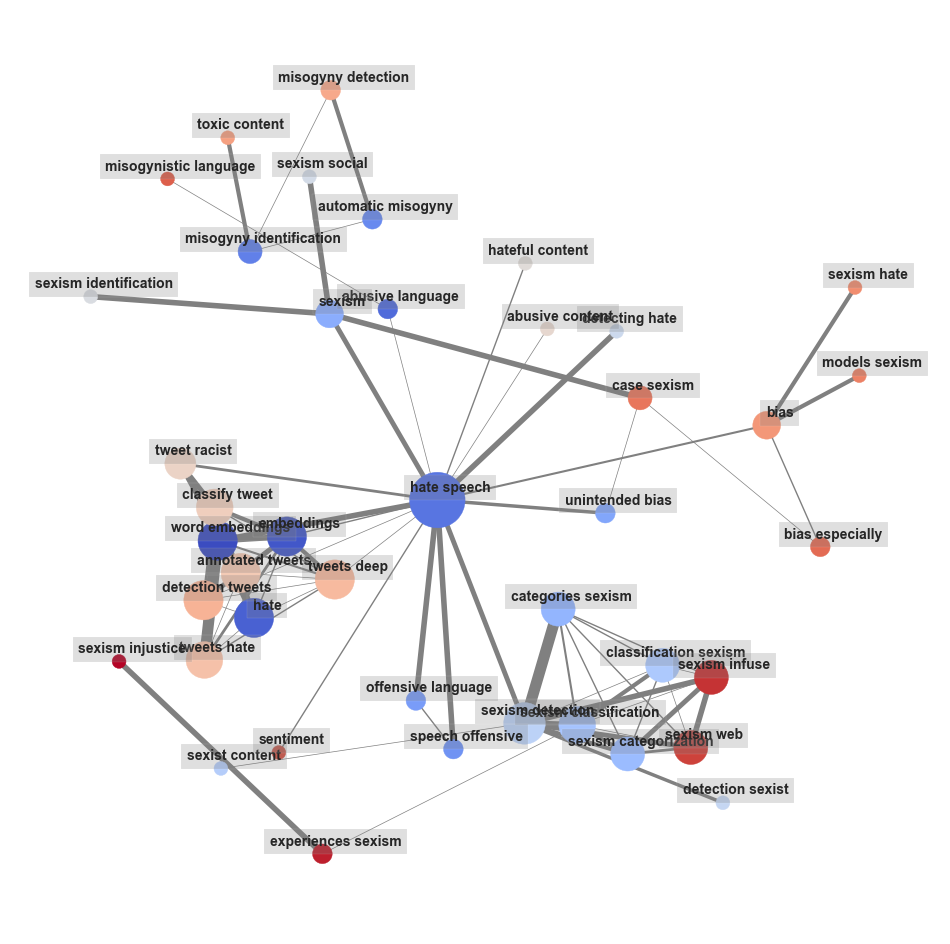

In [281]:
fig, ax = plt.subplots(figsize=(12, 12))

pos = nx.spring_layout(G, k=2)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=10,
                 width=[v * 0.5 for v in degree.values()],
                 edge_color='grey',
                 node_color= [mapper.to_rgba(i) 
                    for i in color_lookup.values()],           #'purple',
                 nodelist=degree.keys(), node_size=[v * 100 for v in degree.values()],
                 with_labels = False,
                 ax=ax)

# Create offset labels
for key, value in pos.items():
    x, y = value[0]+.03, value[1]+.02
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='grey', alpha=0.25),
            horizontalalignment='center', fontsize=10, weight='bold')
ax.set_facecolor("white")
plt.grid(False)
    
plt.show()


In [230]:
# saving graph created above in gexf format
nx.write_gexf(G, "comp_keys.gexf")